# Table of Content

> [1.Business problem Statment](#BPS)

> [2.Data Dictionary](#DD)
>> [2.1 Time Series Dataset](#TS)

>> [2.2 Qualitative Dataset](#QS)

> [3.Data Loading](#DL)

> [4.Time Series dataset](#TSD)
>> [4.1 Data Overview ](#DO1)

>> [4.2 Data Enrichment](#DE1)

> [5.Store Features Dataset](#SFD)

>> [5.1 Data Overview ](#DO2)

> [6.Merged Dataset](#MD)

>> [6.1 Data Overview ](#DO3)

>> [6.2 Label Encoding ](#LE)

> [7.Pre-modelling](#PMO)

>> [7.1 Data Pre-processing](#DAP)

>> [7.2 Time Series Decomposition](#TSD)

>> [7.3 Stationarity Check](#SC)

>> [7.4 Data Clustering](#DC)

> [8. Model Development](#MD)

>> [8.1 Prophet Model](#PM)

>>> [8.1.1 Cluster-1](#C1)

>>> [8.1.2 Cluster-2](#C2)

>>> [8.1.3 Cluster-3](#C3)

>>> [8.1.4 Cluster-4](#C4)

>> [8.2 Arima Model](#AM)

>> [8.3 Sarima Model](#SM)

>>> [8.3.1 Sarima on Single Site](#SS)

>>> [8.3.2 Sarima on Bonfire_Clustered](#SBC)

>> [8.4 ETS Model](#ETS)

> [9.Summary](#SU)

> [10.Individual Contribution](#IC)

#<a name = "BPS"> Business problem Statement</a>

A retail convenience chain, Maverik, fuels adventures in more than 380 locations across 12 western states. Maverik is known for premium BonFire food, diesel and unleaded fuel, and in-store merchandise. The company is on an expansion spree and as part of its growth, it recently acquired “ Kum & Go” nearly doubling its store count.

**Problem statement**  
The company is planning to open 30 new stores yearly in a new market, and it needs to forecast daily sales for the new store. This is crucial for financial planning and return on investment (ROI) assessment for these new stores. The challenge lies in predicting the first-year sales for these newly acquired stores accurately.

We have limited amount of data; therefore, we will be using currently available historical dataset to address analytical problems we will be addressing in this project are *identifying trends and patterns in sales data*, *understanding the relationship between sales and other factors*, and *identifying outliers and anomalies*. By addressing these analytical problems, we will be able to build a sales forecasting model.

**Solution**  
We will develop a sales forecasting model that can accurately predict daily sales for the new store. We will be using a variety of forecasting methods, such as time series analysis, regression analysis, causal analysis, and machine learning. The model will be evaluated by comparing its prediction to actual sales data from a holdout dataset. The model performance will be evaluated using industry-standard metrics such as Forecast Accuracy Metrics (e.g. MAE, MAPE, RMSE) and its ability to update forecasts dynamically in response to new data.

This sales forecasting model will help the company to make informed decisions about staffing, inventory, and marketing for the new stores. This can help the company to maximize its profits and minimize its losses while maintaining customer satisfaction.

#<a name = "DD">Data Dictionary</a>

##<a name = "TS"> Time Series Dataset </a>

**capital_projects.soft_opening_date** : The date this store opened

**calendar.calendar_day_date** : date

**calendar.fiscal_week_id_for_year** : Fiscal Week Number

**calendar.day_of_week** : Day of the week

**calendar_information.holiday** : Holiday information for that date

**calendar_information.type_of_day** : Day type

**daily_yoy_ndt.total_inside_sales** : Inside sales, everything that isn't made at the store

**daily_yoy_ndt.total_food_service** : Food service sales, everything that is made at the store

**diesel** : Diesel gallons sold

**unleaded** : all non-diesel(unleaded) gallons sold

**site_id_msba** : Unique site key


##<a name = "QS"> Qualitative Dataset </a>

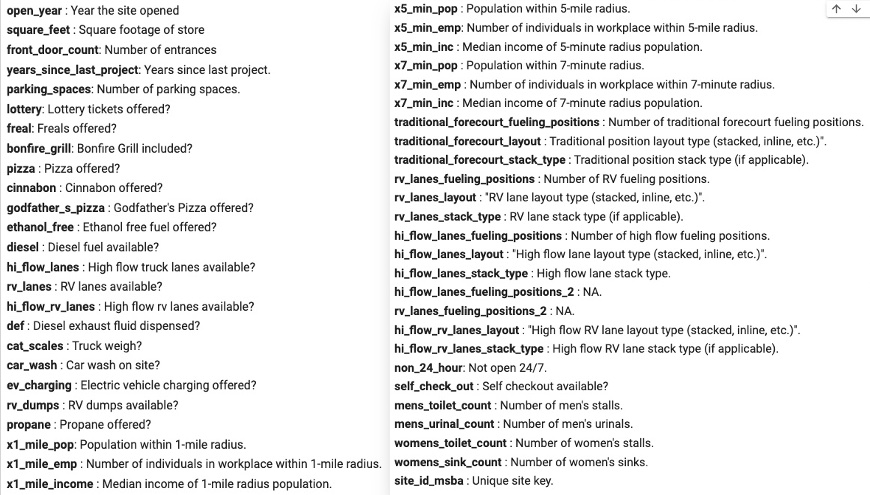

Based on the information given to us thus far, key columns for later merge train & test tables are going to be:

timeseries --> site_id_msba  
qualitative_data --> site_id_msba



*   Is there seasonality in gasoline sales?
*   How do sales differ by day?
*   What's the scope of NAs? Should we consider dropping columns based on NAs and variance?
*   What are the trends in sales over time?
* What factors influence the variation in sales across the months?
* Are there any trends in the sales data over time?
* How do the sales of the different products compare to each other?
* What are the key drivers of sales for each category?





#<a name = "DL"> Data Loading</a>

Loading our datasets and adding all necessary packages for the project.

In [1]:
#Mounting Google Drive
from google.colab import drive
drive.mount('/content/gdrive')


Mounted at /content/gdrive


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import numpy as np
from itertools import combinations
from scipy.optimize import fminbound
from sklearn.metrics import mean_absolute_error, mean_squared_error
from prophet import Prophet
from sklearn.preprocessing import LabelEncoder
import copy
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from statsmodels.tsa.arima.model import ARIMA
from sklearn.model_selection import TimeSeriesSplit
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from itertools import combinations

import warnings
warnings.filterwarnings('ignore')

import logging
logging.basicConfig(level=logging.WARNING)
logging.getLogger('prophet').propagate = False
logging.getLogger('cmdstanpy').propagate = False
logging.getLogger('cmdstanpy').setLevel(logging.ERROR)

In [ ]:
#Loading and renaming datasets for easy use. Qualitative is named as store_features
timeseries = pd.read_csv('/content/gdrive/MyDrive/Final Capstone - MSBA/Maverik/time_series_data_msba.csv')
store_features = pd.read_csv('/content/gdrive/MyDrive/Final Capstone - MSBA/Maverik/qualitative_data_msba.csv')

#<a name = "TSD"> Time series Dataset </a>

##<a name = "DO1"> Data Overview </a>

In [ ]:
# Displays information about the DataFrame
timeseries.info()

#Top 5 Rows of Dataset
display(timeseries.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13908 entries, 0 to 13907
Data columns (total 12 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Unnamed: 0                          13908 non-null  int64  
 1   capital_projects.soft_opening_date  13908 non-null  object 
 2   calendar.calendar_day_date          13908 non-null  object 
 3   calendar.fiscal_week_id_for_year    13908 non-null  int64  
 4   calendar.day_of_week                13908 non-null  object 
 5   calendar_information.holiday        13908 non-null  object 
 6   calendar_information.type_of_day    13908 non-null  object 
 7   daily_yoy_ndt.total_inside_sales    13908 non-null  float64
 8   daily_yoy_ndt.total_food_service    13908 non-null  float64
 9   diesel                              13908 non-null  float64
 10  unleaded                            13908 non-null  float64
 11  site_id_msba                        13908

,Unnamed: 0,capital_projects.soft_opening_date,calendar.calendar_day_date,calendar.fiscal_week_id_for_year,calendar.day_of_week,calendar_information.holiday,calendar_information.type_of_day,daily_yoy_ndt.total_inside_sales,daily_yoy_ndt.total_food_service,diesel,unleaded,site_id_msba
0,1,2022-06-14,2022-06-17,25,Friday,NONE,WEEKDAY,2168.2920,861.6930,722.7745,1425.1020,24535
1,2,2022-06-14,2022-06-22,25,Wednesday,NONE,WEEKDAY,2051.5635,808.0275,730.4850,1436.2740,24535
2,3,2022-06-14,2022-06-23,25,Thursday,NONE,WEEKDAY,2257.5000,966.4410,895.7970,1594.3725,24535
3,4,2022-06-14,2022-06-26,26,Sunday,NONE,WEEKEND,1520.5925,542.3250,584.2900,1124.9280,24535
4,5,2022-06-14,2022-06-27,26,Monday,NONE,WEEKDAY,1897.6930,771.4525,852.2605,1640.2540,24535


Starting position of timeseries dataset -- 12 columns, 13908 rows. dtypes: float64(4), int64(3), object(5). There seems to be redundancy in data index with "Unnamed" column; therefore, this is being deleted below.

In [ ]:
timeseries = timeseries.drop(timeseries.columns[0], axis = 1)

#Dataset overview after dropping unnamed column.
timeseries.head()

,capital_projects.soft_opening_date,calendar.calendar_day_date,calendar.fiscal_week_id_for_year,calendar.day_of_week,calendar_information.holiday,calendar_information.type_of_day,daily_yoy_ndt.total_inside_sales,daily_yoy_ndt.total_food_service,diesel,unleaded,site_id_msba
0,2022-06-14,2022-06-17,25,Friday,NONE,WEEKDAY,2168.2920,861.6930,722.7745,1425.1020,24535
1,2022-06-14,2022-06-22,25,Wednesday,NONE,WEEKDAY,2051.5635,808.0275,730.4850,1436.2740,24535
2,2022-06-14,2022-06-23,25,Thursday,NONE,WEEKDAY,2257.5000,966.4410,895.7970,1594.3725,24535
3,2022-06-14,2022-06-26,26,Sunday,NONE,WEEKEND,1520.5925,542.3250,584.2900,1124.9280,24535
4,2022-06-14,2022-06-27,26,Monday,NONE,WEEKDAY,1897.6930,771.4525,852.2605,1640.2540,24535


In [ ]:
timeseries.dtypes

capital_projects.soft_opening_date     object
calendar.calendar_day_date             object
calendar.fiscal_week_id_for_year        int64
calendar.day_of_week                   object
calendar_information.holiday           object
calendar_information.type_of_day       object
daily_yoy_ndt.total_inside_sales      float64
daily_yoy_ndt.total_food_service      float64
diesel                                float64
unleaded                              float64
site_id_msba                            int64
dtype: object

**Which features are categorical?**  
These values classify the samples into sets of similar samples. Within categorical features are the values nominal, ordinal, ratio, or interval based. Among other things this helps us select the appropriate plots for visualization.



Categorical feature :  5  
['capital_projects.soft_opening_date', 'calendar.calendar_day_date', 'calendar.day_of_week', 'calendar_information.holiday', 'calendar_information.type_of_day']

**Which features are numerical?**  
These values change from sample to sample. Within numerical features are the values discrete, continuous, or timeseries based. Among other things this helps us select the appropriate plots for visualization.

Numerical feature :  6  
Discrete feature :  0  
Continous feature :  6  
['calendar.fiscal_week_id_for_year', 'daily_yoy_ndt.total_inside_sales', 'daily_yoy_ndt.total_food_service', 'diesel', 'unleaded', 'site_id_msba']

##<a name = "DE1"> Data Enrichment </a>

In [ ]:
timeseries['capital_projects.soft_opening_date'] = pd.to_datetime(timeseries['capital_projects.soft_opening_date'])
timeseries['calendar.calendar_day_date'] = pd.to_datetime(timeseries['calendar.calendar_day_date'])


In [ ]:
timeseries.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13908 entries, 0 to 13907
Data columns (total 11 columns):
 #   Column                              Non-Null Count  Dtype         
---  ------                              --------------  -----         
 0   capital_projects.soft_opening_date  13908 non-null  datetime64[ns]
 1   calendar.calendar_day_date          13908 non-null  datetime64[ns]
 2   calendar.fiscal_week_id_for_year    13908 non-null  int64         
 3   calendar.day_of_week                13908 non-null  object        
 4   calendar_information.holiday        13908 non-null  object        
 5   calendar_information.type_of_day    13908 non-null  object        
 6   daily_yoy_ndt.total_inside_sales    13908 non-null  float64       
 7   daily_yoy_ndt.total_food_service    13908 non-null  float64       
 8   diesel                              13908 non-null  float64       
 9   unleaded                            13908 non-null  float64       
 10  site_id_msba          

These lines of code convert the 'capital_projects.soft_opening_date' and 'calendar.calendar_day_date' columns from their current data type to datetime data type . This conversion allows for more effective handling and analysis of date-related data.

In [ ]:
timeseries= timeseries.set_index('calendar.calendar_day_date')

This line of code sets the 'calendar.calendar_day_date' column as the "index" of the DataFrame 'time_series'. This means that the date column is used as the row labels for the DataFrame, which can be helpful for time series analysis and accessing data by date.

In [ ]:
timeseries['Year'] = timeseries.index.year
timeseries['Month'] = timeseries.index.month
timeseries['Day'] = timeseries.index.day
timeseries['DayOfYear'] = timeseries.index.dayofyear

These lines of code create new columns in the 'time_series' DataFrame: 'Year', 'Month', 'Day', and 'DayOfYear'.

- 'Year' column stores the year component of the date.
- 'Month' column stores the month component of the date.
- 'Day' column stores the day component of the date.
- 'DayOfYear' column stores the day of the year for each date.

In [ ]:
#Creating function to calculate season
def map_month_to_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Fall'

#Adds "season" column to the timeseries dataset
timeseries['season'] = timeseries.index.month.map(map_month_to_season)

This code defines a function `map_month_to_season` that takes a month (numeric) as input and returns a corresponding season as a string.  Seasons are categorized as 'Winter' (December, January, February), 'Spring' (March, April, May), 'Summer' (June, July, August), and 'Fall' (September, October, November).

In [ ]:
timeseries.sort_index(inplace=True)

The code sorts the DataFrame 'time_series' based on its index in ascending order.  After executing this code, the 'time_series' DataFrame will be sorted based on its index, and the rows will be arranged in ascending order of the index values.

In [ ]:
#Overview of the dataset
timeseries.head()

,capital_projects.soft_opening_date,calendar.fiscal_week_id_for_year,calendar.day_of_week,calendar_information.holiday,calendar_information.type_of_day,daily_yoy_ndt.total_inside_sales,daily_yoy_ndt.total_food_service,diesel,unleaded,site_id_msba,Year,Month,Day,DayOfYear,season
calendar.calendar_day_date,,,,,,,,,,,,,,,
2021-01-12,2021-01-12,2,Tuesday,NONE,WEEKDAY,2036.2685,762.8530,1424.1850,1522.0030,21560,2021,1,12,12,Winter
2021-01-13,2021-01-12,2,Wednesday,NONE,WEEKDAY,2379.8880,1003.7930,1303.8445,1853.7715,21560,2021,1,13,13,Winter
2021-01-14,2021-01-12,2,Thursday,NONE,WEEKDAY,2435.8600,974.2250,1375.6785,2122.4070,21560,2021,1,14,14,Winter
2021-01-15,2021-01-12,3,Friday,NONE,WEEKDAY,2805.9780,911.0115,1334.9175,2267.9930,21560,2021,1,15,15,Winter
2021-01-16,2021-01-12,3,Saturday,NONE,WEEKEND,2314.7635,715.7535,831.1625,1819.6395,21560,2021,1,16,16,Winter


# <a name = "SFD"> Store Features Dataset </a>

##<a name = "DO2"> Data Overview</a>

In [ ]:
store_features.info()
display(store_features.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37 entries, 0 to 36
Data columns (total 55 columns):
 #   Column                                   Non-Null Count  Dtype 
---  ------                                   --------------  ----- 
 0   Unnamed: 0                               37 non-null     int64 
 1   open_year                                37 non-null     int64 
 2   square_feet                              37 non-null     int64 
 3   front_door_count                         37 non-null     int64 
 4   years_since_last_project                 37 non-null     int64 
 5   parking_spaces                           37 non-null     int64 
 6   lottery                                  37 non-null     object
 7   freal                                    37 non-null     object
 8   bonfire_grill                            37 non-null     object
 9   pizza                                    37 non-null     object
 10  cinnabon                                 37 non-null     object


,Unnamed: 0,open_year,square_feet,front_door_count,years_since_last_project,parking_spaces,lottery,freal,bonfire_grill,pizza,...,rv_lanes_fueling_positions_2,hi_flow_rv_lanes_layout,hi_flow_rv_lanes_stack_type,non_24_hour,self_check_out,mens_toilet_count,mens_urinal_count,womens_toilet_count,womens_sink_count,site_id_msba
0,1,2021,5046,2,2,38,Yes,Yes,Yes,No,...,6,Stack,HF/RV,No,Yes,2,2,6,2,21560
1,2,2021,5046,2,2,39,No,Yes,Yes,Yes,...,4,Combo,HF/RV,No,Yes,5,5,10,4,21980
2,3,2021,5046,2,2,35,Yes,Yes,Yes,Yes,...,5,In-Line,None,No,Yes,3,2,4,1,22015
3,4,2021,5046,2,2,36,No,Yes,Yes,Yes,...,4,Combo,HF/RV,No,Yes,3,3,6,2,22085
4,5,2021,5046,2,2,25,Yes,Yes,Yes,No,...,0,NaN,NaN,No,Yes,0,0,0,0,22120


Starting position of store_features dataset -- 55columns, 37 rows. dtypes: int64(28), object(27).  

We removed the first column that was not assigned any name. It does contain only serial numbers and hence removed.

In [ ]:
from zmq.constants import NULL

# Replace 'None' with 'N/A' in the specified column
column_to_replace = ['traditional_forecourt_stack_type','rv_lanes_stack_type','hi_flow_rv_lanes_stack_type']
store_features[column_to_replace] = store_features[column_to_replace].replace('None',np.NaN)


In [ ]:
#dropping column
store_features.drop(columns='Unnamed: 0', inplace=True)
store_features.head()

,open_year,square_feet,front_door_count,years_since_last_project,parking_spaces,lottery,freal,bonfire_grill,pizza,cinnabon,...,rv_lanes_fueling_positions_2,hi_flow_rv_lanes_layout,hi_flow_rv_lanes_stack_type,non_24_hour,self_check_out,mens_toilet_count,mens_urinal_count,womens_toilet_count,womens_sink_count,site_id_msba
0,2021,5046,2,2,38,Yes,Yes,Yes,No,No,...,6,Stack,HF/RV,No,Yes,2,2,6,2,21560
1,2021,5046,2,2,39,No,Yes,Yes,Yes,No,...,4,Combo,HF/RV,No,Yes,5,5,10,4,21980
2,2021,5046,2,2,35,Yes,Yes,Yes,Yes,No,...,5,In-Line,NaN,No,Yes,3,2,4,1,22015
3,2021,5046,2,2,36,No,Yes,Yes,Yes,No,...,4,Combo,HF/RV,No,Yes,3,3,6,2,22085
4,2021,5046,2,2,25,Yes,Yes,Yes,No,No,...,0,NaN,NaN,No,Yes,0,0,0,0,22120


In [ ]:
#descriptive analysis of the dataset
store_features.describe()


,open_year,square_feet,front_door_count,years_since_last_project,parking_spaces,x1_mile_pop,x1_mile_emp,x1_mile_income,x1_2_mile_pop,x1_2_mile_emp,...,traditional_forecourt_fueling_positions,rv_lanes_fueling_positions,hi_flow_lanes_fueling_positions,hi_flow_lanes_fueling_positions_2,rv_lanes_fueling_positions_2,mens_toilet_count,mens_urinal_count,womens_toilet_count,womens_sink_count,site_id_msba
count,37.000000,37.00000,37.0,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,...,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000
mean,2021.324324,4970.27027,2.0,1.648649,37.405405,6703.567568,4757.648649,53300.378378,1833.108108,1514.135135,...,14.270270,2.513514,3.324324,3.324324,2.513514,2.378378,2.351351,4.648649,1.702703,23040.405405
std,0.474579,575.93121,0.0,0.483978,5.918237,5694.011350,4697.168291,24333.027254,1915.140476,2489.423094,...,3.948619,2.049683,2.925501,2.925501,2.049683,0.923500,0.856875,1.751447,0.740303,730.069801
min,2021.000000,2933.00000,2.0,1.000000,23.000000,0.000000,56.000000,0.000000,0.000000,31.000000,...,10.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,21560.000000
25%,2021.000000,5046.00000,2.0,1.000000,34.000000,1984.000000,1771.000000,39538.000000,262.000000,386.000000,...,12.000000,0.000000,0.000000,0.000000,0.000000,2.000000,2.000000,4.000000,1.000000,22540.000000
50%,2021.000000,5046.00000,2.0,2.000000,38.000000,5574.000000,3895.000000,46356.000000,1003.000000,1037.000000,...,12.000000,4.000000,5.000000,5.000000,4.000000,2.000000,2.000000,4.000000,2.000000,22890.000000
75%,2022.000000,5046.00000,2.0,2.000000,41.000000,11269.000000,6002.000000,73519.000000,2686.000000,1616.000000,...,16.000000,4.000000,5.000000,5.000000,4.000000,3.000000,3.000000,6.000000,2.000000,23555.000000
max,2022.000000,6134.00000,2.0,2.000000,49.000000,18692.000000,26077.000000,110957.000000,5923.000000,15403.000000,...,24.000000,6.000000,9.000000,9.000000,6.000000,5.000000,5.000000,10.000000,4.000000,24535.000000


This shows us descriptive stats for our numerical columns. Overall, all of our stores have 2 front doors. We will utilize this output as we move to the next step in analysis.
Also, it shows us unique values for our dataset which is useful for data cleaning and feature engineering as needed. This helps us understand the diversity of the data and identify any columns with a small number of unique values. We closely analyze categorical columns to ensure that we don't overlook any values before factorizing.

##<a name = "DC"> Data Cleaning</a>

In [ ]:
identical_columns = []
for col1 in store_features.columns:
    for col2 in store_features.columns:
        if col1 != col2 and store_features[col1].equals(store_features[col2]):
            identical_columns.append(col1)

In [ ]:
import copy
store_features_cleaned= copy.deepcopy(store_features)

In [ ]:
store_features_cleaned.sample(n=5)

,open_year,square_feet,front_door_count,years_since_last_project,parking_spaces,lottery,freal,bonfire_grill,pizza,cinnabon,...,rv_lanes_fueling_positions_2,hi_flow_rv_lanes_layout,hi_flow_rv_lanes_stack_type,non_24_hour,self_check_out,mens_toilet_count,mens_urinal_count,womens_toilet_count,womens_sink_count,site_id_msba
20,2021,5046,2,2,33,Yes,Yes,No,No,No,...,0,NaN,NaN,No,Yes,2,2,5,1,23135
15,2021,5046,2,2,41,Yes,Yes,Yes,No,No,...,4,Combo,HF/RV,No,Yes,3,3,6,2,22785
22,2021,5046,2,2,29,Yes,Yes,Yes,Yes,Yes,...,2,Combo,HF/RV,No,Yes,2,2,4,1,23345
32,2022,5518,2,1,39,No,Yes,No,No,No,...,0,NaN,NaN,No,Yes,2,2,4,1,23905
0,2021,5046,2,2,38,Yes,Yes,Yes,No,No,...,6,Stack,HF/RV,No,Yes,2,2,6,2,21560


#<a name = "MD"> Merged Dataset </a>

##<a name = "DO3"> Data Overview</a>

In [ ]:
timeseries.reset_index(inplace=True)

In [ ]:
#Merge dataset
bonfire = timeseries.merge(store_features, on='site_id_msba', how='outer')

#Top 5 rows of data overview
bonfire.head()

,calendar.calendar_day_date,capital_projects.soft_opening_date,calendar.fiscal_week_id_for_year,calendar.day_of_week,calendar_information.holiday,calendar_information.type_of_day,daily_yoy_ndt.total_inside_sales,daily_yoy_ndt.total_food_service,diesel_x,unleaded,...,hi_flow_lanes_fueling_positions_2,rv_lanes_fueling_positions_2,hi_flow_rv_lanes_layout,hi_flow_rv_lanes_stack_type,non_24_hour,self_check_out,mens_toilet_count,mens_urinal_count,womens_toilet_count,womens_sink_count
0,2021-01-12,2021-01-12,2,Tuesday,NONE,WEEKDAY,2036.2685,762.8530,1424.1850,1522.0030,...,4.0,6.0,Stack,HF/RV,No,Yes,2.0,2.0,6.0,2.0
1,2021-01-13,2021-01-12,2,Wednesday,NONE,WEEKDAY,2379.8880,1003.7930,1303.8445,1853.7715,...,4.0,6.0,Stack,HF/RV,No,Yes,2.0,2.0,6.0,2.0
2,2021-01-14,2021-01-12,2,Thursday,NONE,WEEKDAY,2435.8600,974.2250,1375.6785,2122.4070,...,4.0,6.0,Stack,HF/RV,No,Yes,2.0,2.0,6.0,2.0
3,2021-01-15,2021-01-12,3,Friday,NONE,WEEKDAY,2805.9780,911.0115,1334.9175,2267.9930,...,4.0,6.0,Stack,HF/RV,No,Yes,2.0,2.0,6.0,2.0
4,2021-01-16,2021-01-12,3,Saturday,NONE,WEEKEND,2314.7635,715.7535,831.1625,1819.6395,...,4.0,6.0,Stack,HF/RV,No,Yes,2.0,2.0,6.0,2.0


In [ ]:
bonfire.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13908 entries, 0 to 13907
Data columns (total 69 columns):
 #   Column                                   Non-Null Count  Dtype         
---  ------                                   --------------  -----         
 0   calendar.calendar_day_date               13908 non-null  datetime64[ns]
 1   capital_projects.soft_opening_date       13908 non-null  datetime64[ns]
 2   calendar.fiscal_week_id_for_year         13908 non-null  int64         
 3   calendar.day_of_week                     13908 non-null  object        
 4   calendar_information.holiday             13908 non-null  object        
 5   calendar_information.type_of_day         13908 non-null  object        
 6   daily_yoy_ndt.total_inside_sales         13908 non-null  float64       
 7   daily_yoy_ndt.total_food_service         13908 non-null  float64       
 8   diesel_x                                 13908 non-null  float64       
 9   unleaded                               

In [ ]:
bonfire.describe()

,calendar.fiscal_week_id_for_year,daily_yoy_ndt.total_inside_sales,daily_yoy_ndt.total_food_service,diesel_x,unleaded,site_id_msba,Year,Month,Day,DayOfYear,...,x7_min_inc,traditional_forecourt_fueling_positions,rv_lanes_fueling_positions,hi_flow_lanes_fueling_positions,hi_flow_lanes_fueling_positions_2,rv_lanes_fueling_positions_2,mens_toilet_count,mens_urinal_count,womens_toilet_count,womens_sink_count
count,13908.000000,13908.000000,13908.000000,13908.000000,13908.000000,13908.000000,13908.000000,13908.000000,13908.000000,13908.000000,...,13542.000000,13542.000000,13542.000000,13542.000000,13542.000000,13542.000000,13542.000000,13542.000000,13542.000000,13542.000000
mean,26.501079,2846.537988,759.922326,1702.585227,2382.091588,23041.052632,2021.820032,6.526172,15.721024,183.004242,...,59849.837838,14.270270,2.513514,3.324324,3.324324,2.513514,2.378378,2.351351,4.648649,1.702703
std,14.998715,981.299870,341.578220,2161.208192,1025.518658,710.634218,0.644380,3.446887,8.794284,105.333929,...,18710.108775,3.895038,2.021870,2.885803,2.885803,2.021870,0.910969,0.845247,1.727681,0.730257
min,1.000000,0.000000,0.000000,0.000000,240.180500,21560.000000,2021.000000,1.000000,1.000000,1.000000,...,31540.000000,10.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,14.000000,2181.156250,521.087875,383.062750,1654.149000,22540.000000,2021.000000,4.000000,8.000000,92.000000,...,48170.000000,12.000000,0.000000,0.000000,0.000000,0.000000,2.000000,2.000000,4.000000,1.000000
50%,26.000000,2693.976250,697.434500,1018.920000,2256.677500,22907.500000,2022.000000,7.000000,16.000000,183.000000,...,53805.000000,12.000000,4.000000,5.000000,5.000000,4.000000,2.000000,2.000000,4.000000,2.000000
75%,39.000000,3325.306250,924.282625,2283.297625,2928.254000,23555.000000,2022.000000,10.000000,23.000000,274.000000,...,77818.000000,16.000000,4.000000,5.000000,5.000000,4.000000,3.000000,3.000000,6.000000,2.000000
max,52.000000,7172.466000,2531.662000,20853.952000,8077.233500,24535.000000,2023.000000,12.000000,31.000000,365.000000,...,108534.000000,24.000000,6.000000,9.000000,9.000000,6.000000,5.000000,5.000000,10.000000,4.000000


##<a name = "LE"> Label Encoding </a>

In [ ]:
from sklearn.preprocessing import LabelEncoder

object_columns = bonfire.select_dtypes(include=['object']).columns.tolist()

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Apply label encoding to object columns
for col in object_columns:
    bonfire[col] = label_encoder.fit_transform(bonfire[col])



The Label Encoder transforms categorical variables into numerical values, preparing the data for identifying key contributors effectively.

In [ ]:
bonfire.head()

,calendar.calendar_day_date,capital_projects.soft_opening_date,calendar.fiscal_week_id_for_year,calendar.day_of_week,calendar_information.holiday,calendar_information.type_of_day,daily_yoy_ndt.total_inside_sales,daily_yoy_ndt.total_food_service,diesel_x,unleaded,...,hi_flow_lanes_fueling_positions_2,rv_lanes_fueling_positions_2,hi_flow_rv_lanes_layout,hi_flow_rv_lanes_stack_type,non_24_hour,self_check_out,mens_toilet_count,mens_urinal_count,womens_toilet_count,womens_sink_count
0,2021-01-12,2021-01-12,2,5,16,0,2036.2685,762.8530,1424.1850,1522.0030,...,4.0,6.0,2,0,0,0,2.0,2.0,6.0,2.0
1,2021-01-13,2021-01-12,2,6,16,0,2379.8880,1003.7930,1303.8445,1853.7715,...,4.0,6.0,2,0,0,0,2.0,2.0,6.0,2.0
2,2021-01-14,2021-01-12,2,4,16,0,2435.8600,974.2250,1375.6785,2122.4070,...,4.0,6.0,2,0,0,0,2.0,2.0,6.0,2.0
3,2021-01-15,2021-01-12,3,0,16,0,2805.9780,911.0115,1334.9175,2267.9930,...,4.0,6.0,2,0,0,0,2.0,2.0,6.0,2.0
4,2021-01-16,2021-01-12,3,2,16,1,2314.7635,715.7535,831.1625,1819.6395,...,4.0,6.0,2,0,0,0,2.0,2.0,6.0,2.0


In [ ]:
bonfire.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13908 entries, 0 to 13907
Data columns (total 69 columns):
 #   Column                                   Non-Null Count  Dtype         
---  ------                                   --------------  -----         
 0   calendar.calendar_day_date               13908 non-null  datetime64[ns]
 1   capital_projects.soft_opening_date       13908 non-null  datetime64[ns]
 2   calendar.fiscal_week_id_for_year         13908 non-null  int64         
 3   calendar.day_of_week                     13908 non-null  int64         
 4   calendar_information.holiday             13908 non-null  int64         
 5   calendar_information.type_of_day         13908 non-null  int64         
 6   daily_yoy_ndt.total_inside_sales         13908 non-null  float64       
 7   daily_yoy_ndt.total_food_service         13908 non-null  float64       
 8   diesel_x                                 13908 non-null  float64       
 9   unleaded                               

#<a name = "PMO"> Pre-modelling </a>

##<a name = "DAP"> Data Preprocessing </a>

In [ ]:
bonfire.isnull().sum().sort_values()

calendar.calendar_day_date      0
godfather_s_pizza               0
ethanol_free                    0
diesel_y                        0
hi_flow_lanes                   0
                             ... 
x5_min_pop                    366
x5_min_emp                    366
x7_min_pop                    366
x7_min_inc                    366
womens_sink_count             366
Length: 69, dtype: int64

In [ ]:
# Identify all categorical columns by selecting columns with data type 'object'
categorical_columns = bonfire.select_dtypes(include=['object']).columns

# Perform one-hot encoding for each categorical column
bonfire_encoded = pd.get_dummies(bonfire, columns=categorical_columns)

# The resulting 'bonfire_encoded' DataFrame now contains one-hot encoded columns for all categorical variables


In [ ]:
bonfire_encoded.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13908 entries, 0 to 13907
Data columns (total 69 columns):
 #   Column                                   Non-Null Count  Dtype         
---  ------                                   --------------  -----         
 0   calendar.calendar_day_date               13908 non-null  datetime64[ns]
 1   capital_projects.soft_opening_date       13908 non-null  datetime64[ns]
 2   calendar.fiscal_week_id_for_year         13908 non-null  int64         
 3   calendar.day_of_week                     13908 non-null  int64         
 4   calendar_information.holiday             13908 non-null  int64         
 5   calendar_information.type_of_day         13908 non-null  int64         
 6   daily_yoy_ndt.total_inside_sales         13908 non-null  float64       
 7   daily_yoy_ndt.total_food_service         13908 non-null  float64       
 8   diesel_x                                 13908 non-null  float64       
 9   unleaded                               

In [ ]:
bonfire_encoded.columns

Index(['calendar.calendar_day_date', 'capital_projects.soft_opening_date',
       'calendar.fiscal_week_id_for_year', 'calendar.day_of_week',
       'calendar_information.holiday', 'calendar_information.type_of_day',
       'daily_yoy_ndt.total_inside_sales', 'daily_yoy_ndt.total_food_service',
       'diesel_x', 'unleaded', 'site_id_msba', 'Year', 'Month', 'Day',
       'DayOfYear', 'season', 'open_year', 'square_feet', 'front_door_count',
       'years_since_last_project', 'parking_spaces', 'lottery', 'freal',
       'bonfire_grill', 'pizza', 'cinnabon', 'godfather_s_pizza',
       'ethanol_free', 'diesel_y', 'hi_flow_lanes', 'rv_lanes',
       'hi_flow_rv_lanes', 'def', 'cat_scales', 'car_wash', 'ev_charging',
       'rv_dumps', 'propane', 'x1_mile_pop', 'x1_mile_emp', 'x1_mile_income',
       'x1_2_mile_pop', 'x1_2_mile_emp', 'x1_2_mile_income', 'x5_min_pop',
       'x5_min_emp', 'x5_min_inc', 'x7_min_pop', 'x7_min_emp', 'x7_min_inc',
       'traditional_forecourt_fueling_positions

##<a name = "TSD"> Time Series Decomposition </a>

###<a name = "TIS"> For total_inside_sales </a>

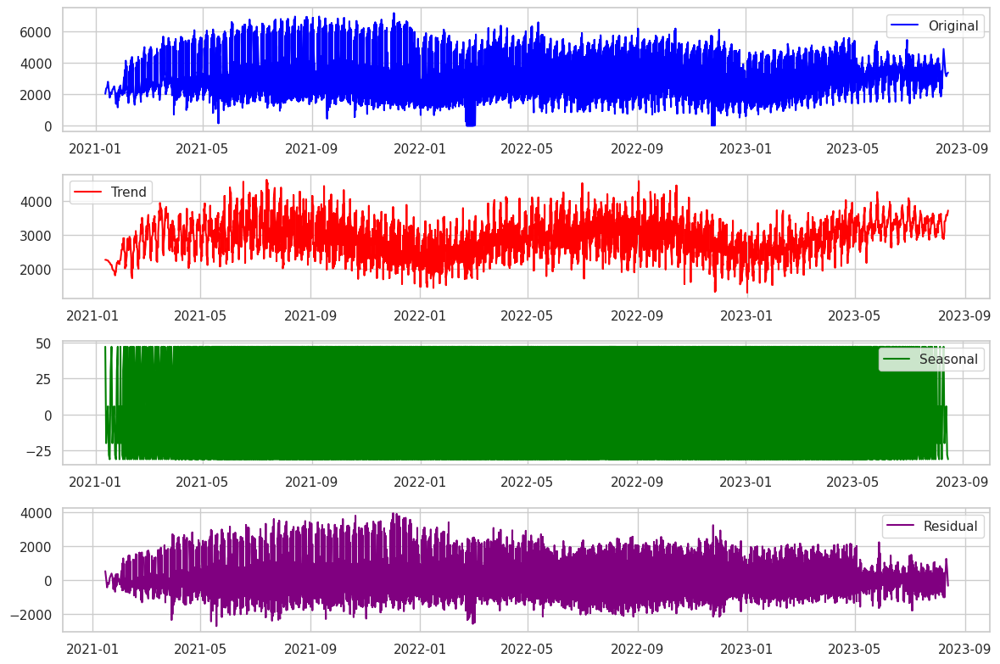

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose

date_column_name = 'calendar.calendar_day_date'
sales_column_name = 'daily_yoy_ndt.total_inside_sales'

# Creating a time series with the date column as the index
ts = bonfire.set_index(date_column_name)

# Sorting the data by date
ts = ts.sort_index()

# Converting the 'daily_yoy_ndt.total_inside_sales' column to numeric
ts[sales_column_name] = pd.to_numeric(ts[sales_column_name], errors='coerce')

# Performing seasonal decomposition
decomposition = seasonal_decompose(ts[sales_column_name].dropna(), model='additive', period=7)

# Plotting the original, trend, seasonal, and residual components
plt.figure(figsize=(12, 8))
plt.subplot(411)
plt.plot(ts[sales_column_name], label='Original', color='blue')
plt.legend(loc='best')
plt.subplot(412)
plt.plot(decomposition.trend, label='Trend', color='red')
plt.legend(loc='best')
plt.subplot(413)
plt.plot(decomposition.seasonal, label='Seasonal', color='green')
plt.legend(loc='best')
plt.subplot(414)
plt.plot(decomposition.resid, label='Residual', color='purple')
plt.legend(loc='best')
plt.tight_layout()

plt.show()




The key insights and observations for the **"total_inside_sales"** sales:

**Original Component:** The sales data ranges from 0 to 7000 and looks quite consistent over time. This means that sales don't have a clear up or down trend.

**Trend Component:** The "Trend" plot shows a pattern where sales go up in the summer and down in the winter. This suggests that sales follow a seasonal pattern, increasing at certain times of the year and decreasing at others. The range of this pattern is between 0 and 5000.

**Seasonal Component:** The "Seasonal" plot has a clear repeating pattern that goes from -20 to 40. This pattern shows that there are regular, recurring changes in sales throughout the year. Positive values mean sales are higher than usual, and negative values mean sales are lower than usual during those periods.

**Residual Component:** The "Residual" plot ranges from -2000 to 4000. It represents the random variations in sales that don't follow the trend or seasonal pattern. A large residual component suggests that there are still unexplained changes in the data.

Overall, the data related to total_inside_sales shows that sales have a clear pattern where they go up in the summer and down in the winter. This pattern is captured by the "Trend" and "Seasonal" components. The "Residual" component shows there are some random changes that we can't explain with this pattern.

###<a name = "TFS"> For total_food_service  </a>

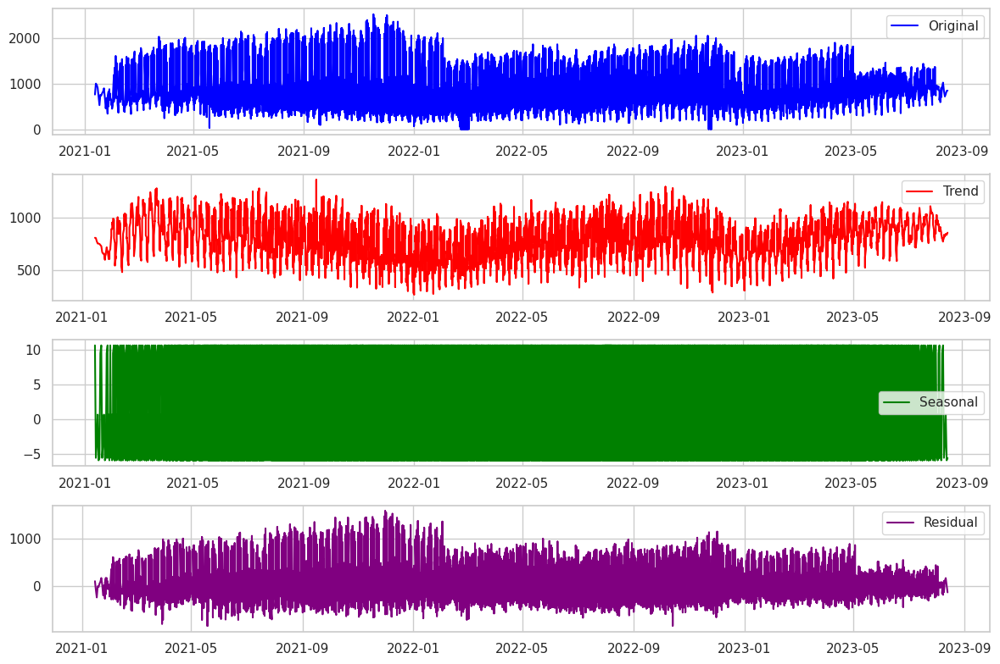

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose

date_column_name = 'calendar.calendar_day_date'
sales_column_name = 'daily_yoy_ndt.total_food_service'

# Creating a time series with the date column as the index
ts = bonfire.set_index(date_column_name)

# Sorting the data by date
ts = ts.sort_index()

# Converting the 'daily_yoy_ndt.total_inside_sales' column to numeric
ts[sales_column_name] = pd.to_numeric(ts[sales_column_name], errors='coerce')

# Performing seasonal decomposition
decomposition = seasonal_decompose(ts[sales_column_name].dropna(), model='additive', period=7)

# Plotting the original, trend, seasonal, and residual components
plt.figure(figsize=(12, 8))
plt.subplot(411)
plt.plot(ts[sales_column_name], label='Original', color='blue')
plt.legend(loc='best')
plt.subplot(412)
plt.plot(decomposition.trend, label='Trend', color='red')
plt.legend(loc='best')
plt.subplot(413)
plt.plot(decomposition.seasonal, label='Seasonal', color='green')
plt.legend(loc='best')
plt.subplot(414)
plt.plot(decomposition.resid, label='Residual', color='purple')
plt.legend(loc='best')
plt.tight_layout()

plt.show()




The key insights and observations for the **"food_service"** sales:

**Original Component:** The initial time series data showed that daily food service values ranged from 0 to 2000 and looked fairly even, with no obvious strong pattern or repeated trends.

**Trend:** The trend part of the data had ups and downs between about 250 and 1250, showing that there were cycles or patterns. These patterns suggested that the sales went up (summer) and down (winter), indicating that there were certain times of the year when business was better or worse.

**Seasonal:** The seasonal part of the data covered the entire graph and went up and down between -5 and 10. This means that there was a regular pattern that repeated every day throughout the year.

**Residual:** The residual part of the data ranged from around -200 to 1000, which represented differences from the trends and seasonal patterns. This part had unexpected variations or random changes in the data that couldn't be explained by the regular patterns.

Overall, when we looked at the data closely, we found that there was a clear pattern that repeated every day and also some ups and downs that happened during the year.





###<a name = "TFS"> For diesel  </a>

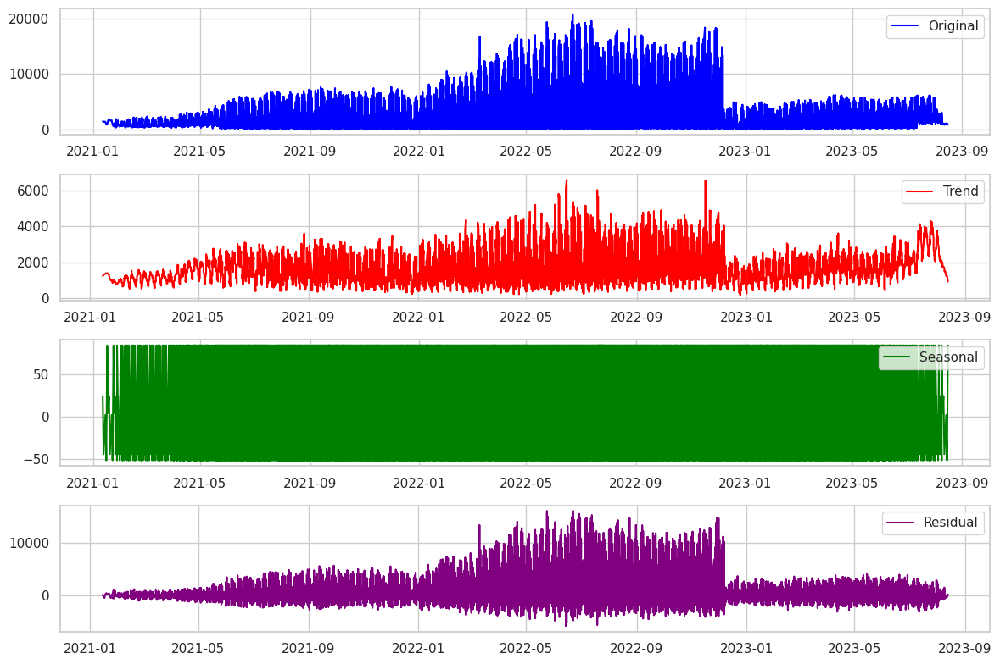

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose

date_column_name = 'calendar.calendar_day_date'
sales_column_name = 'diesel_x'

# Creating a time series with the date column as the index
ts = bonfire.set_index(date_column_name)

# Sorting the data by date
ts = ts.sort_index()

# Converting the 'daily_yoy_ndt.total_inside_sales' column to numeric
ts[sales_column_name] = pd.to_numeric(ts[sales_column_name], errors='coerce')

# Performing seasonal decomposition
decomposition = seasonal_decompose(ts[sales_column_name].dropna(), model='additive', period=7)

# Plotting the original, trend, seasonal, and residual components
plt.figure(figsize=(12, 8))
plt.subplot(411)
plt.plot(ts[sales_column_name], label='Original', color='blue')
plt.legend(loc='best')
plt.subplot(412)
plt.plot(decomposition.trend, label='Trend', color='red')
plt.legend(loc='best')
plt.subplot(413)
plt.plot(decomposition.seasonal, label='Seasonal', color='green')
plt.legend(loc='best')
plt.subplot(414)
plt.plot(decomposition.resid, label='Residual', color='purple')
plt.legend(loc='best')
plt.tight_layout()

plt.show()

The key insights and observations for the **"diesel"** sales:

**Original Component:** The original time series exhibits fluctuations and spikes, with values ranging from 0 to 20,000. The stretch of spikes in the center suggests that the graph has been impacted by site 21980 (high diesel sales) during this period.

**Trend component:** It ranges from 0 to 6,000, represents the long-term underlying pattern in the data. It also appears to be impacted by site 21980.

**Seasonal Component:** The seasonal component occupies the entire range from -50 to 50. This suggests that the seasonal component is relatively small in magnitude compared to the other components. The fact that it oscillates around zero means it doesn't significantly contribute to the overall values.

**Residual Component:** The residual component varies from -5,000 to 15,000, and it closely resembles the original and trend components. This indicates that the residual component contains a significant amount of variation and noise not captured by the trend or seasonal components.

In summary, the time series decomposition of diesel witnessed fluctations due to presence of site 21980. The model will be built by paying attention to this.

###<a name = "TFS"> For unleaded  </a>

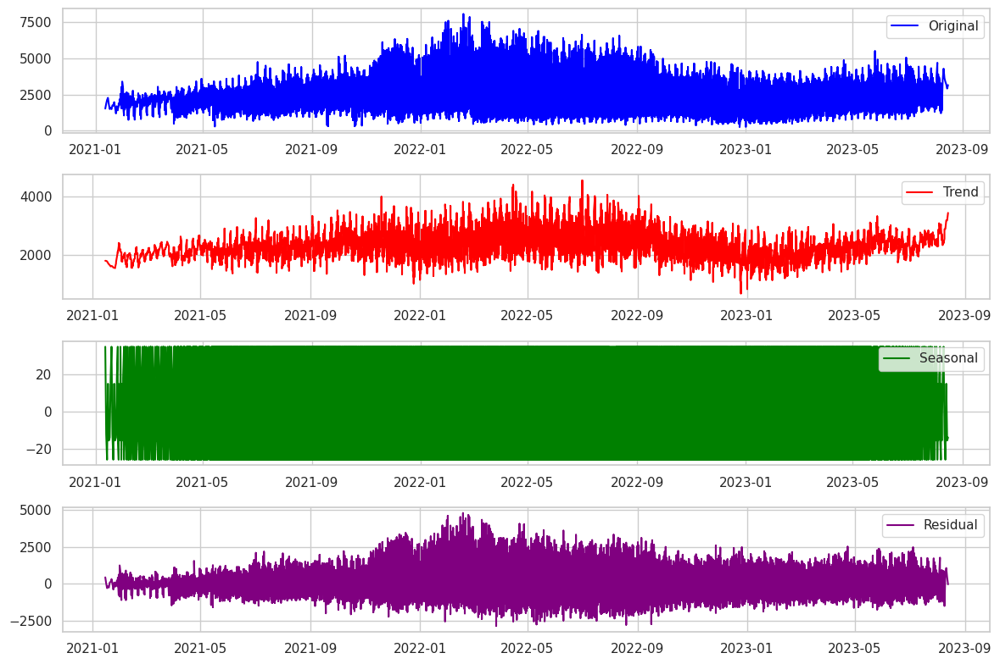

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose

date_column_name = 'calendar.calendar_day_date'
sales_column_name = 'unleaded'

# Creating a time series with the date column as the index
ts = bonfire.set_index(date_column_name)

# Sorting the data by date
ts = ts.sort_index()

# Converting the 'daily_yoy_ndt.total_inside_sales' column to numeric
ts[sales_column_name] = pd.to_numeric(ts[sales_column_name], errors='coerce')

# Performing seasonal decomposition
decomposition = seasonal_decompose(ts[sales_column_name].dropna(), model='additive', period=7)

# Plotting the original, trend, seasonal, and residual components
plt.figure(figsize=(12, 8))
plt.subplot(411)
plt.plot(ts[sales_column_name], label='Original', color='blue')
plt.legend(loc='best')
plt.subplot(412)
plt.plot(decomposition.trend, label='Trend', color='red')
plt.legend(loc='best')
plt.subplot(413)
plt.plot(decomposition.seasonal, label='Seasonal', color='green')
plt.legend(loc='best')
plt.subplot(414)
plt.plot(decomposition.resid, label='Residual', color='purple')
plt.legend(loc='best')
plt.tight_layout()

plt.show()


The key insights and observations for the **"unleaded"** sales:

**Original Component:** The initial data, which represents sales, doesn't show any big ups or downs. Sales vary between 0 and 8000, but there's no clear trend.

**Trend Component:** There is a regular pattern in sales that goes from about 1000 to 4000. It means that sales tend to follow a similar path, with higher sales in summer and lower sales in winter.

**Seasonal Component:** This part represents the daily ups and downs in sales. It's a small range of changes, and it repeats regularly, regardless of the time of year.

**Residual Component:** This part shows unusual and unexplained changes in sales, ranging from -2000 to 4000. It means that the model used might not catch all the changes in the data, and there are still some unexplained patterns.

In summary, the breakdown of the data tells us that there's a daily sales pattern, a consistent trend with higher sales in summer and lower in winter, and some unknown variations in the data.

##<a name = "SC"> Stationarity Check</a>

###<a name = "TIS"> For total_inside_sales </a>

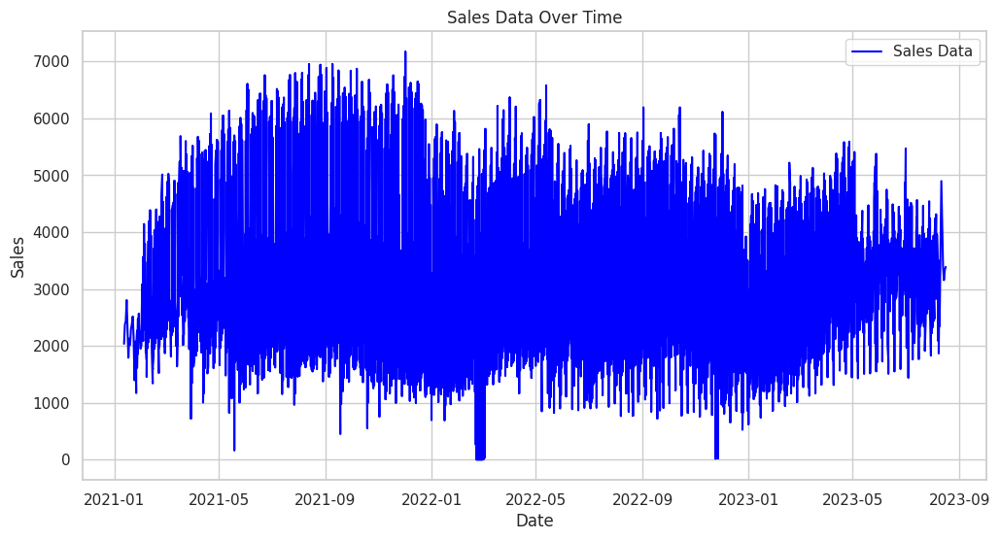

ADF Statistic: -14.918597243664921
p-value: 1.4227740968540615e-27
Critical Values:
1%: -3.4308210146374325
5%: -2.861748166867282
10%: -2.566880802411787
The data is stationary (reject the null hypothesis)


In [ ]:
from statsmodels.tsa.stattools import adfuller

date_column_name = 'calendar.calendar_day_date'
sales_column_name = 'daily_yoy_ndt.total_inside_sales'

# Creating a time series with the date column as the index
ts = bonfire.set_index(date_column_name)
ts = ts.sort_index()

# Converting the 'daily_yoy_ndt.total_inside_sales' column to numeric
ts[sales_column_name] = pd.to_numeric(ts[sales_column_name], errors='coerce')

# Visual inspection of stationarity
plt.figure(figsize=(12, 6))
plt.plot(ts[sales_column_name], label='Sales Data', color='blue')
plt.xlabel('Date')
plt.ylabel('Sales')
plt.title('Sales Data Over Time')
plt.legend()
plt.show()

# Augmented Dickey-Fuller test
result = adfuller(ts[sales_column_name].dropna(), autolag='AIC')
print('ADF Statistic:', result[0])
print('p-value:', result[1])
print('Critical Values:')
for key, value in result[4].items():
    print(f'{key}: {value}')

if result[1] <= 0.05:
    print('The data is stationary (reject the null hypothesis)')
else:
    print('The data is not stationary (fail to reject the null hypothesis)')


###<a name = "TFS"> For total_food_service  </a>

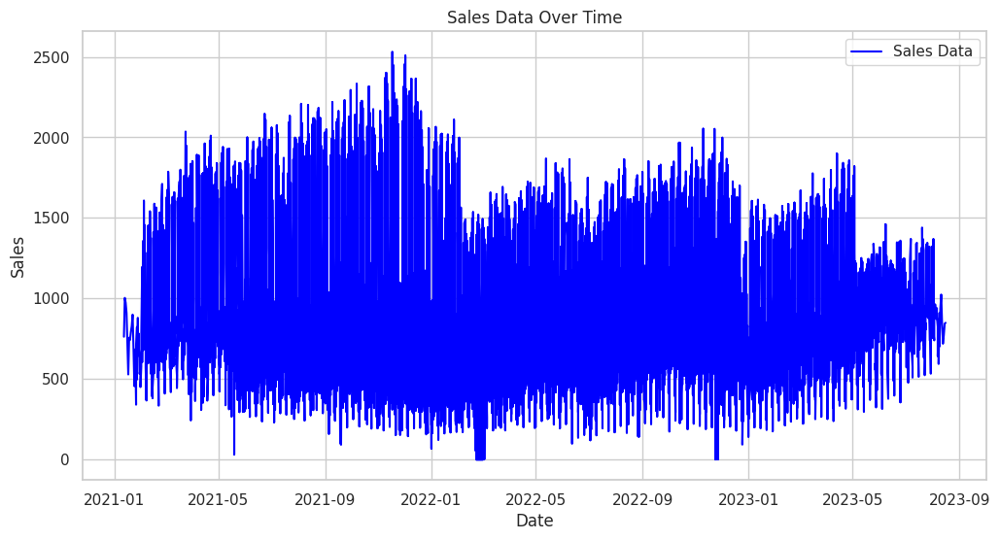

ADF Statistic: -17.830456796712788
p-value: 3.1348596360629314e-30
Critical Values:
1%: -3.4308208111670693
5%: -2.861748076949842
10%: -2.566880754549576
The data is stationary (reject the null hypothesis)


In [ ]:
from statsmodels.tsa.stattools import adfuller

date_column_name = 'calendar.calendar_day_date'
sales_column_name = 'daily_yoy_ndt.total_food_service'

# Creating a time series with the date column as the index
ts = bonfire.set_index(date_column_name)
ts = ts.sort_index()

# Converting the 'daily_yoy_ndt.total_inside_sales' column to numeric
ts[sales_column_name] = pd.to_numeric(ts[sales_column_name], errors='coerce')

# Visual inspection of stationarity
plt.figure(figsize=(12, 6))
plt.plot(ts[sales_column_name], label='Sales Data', color='blue')
plt.xlabel('Date')
plt.ylabel('Sales')
plt.title('Sales Data Over Time')
plt.legend()
plt.show()

# Augmented Dickey-Fuller test
result = adfuller(ts[sales_column_name].dropna(), autolag='AIC')
print('ADF Statistic:', result[0])
print('p-value:', result[1])
print('Critical Values:')
for key, value in result[4].items():
    print(f'{key}: {value}')

if result[1] <= 0.05:
    print('The data is stationary (reject the null hypothesis)')
else:
    print('The data is not stationary (fail to reject the null hypothesis)')


###<a name = "TFS"> For diesel  </a>

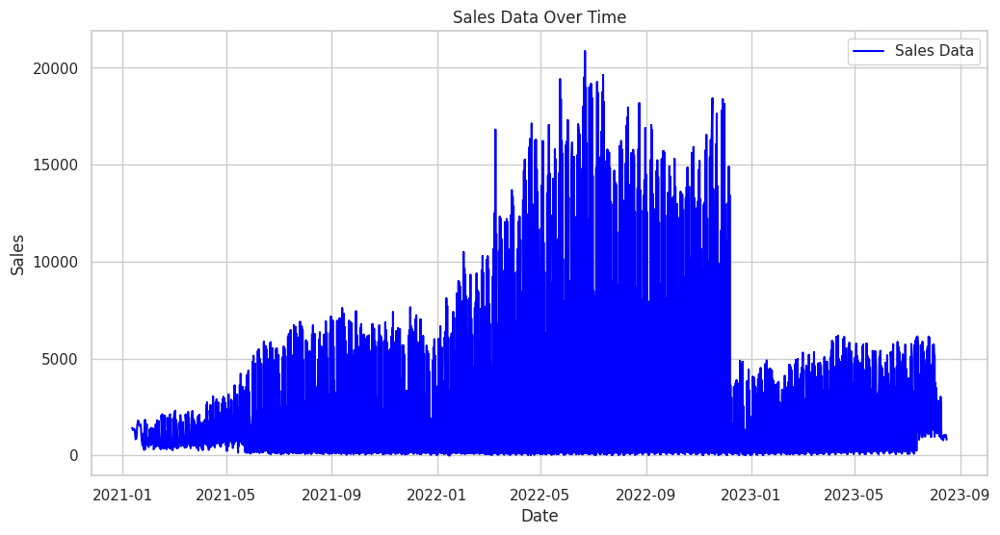

ADF Statistic: -15.293587878068147
p-value: 4.4091566823718255e-28
Critical Values:
1%: -3.430821354145803
5%: -2.861748316902502
10%: -2.5668808822741322
The data is stationary (reject the null hypothesis)


In [ ]:
from statsmodels.tsa.stattools import adfuller

date_column_name = 'calendar.calendar_day_date'
sales_column_name = 'diesel_x'

# Creating a time series with the date column as the index
ts = bonfire.set_index(date_column_name)
ts = ts.sort_index()

# Converting the 'daily_yoy_ndt.total_inside_sales' column to numeric
ts[sales_column_name] = pd.to_numeric(ts[sales_column_name], errors='coerce')

# Visual inspection of stationarity
plt.figure(figsize=(12, 6))
plt.plot(ts[sales_column_name], label='Sales Data', color='blue')
plt.xlabel('Date')
plt.ylabel('Sales')
plt.title('Sales Data Over Time')
plt.legend()
plt.show()

# Augmented Dickey-Fuller test
result = adfuller(ts[sales_column_name].dropna(), autolag='AIC')
print('ADF Statistic:', result[0])
print('p-value:', result[1])
print('Critical Values:')
for key, value in result[4].items():
    print(f'{key}: {value}')

if result[1] <= 0.05:
    print('The data is stationary (reject the null hypothesis)')
else:
    print('The data is not stationary (fail to reject the null hypothesis)')


###<a name = "TFS"> For unleaded  </a>

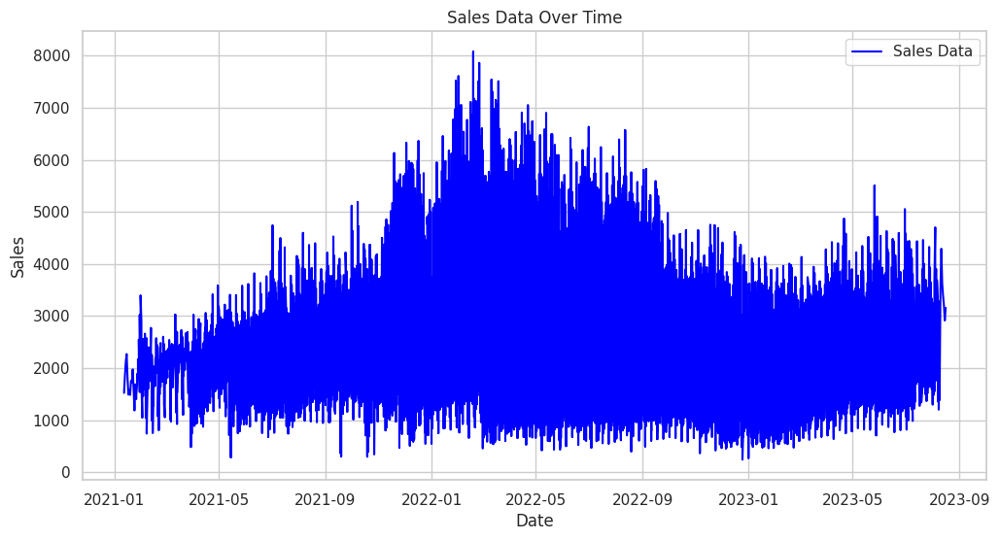

ADF Statistic: -12.9889973545252
p-value: 2.8384818471836317e-24
Critical Values:
1%: -3.4308214560937746
5%: -2.8617483619552506
10%: -2.5668809062552898
The data is stationary (reject the null hypothesis)


In [ ]:
from statsmodels.tsa.stattools import adfuller

date_column_name = 'calendar.calendar_day_date'
sales_column_name = 'unleaded'

# Creating a time series with the date column as the index
ts = bonfire.set_index(date_column_name)
ts = ts.sort_index()

# Converting the 'daily_yoy_ndt.total_inside_sales' column to numeric
ts[sales_column_name] = pd.to_numeric(ts[sales_column_name], errors='coerce')

# Visual inspection of stationarity
plt.figure(figsize=(12, 6))
plt.plot(ts[sales_column_name], label='Sales Data', color='blue')
plt.xlabel('Date')
plt.ylabel('Sales')
plt.title('Sales Data Over Time')
plt.legend()
plt.show()

# Augmented Dickey-Fuller test
result = adfuller(ts[sales_column_name].dropna(), autolag='AIC')
print('ADF Statistic:', result[0])
print('p-value:', result[1])
print('Critical Values:')
for key, value in result[4].items():
    print(f'{key}: {value}')

if result[1] <= 0.05:
    print('The data is stationary (reject the null hypothesis)')
else:
    print('The data is not stationary (fail to reject the null hypothesis)')


It can be clearly observed that all target variables are stationary and we can reject the null hypothesis. By, interpreting p-value, ADF statistic values, the stationarity can be confirmed. The stationarity check is crucial for models like ARIMA and SARIMA.

##<a name = "DC"> Data Clustering</a>

###<a name = "CSP"> Clustering based on Store Parameters</a>

In [ ]:
store_features_cleaned.head()

,open_year,square_feet,front_door_count,years_since_last_project,parking_spaces,lottery,freal,bonfire_grill,pizza,cinnabon,...,rv_lanes_fueling_positions_2,hi_flow_rv_lanes_layout,hi_flow_rv_lanes_stack_type,non_24_hour,self_check_out,mens_toilet_count,mens_urinal_count,womens_toilet_count,womens_sink_count,site_id_msba
0,2021,5046,2,2,38,Yes,Yes,Yes,No,No,...,6,Stack,HF/RV,No,Yes,2,2,6,2,21560
1,2021,5046,2,2,39,No,Yes,Yes,Yes,No,...,4,Combo,HF/RV,No,Yes,5,5,10,4,21980
2,2021,5046,2,2,35,Yes,Yes,Yes,Yes,No,...,5,In-Line,NaN,No,Yes,3,2,4,1,22015
3,2021,5046,2,2,36,No,Yes,Yes,Yes,No,...,4,Combo,HF/RV,No,Yes,3,3,6,2,22085
4,2021,5046,2,2,25,Yes,Yes,Yes,No,No,...,0,NaN,NaN,No,Yes,0,0,0,0,22120


In [ ]:

categorical_columns = store_features_cleaned.select_dtypes(include=['object']).columns

# Initialize the LabelEncoder
label_encoder = LabelEncoder()

store_features_en= copy.deepcopy(store_features_cleaned)

# Encode each categorical column
for col in categorical_columns:
    store_features_en[col] = label_encoder.fit_transform(store_features_en[col])


The code is using scikit-learn's `LabelEncoder` to transform categorical columns in the `store_features_cleaned` DataFrame into numerical labels. It loops through the categorical columns, fits the encoder to each column's unique values, and replaces the original categorical data in a deep copy of the DataFrame called `store_features_en` with the corresponding numerical labels, making the data suitable for machine learning algorithms that require numerical input

In [ ]:
columns_to_standardize = [
    'square_feet', 'front_door_count', 'years_since_last_project', 'parking_spaces', 'lottery', 'freal',
     'bonfire_grill', 'pizza', 'cinnabon', 'godfather_s_pizza', 'ethanol_free', 'diesel', 'hi_flow_lanes',
     'rv_lanes', 'hi_flow_rv_lanes', 'def', 'cat_scales', 'car_wash', 'ev_charging', 'rv_dumps', 'propane',
     'x1_mile_pop', 'x1_mile_emp', 'x1_mile_income', 'x1_2_mile_pop', 'x1_2_mile_emp', 'x1_2_mile_income', 'x5_min_pop',
     'x5_min_emp', 'x5_min_inc', 'x7_min_pop', 'x7_min_emp', 'x7_min_inc', 'traditional_forecourt_fueling_positions',
     'traditional_forecourt_layout', 'traditional_forecourt_stack_type', 'rv_lanes_fueling_positions', 'rv_lanes_layout',
     'rv_lanes_stack_type', 'hi_flow_lanes_fueling_positions', 'hi_flow_lanes_layout', 'hi_flow_lanes_stack_type',
     'hi_flow_lanes_fueling_positions_2', 'rv_lanes_fueling_positions_2', 'hi_flow_rv_lanes_layout', 'hi_flow_rv_lanes_stack_type',
     'non_24_hour', 'self_check_out', 'mens_toilet_count', 'mens_urinal_count', 'womens_toilet_count', 'womens_sink_count']

# Creating a DataFrame with only the columns to standardize
store_features_subset = store_features_en[columns_to_standardize]

# Standardizing the selected columns
scaler = StandardScaler()
store_features_standardized_subset = scaler.fit_transform(store_features_subset)

# Creating a DataFrame with the standardized data and keep the 'site_id_msba' and 'open_year' columns
store_features_standardized = store_features_en.copy()
store_features_standardized[columns_to_standardize] = store_features_standardized_subset


The code is using scikit-learn's `StandardScaler` to standardize a subset of numerical columns in the `store_features_en` DataFrame, which involves transforming the selected columns to have a mean of 0 and a standard deviation of 1. The columns to standardize are specified in `columns_to_standardize`, and a new DataFrame `store_features_standardized_df` is created, which retains the original 'site_id_msba' and 'open_year' columns while replacing the selected columns with their standardized versions. This process ensures that the data is on the same scale and is ready for use with machine learning algorithms that may be sensitive to the scale of the input features.

In [ ]:
# Specification of the number of clusters (4 in your case)
num_clusters = 4

# Selecting the columns to be used for clustering
features_to_cluster = store_features_standardized[
    ['square_feet', 'front_door_count', 'years_since_last_project', 'parking_spaces', 'lottery', 'freal',
     'bonfire_grill', 'pizza', 'cinnabon', 'godfather_s_pizza', 'ethanol_free', 'diesel', 'hi_flow_lanes',
     'rv_lanes', 'hi_flow_rv_lanes', 'def', 'cat_scales', 'car_wash', 'ev_charging', 'rv_dumps', 'propane',
     'x1_mile_pop', 'x1_mile_emp', 'x1_mile_income', 'x1_2_mile_pop', 'x1_2_mile_emp', 'x1_2_mile_income', 'x5_min_pop',
     'x5_min_emp', 'x5_min_inc', 'x7_min_pop', 'x7_min_emp', 'x7_min_inc', 'traditional_forecourt_fueling_positions',
     'traditional_forecourt_layout', 'traditional_forecourt_stack_type', 'rv_lanes_fueling_positions', 'rv_lanes_layout',
     'rv_lanes_stack_type', 'hi_flow_lanes_fueling_positions', 'hi_flow_lanes_layout', 'hi_flow_lanes_stack_type',
     'hi_flow_lanes_fueling_positions_2', 'rv_lanes_fueling_positions_2', 'hi_flow_rv_lanes_layout', 'hi_flow_rv_lanes_stack_type',
     'non_24_hour', 'self_check_out', 'mens_toilet_count', 'mens_urinal_count', 'womens_toilet_count', 'womens_sink_count']
]

# Creating a K-Means model with the desired number of clusters
kmeans_stores = KMeans(n_clusters=num_clusters, random_state=0)

# Fitting the K-Means model to your data, excluding 'site_id_msba'
kmeans_stores.fit(features_to_cluster)

# Assigning cluster labels to each data point
store_features_standardized['cluster'] = kmeans_stores.labels_



The code is using the K-Means clustering algorithm from scikit-learn to cluster data from a specified subset of columns in the `store_features_standardized` DataFrame into a predefined number of clusters (4 in this case). It creates a K-Means model with four clusters, fits the model to the selected features, assigns cluster labels to each data point, and stores these labels in a new 'cluster' column in the DataFrame. This allows for grouping the data points into clusters based on their similarity in the chosen features, aiding in the analysis and segmentation of the dataset.

In [ ]:
# Creating an empty dictionary to store the associations
cluster_to_unique_sites = {}

# Iterating through the dataset
for index, row in store_features_standardized.iterrows():
    cluster_number = row['cluster']
    site_id_msba = row['site_id_msba']

    # Checking if the cluster number is already in the dictionary
    if cluster_number in cluster_to_unique_sites:
        cluster_to_unique_sites[cluster_number].add(site_id_msba)
    else:
        cluster_to_unique_sites[cluster_number] = {site_id_msba}

# Printing the unique site_id_msba values for each cluster
for cluster, unique_sites in cluster_to_unique_sites.items():
    print(f"Cluster {cluster}: Unique Site IDs - {', '.join(map(str, unique_sites))}")


Cluster 1.0: Unique Site IDs - 22785.0, 22540.0, 23835.0, 22820.0, 22575.0, 23345.0, 23730.0, 21560.0, 22330.0, 24255.0, 22085.0, 23240.0, 23380.0, 23765.0, 24535.0, 22750.0, 23660.0, 23415.0, 22015.0
Cluster 2.0: Unique Site IDs - 22400.0, 22890.0, 21980.0
Cluster 0.0: Unique Site IDs - 23905.0, 23555.0, 22855.0, 22120.0, 22505.0, 22925.0, 22260.0, 22645.0, 24150.0, 22680.0, 23450.0, 24220.0, 23485.0, 23135.0
Cluster 3.0: Unique Site IDs - 22715.0


The provided output presents the clusters along with their respective site IDs. Notably, Site ID 22715 stands out in a separate cluster. This separation is primarily attributed to the dissimilarity in store attributes when compared to the other sites in the dataset. This unique clustering underscores the distinct characteristics or features of Site ID 22715, setting it apart from the rest of the data points, which exhibit more similarities in terms of their store attributes

###<a name = "DC"> Merged Dataset with Cluster Number</a>

In [ ]:
#Merge dataset
timeseries_cleaned= copy.deepcopy(timeseries)
timeseries_cleaned.reset_index(inplace=True)
bonfire_cluster_total = timeseries_cleaned.merge(store_features_standardized, on='site_id_msba', how='inner')

#Top 5 rows of data overview
bonfire_cluster_total.head()

,index,calendar.calendar_day_date,capital_projects.soft_opening_date,calendar.fiscal_week_id_for_year,calendar.day_of_week,calendar_information.holiday,calendar_information.type_of_day,daily_yoy_ndt.total_inside_sales,daily_yoy_ndt.total_food_service,diesel_x,...,rv_lanes_fueling_positions_2,hi_flow_rv_lanes_layout,hi_flow_rv_lanes_stack_type,non_24_hour,self_check_out,mens_toilet_count,mens_urinal_count,womens_toilet_count,womens_sink_count,cluster
0,0,2021-01-12,2021-01-12,2,Tuesday,NONE,WEEKDAY,2036.2685,762.8530,1424.1850,...,1.724451,0.545908,-0.825723,0.0,0.0,-0.415374,-0.415694,0.782205,0.407128,1
1,1,2021-01-13,2021-01-12,2,Wednesday,NONE,WEEKDAY,2379.8880,1003.7930,1303.8445,...,1.724451,0.545908,-0.825723,0.0,0.0,-0.415374,-0.415694,0.782205,0.407128,1
2,2,2021-01-14,2021-01-12,2,Thursday,NONE,WEEKDAY,2435.8600,974.2250,1375.6785,...,1.724451,0.545908,-0.825723,0.0,0.0,-0.415374,-0.415694,0.782205,0.407128,1
3,3,2021-01-15,2021-01-12,3,Friday,NONE,WEEKDAY,2805.9780,911.0115,1334.9175,...,1.724451,0.545908,-0.825723,0.0,0.0,-0.415374,-0.415694,0.782205,0.407128,1
4,4,2021-01-16,2021-01-12,3,Saturday,NONE,WEEKEND,2314.7635,715.7535,831.1625,...,1.724451,0.545908,-0.825723,0.0,0.0,-0.415374,-0.415694,0.782205,0.407128,1


In [ ]:
categorical_columns = bonfire_cluster_total.select_dtypes(include=['object']).columns
# Initializing the LabelEncoder

label_encoder = LabelEncoder()
# Encode each categorical column
for col in categorical_columns:
    bonfire_cluster_total[col] = label_encoder.fit_transform(bonfire_cluster_total[col])

In [ ]:
bonfire_cluster_total.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13542 entries, 0 to 13541
Data columns (total 71 columns):
 #   Column                                   Non-Null Count  Dtype         
---  ------                                   --------------  -----         
 0   index                                    13542 non-null  int64         
 1   calendar.calendar_day_date               13542 non-null  datetime64[ns]
 2   capital_projects.soft_opening_date       13542 non-null  datetime64[ns]
 3   calendar.fiscal_week_id_for_year         13542 non-null  int64         
 4   calendar.day_of_week                     13542 non-null  int64         
 5   calendar_information.holiday             13542 non-null  int64         
 6   calendar_information.type_of_day         13542 non-null  int64         
 7   daily_yoy_ndt.total_inside_sales         13542 non-null  float64       
 8   daily_yoy_ndt.total_food_service         13542 non-null  float64       
 9   diesel_x                               

###<a name = "DC">Bonfire Dataset Clusters</a>

In [ ]:
bonfire_cluster1 = bonfire_cluster_total[bonfire_cluster_total['cluster'] == 0]
bonfire_cluster2 = bonfire_cluster_total[bonfire_cluster_total['cluster'] == 1]
bonfire_cluster3 = bonfire_cluster_total[bonfire_cluster_total['cluster'] == 2]
bonfire_cluster4 = bonfire_cluster_total[bonfire_cluster_total['cluster'] == 3]

The code above provides a comprehensive view of the total datasets, organized based on their respective clusters. This arrangement is essential for conducting further in-depth analysis of the data

####<a name = "BC1">Bonfire_cluster1</a>

In [ ]:
selected_columns = ['calendar.calendar_day_date',
                    'daily_yoy_ndt.total_inside_sales', 'daily_yoy_ndt.total_food_service',
                    'diesel_x', 'unleaded']

# Creating a new DataFrame with the selected columns
bonfire_cluster1 = bonfire_cluster1[selected_columns].copy()

# Group by 'calendar.calendar_day_date' and calculate the mean for other columns
# bonfire_cluster1 = bonfire_cluster1.groupby('calendar.calendar_day_date','capital_projects.soft_opening_date').mean().reset_index()
bonfire_cluster1 = bonfire_cluster1.groupby(['calendar.calendar_day_date']).mean().reset_index()

In [ ]:
bonfire_cluster1.head()

,calendar.calendar_day_date,daily_yoy_ndt.total_inside_sales,daily_yoy_ndt.total_food_service,diesel_x,unleaded
0,2021-05-25,1006.6350,295.2460,140.4550,783.5835
1,2021-05-26,1318.9260,373.4605,155.4210,907.5710
2,2021-05-27,1505.2065,400.7885,207.6305,1101.4150
3,2021-05-28,1634.9025,402.5385,162.0255,1246.8155
4,2021-05-29,1365.9555,296.0440,100.7860,1025.4790


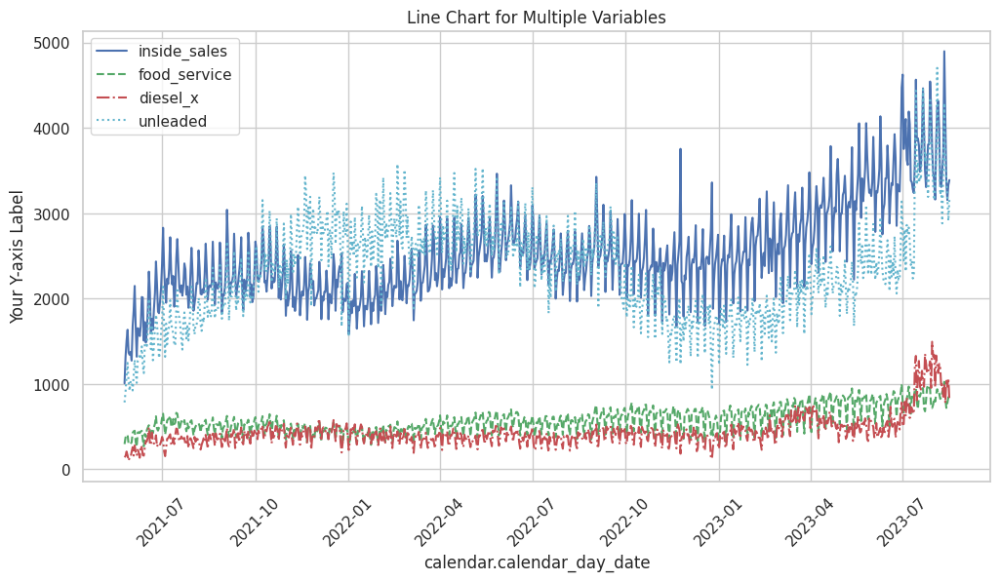

In [ ]:
x = bonfire_cluster1['calendar.calendar_day_date']
y1 = bonfire_cluster1['daily_yoy_ndt.total_inside_sales']
y2 = bonfire_cluster1['daily_yoy_ndt.total_food_service']
y3 = bonfire_cluster1['diesel_x']
y4 = bonfire_cluster1['unleaded']

plt.figure(figsize=(12, 6))
sns.set(style="whitegrid")  # Set Seaborn style

# Plotting the data using Seaborn
sns.lineplot(x=x, y=y1, label='inside_sales',  color='b')
sns.lineplot(x=x, y=y2, label='food_service',  linestyle='--', color='g')
sns.lineplot(x=x, y=y3, label='diesel_x',  linestyle='-.', color='r')
sns.lineplot(x=x, y=y4, label='unleaded',  linestyle=':', color='c')

plt.xlabel('calendar.calendar_day_date')
plt.ylabel('Your Y-axis Label')
plt.title('Line Chart for Multiple Variables')
plt.xticks(rotation=45)  # Rotate X-axis labels for better readability
plt.legend()  # Display the legend to differentiate lines for different variables

plt.show()

The depicted plot above offers an insightful view of the data associated with Cluster 1. The X-axis is dedicated to the representation of dates, serving as a timeline reference. Meanwhile, the Y-axis portrays the average values of the target variables, providing a clear indication of the trends and patterns within this specific cluster over time.

####<a name = "BC1">Bonfire_cluster2</a>

In [ ]:
# Assuming 'bonfire' is your original DataFrame
selected_columns = ['calendar.calendar_day_date',
                    'daily_yoy_ndt.total_inside_sales', 'daily_yoy_ndt.total_food_service',
                    'diesel_x', 'unleaded']

# Create a new DataFrame with the selected columns
bonfire_cluster2 = bonfire_cluster2[selected_columns].copy()

# Group by 'calendar.calendar_day_date' and calculate the mean for other columns
# bonfire_cluster1 = bonfire_cluster1.groupby('calendar.calendar_day_date','capital_projects.soft_opening_date').mean().reset_index()
bonfire_cluster2 = bonfire_cluster2.groupby(['calendar.calendar_day_date']).mean().reset_index()

# The 'averaged_df' DataFrame now contains the desired columns and average values


In [ ]:
bonfire_cluster2.head()

,calendar.calendar_day_date,daily_yoy_ndt.total_inside_sales,daily_yoy_ndt.total_food_service,diesel_x,unleaded
0,2021-01-12,2036.2685,762.8530,1424.1850,1522.0030
1,2021-01-13,2379.8880,1003.7930,1303.8445,1853.7715
2,2021-01-14,2435.8600,974.2250,1375.6785,2122.4070
3,2021-01-15,2805.9780,911.0115,1334.9175,2267.9930
4,2021-01-16,2314.7635,715.7535,831.1625,1819.6395


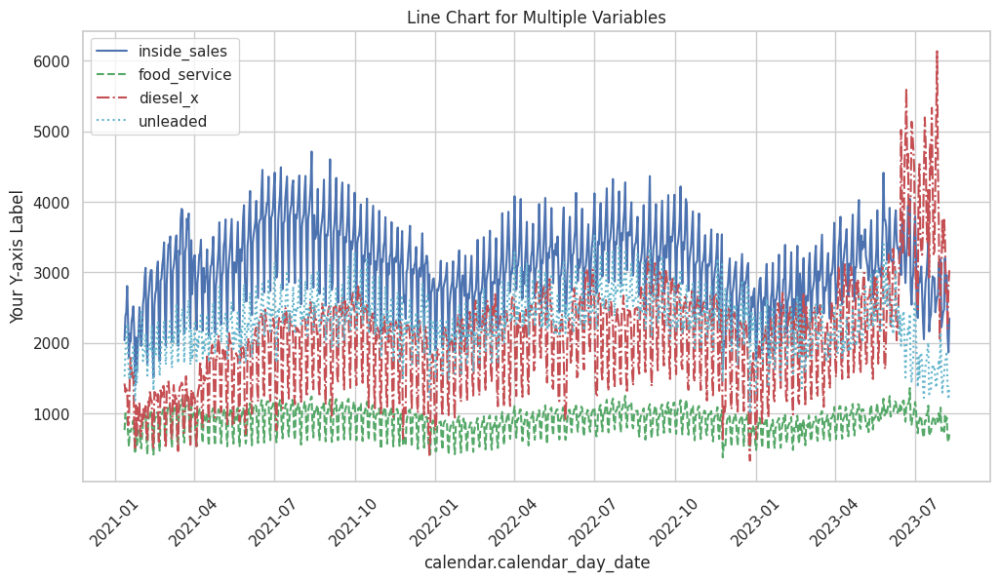

In [ ]:
x = bonfire_cluster2['calendar.calendar_day_date']
y1 = bonfire_cluster2['daily_yoy_ndt.total_inside_sales']
y2 = bonfire_cluster2['daily_yoy_ndt.total_food_service']
y3 = bonfire_cluster2['diesel_x']
y4 = bonfire_cluster2['unleaded']

plt.figure(figsize=(12, 6))
sns.set(style="whitegrid")  # Set Seaborn style

# Plot the data using Seaborn
sns.lineplot(x=x, y=y1, label='inside_sales',  color='b')
sns.lineplot(x=x, y=y2, label='food_service',  linestyle='--', color='g')
sns.lineplot(x=x, y=y3, label='diesel_x',  linestyle='-.', color='r')
sns.lineplot(x=x, y=y4, label='unleaded',  linestyle=':', color='c')

plt.xlabel('calendar.calendar_day_date')
plt.ylabel('Your Y-axis Label')
plt.title('Line Chart for Multiple Variables')
plt.xticks(rotation=45)  # Rotate X-axis labels for better readability
plt.legend()  # Display the legend to differentiate lines for different variables

plt.show()


The depicted plot above offers an insightful view of the data associated with Cluster 2. The X-axis is dedicated to the representation of dates, serving as a timeline reference. Meanwhile, the Y-axis portrays the average values of the target variables, providing a clear indication of the trends and patterns within this specific cluster over time.

####<a name = "BC1">Bonfire_cluster3</a>

In [ ]:
selected_columns = ['calendar.calendar_day_date',
                    'daily_yoy_ndt.total_inside_sales', 'daily_yoy_ndt.total_food_service',
                    'diesel_x', 'unleaded']

# Create a new DataFrame with the selected columns
bonfire_cluster3 = bonfire_cluster3[selected_columns].copy()

# Group by 'calendar.calendar_day_date' and calculate the mean for other columns
# bonfire_cluster1 = bonfire_cluster1.groupby('calendar.calendar_day_date','capital_projects.soft_opening_date').mean().reset_index()
bonfire_cluster3 = bonfire_cluster3.groupby(['calendar.calendar_day_date']).mean().reset_index()

# The 'averaged_df' DataFrame now contains the desired columns and average values


In [ ]:
bonfire_cluster3.head()

,calendar.calendar_day_date,daily_yoy_ndt.total_inside_sales,daily_yoy_ndt.total_food_service,diesel_x,unleaded
0,2021-10-19,555.7405,220.5525,339.9690,297.1430
1,2021-10-20,1002.6940,445.2770,486.4335,394.0650
2,2021-10-21,1482.8555,609.8015,490.7175,688.8490
3,2021-10-22,2032.7020,750.7465,712.3690,1257.4065
4,2021-10-23,1828.3615,511.2170,514.2865,1364.6605


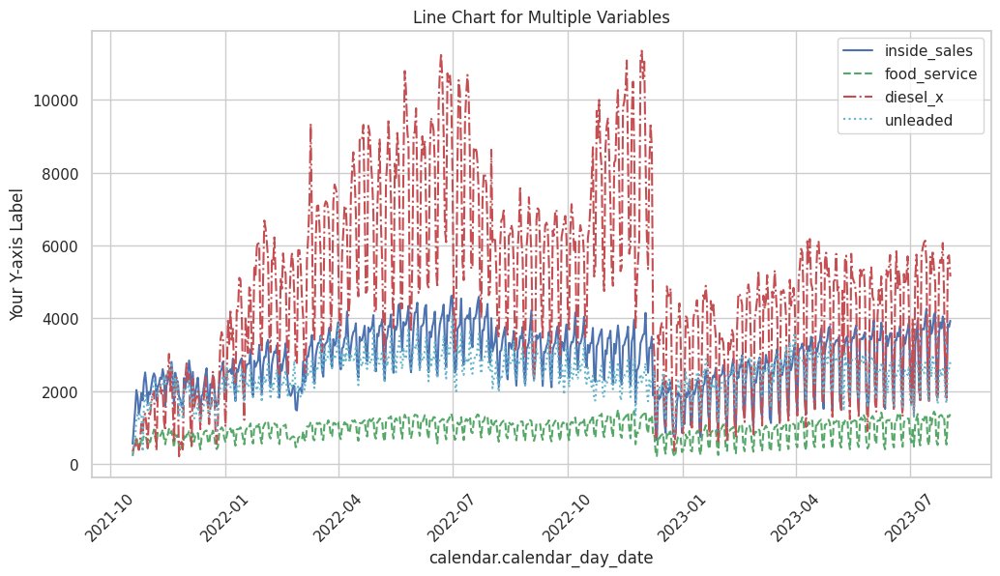

In [ ]:
x = bonfire_cluster3['calendar.calendar_day_date']
y1 = bonfire_cluster3['daily_yoy_ndt.total_inside_sales']
y2 = bonfire_cluster3['daily_yoy_ndt.total_food_service']
y3 = bonfire_cluster3['diesel_x']
y4 = bonfire_cluster3['unleaded']

plt.figure(figsize=(12, 6))
sns.set(style="whitegrid")  # Set Seaborn style

# Plot the data using Seaborn
sns.lineplot(x=x, y=y1, label='inside_sales',  color='b')
sns.lineplot(x=x, y=y2, label='food_service',  linestyle='--', color='g')
sns.lineplot(x=x, y=y3, label='diesel_x',  linestyle='-.', color='r')
sns.lineplot(x=x, y=y4, label='unleaded',  linestyle=':', color='c')

plt.xlabel('calendar.calendar_day_date')
plt.ylabel('Your Y-axis Label')
plt.title('Line Chart for Multiple Variables')
plt.xticks(rotation=45)  # Rotate X-axis labels for better readability
plt.legend()  # Display the legend to differentiate lines for different variables

plt.show()

The depicted plot above offers an insightful view of the data associated with Cluster 3. The X-axis is dedicated to the representation of dates, serving as a timeline reference. Meanwhile, the Y-axis portrays the average values of the target variables, providing a clear indication of the trends and patterns within this specific cluster over time.

####<a name = "BC1">Bonfire_cluster4</a>

In [ ]:
selected_columns = ['calendar.calendar_day_date',
                    'daily_yoy_ndt.total_inside_sales', 'daily_yoy_ndt.total_food_service',
                    'diesel_x', 'unleaded']

# Create a new DataFrame with the selected columns
bonfire_cluster4 = bonfire_cluster4[selected_columns].copy()

# Group by 'calendar.calendar_day_date' and calculate the mean for other columns
# bonfire_cluster1 = bonfire_cluster1.groupby('calendar.calendar_day_date','capital_projects.soft_opening_date').mean().reset_index()
bonfire_cluster4 = bonfire_cluster4.groupby(['calendar.calendar_day_date']).mean().reset_index()

# The 'averaged_df' DataFrame now contains the desired columns and average values

In [ ]:
bonfire_cluster4.head()

,calendar.calendar_day_date,daily_yoy_ndt.total_inside_sales,daily_yoy_ndt.total_food_service,diesel_x,unleaded
0,2021-05-13,825.9055,313.2535,1135.6485,713.4995
1,2021-05-14,1485.5015,491.0710,2745.6380,1141.8085
2,2021-05-15,1342.5615,380.8945,988.6765,278.5370
3,2021-05-16,1078.8225,267.7745,860.1495,1142.2460
4,2021-05-17,1607.7810,552.0340,3630.6235,1704.3145


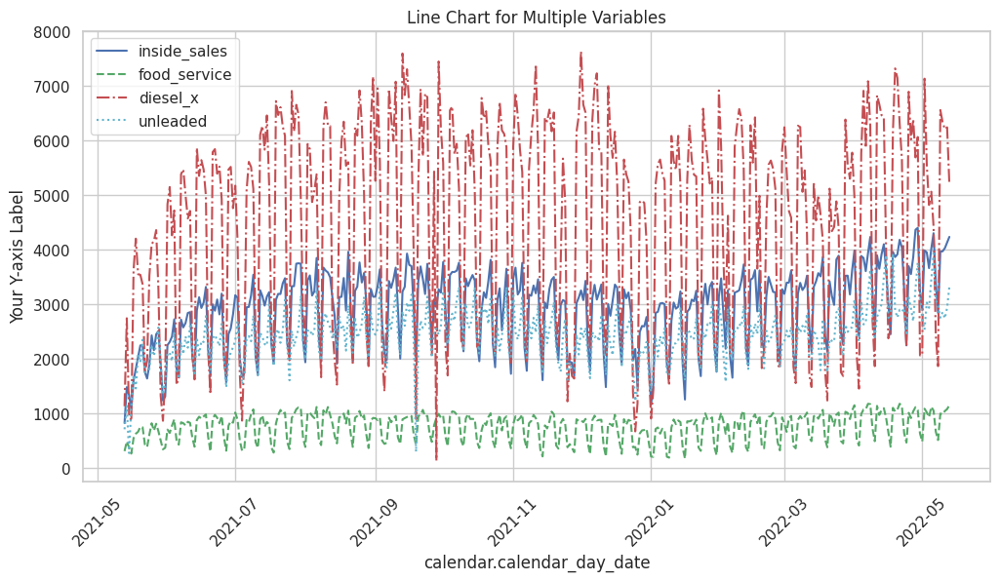

In [ ]:
x = bonfire_cluster4['calendar.calendar_day_date']
y1 = bonfire_cluster4['daily_yoy_ndt.total_inside_sales']
y2 = bonfire_cluster4['daily_yoy_ndt.total_food_service']
y3 = bonfire_cluster4['diesel_x']
y4 = bonfire_cluster4['unleaded']

plt.figure(figsize=(12, 6))
sns.set(style="whitegrid")  # Set Seaborn style

# Plot the data using Seaborn
sns.lineplot(x=x, y=y1, label='inside_sales',  color='b')
sns.lineplot(x=x, y=y2, label='food_service',  linestyle='--', color='g')
sns.lineplot(x=x, y=y3, label='diesel_x',  linestyle='-.', color='r')
sns.lineplot(x=x, y=y4, label='unleaded',  linestyle=':', color='c')


plt.xlabel('calendar.calendar_day_date')
plt.ylabel('Your Y-axis Label')
plt.title('Line Chart for Multiple Variables')
plt.xticks(rotation=45)  # Rotate X-axis labels for better readability
plt.legend()  # Display the legend to differentiate lines for different variables

plt.show()

The depicted plot above offers an insightful view of the data associated with Cluster 4. The X-axis is dedicated to the representation of dates, serving as a timeline reference. Meanwhile, the Y-axis portrays the average values of the target variables, providing a clear indication of the trends and patterns within this specific cluster over time.

#<a name = "MD">Modelling Development</a>

##<a name = "PM">Prophet Model</a>

###<a name = "C1">Cluster-1</a>

####<a name = "PM">Data Split</a>

In [ ]:
fb = copy.deepcopy(bonfire_cluster1)

In [ ]:
# Sort the data by date
fb.sort_values(by='calendar.calendar_day_date', inplace=True)

# Define the percentage split 70% training, 30% testing).
train_percentage = 0.8

# Calculate the index at which to split the data.
split_index = int(len(fb) * train_percentage)

# Split the data into training and test sets.
train_set = fb[:split_index]
test_set = fb[split_index:]

####<a name = "IS">Inside_Sales</a>

#####<a name = "WS">With Split</a>

Mean Absolute Error (MAE): 716.9174742061623
Mean Squared Error (MSE): 660684.8333913916
Root Mean Squared Error (RMSE): 812.8252170001812
Mean Absolute Percentage Error (MAPE): 20.482584205556993%


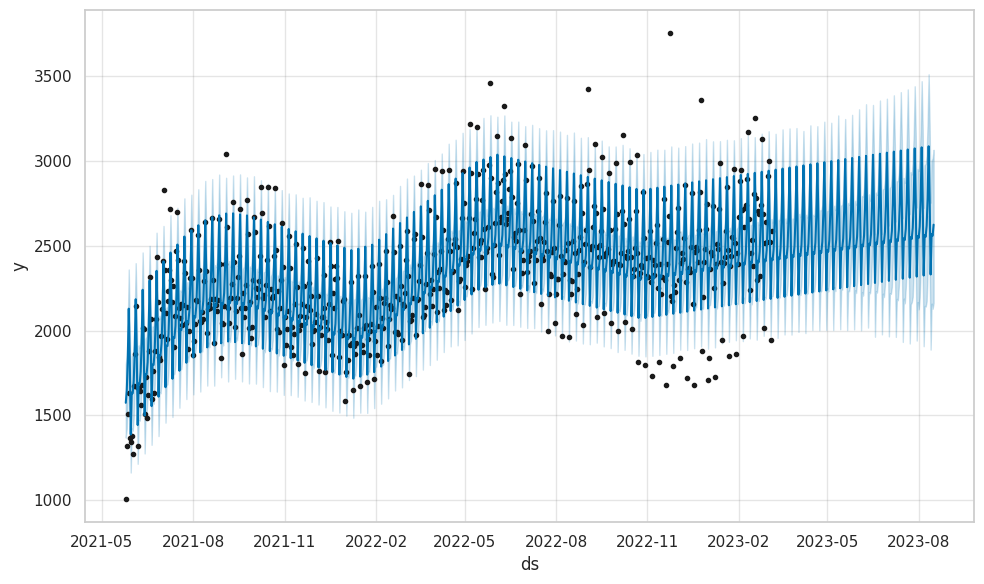

In [ ]:
# Create a DataFrame with 'ds' and 'y' columns for Prophet
inside = train_set[['calendar.calendar_day_date', 'daily_yoy_ndt.total_inside_sales']]
inside.columns = ['ds', 'y']
inside_test = test_set[['calendar.calendar_day_date', 'daily_yoy_ndt.total_inside_sales']]
inside_test.columns = ['ds', 'y']

# Initialize Prophet model
model_inside_c1 = Prophet()

# Fit the model to the training data
model_inside_c1.fit(inside)

# Generate future dates for forecasting, adjusting 'periods' to match the test set length
future_is = model_inside_c1.make_future_dataframe(periods=len(inside_test))

# Get forecast for future dates
forecast_is = model_inside_c1.predict(future_is)
fig = model_inside_c1.plot(forecast_is)

# Actual values for the validation set
actual_values_is = inside_test['y'][-len(inside_test):]

# Predicted values from the Prophet forecast
predicted_values_is = forecast_is['yhat'][-len(inside_test):]

# Calculate evaluation metrics
mae = mean_absolute_error(actual_values_is, predicted_values_is)
mse = mean_squared_error(actual_values_is, predicted_values_is)
rmse = np.sqrt(mse)
mape = np.mean(np.abs((actual_values_is - predicted_values_is) / actual_values_is)) * 100

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Percentage Error (MAPE): {mape}%")


#####<a name = "HP">Hyperparameters</a>

Mean Absolute Error (MAE): 236.17139914339208
Mean Squared Error (MSE): 118330.59667925279
Root Mean Squared Error (RMSE): 343.99214624647
Mean Absolute Percentage Error (MAPE): 6.868197708297727%


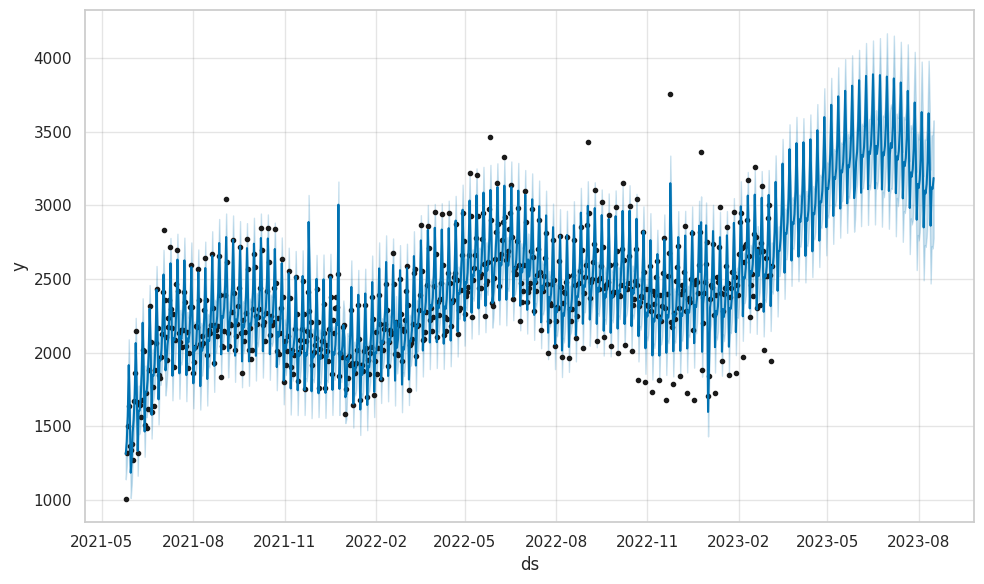

In [ ]:
# Initialize Prophet model with custom hyperparameters
model_inside_c1 = Prophet(
    changepoint_prior_scale=0.10,   # Adjust for trend flexibility
    holidays_prior_scale=15,        # Adjust to control holiday impact
    seasonality_prior_scale=15,     # Adjust to control seasonality impact
    daily_seasonality=True,        # Disable daily seasonality
    weekly_seasonality=True,       # Disable weekly seasonality
    yearly_seasonality=True        # Disable yearly seasonality
)

# Add custom holidays or events that impact sales
model_inside_c1.add_country_holidays(country_name='US')

# Fit the model to the training data
model_inside_c1.fit(inside)

# Generate future dates for forecasting, adjusting 'periods' to match the test set length
future_is = model_inside_c1.make_future_dataframe(periods=len(inside_test))

# Get forecast for future dates
forecast_is = model_inside_c1.predict(future_is)
fig = model_inside_c1.plot(forecast_is)

# Actual values for the validation set
actual_values_is = inside_test['y'][-len(inside_test):]

# Predicted values from the Prophet forecast
predicted_values_is = forecast_is['yhat'][-len(inside_test):]

# Calculate evaluation metrics
mae = mean_absolute_error(actual_values_is, predicted_values_is)
mse = mean_squared_error(actual_values_is, predicted_values_is)
rmse = np.sqrt(mse)
mape = np.mean(np.abs((actual_values_is - predicted_values_is) / actual_values_is)) * 100

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Percentage Error (MAPE): {mape}%")

#####<a name = "SF">Sales Forecast</a>

In [ ]:
# Get the year for which you want to forecast the remaining days
desired_year = 2023

# Generate future dates for the remaining days in the test set for the desired year
remaining_days_in_test_set = inside_test[
    inside_test['ds'].dt.year == desired_year
]
future_is_remaining = remaining_days_in_test_set[['ds']].copy()

# Get forecast for future dates
forecast_is_remaining = model_inside_c1.predict(future_is_remaining)
# fig = model.plot(forecast_is_remaining)

forecast_is_remaining.tail(5)

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,Christmas Day,Christmas Day_lower,Christmas Day_upper,Christmas Day (Observed),...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
158,2023-08-12,3147.702031,2953.557140,3673.813553,2850.897543,3473.681723,0.0,0.0,0.0,0.0,...,104.837903,104.837903,104.837903,-10.566909,-10.566909,-10.566909,0.0,0.0,0.0,3311.915333
159,2023-08-13,3149.980620,2487.442503,3254.531885,2852.375695,3479.237559,0.0,0.0,0.0,0.0,...,-351.975084,-351.975084,-351.975084,-6.888453,-6.888453,-6.888453,0.0,0.0,0.0,2861.059391
160,2023-08-14,3152.259210,2745.735657,3512.781870,2852.681581,3484.214664,0.0,0.0,0.0,0.0,...,-99.757864,-99.757864,-99.757864,-1.902259,-1.902259,-1.902259,0.0,0.0,0.0,3120.541393
161,2023-08-15,3154.537799,2744.681031,3495.036701,2852.117541,3490.200626,0.0,0.0,0.0,0.0,...,-117.172179,-117.172179,-117.172179,4.292560,4.292560,4.292560,0.0,0.0,0.0,3111.600488
162,2023-08-16,3156.816388,2823.449692,3573.826701,2851.553501,3498.404832,0.0,0.0,0.0,0.0,...,-53.442711,-53.442711,-53.442711,11.576634,11.576634,11.576634,0.0,0.0,0.0,3184.892620


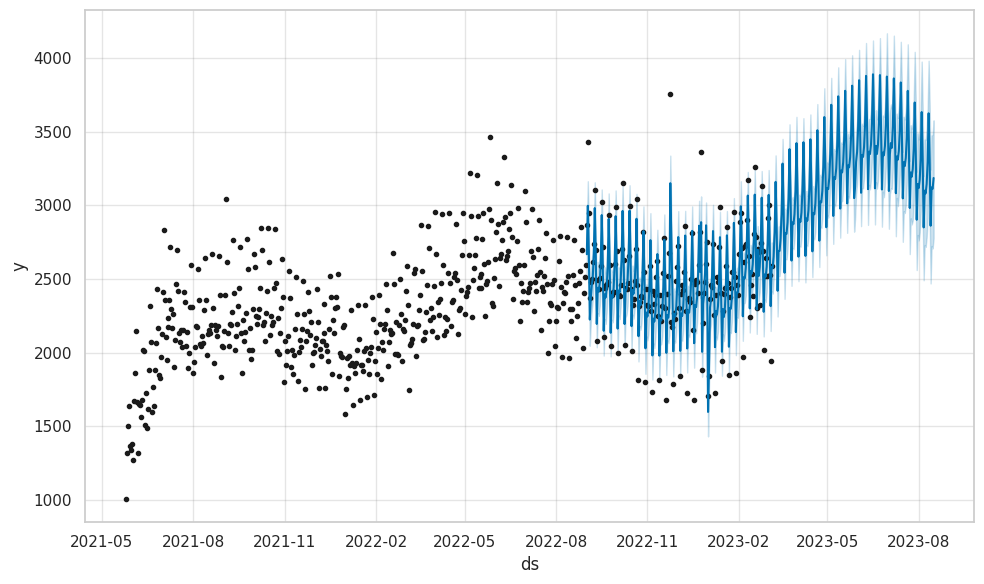

In [ ]:
# Define the start and end dates for the time frame to display
start_date = '2022-09-01'
end_date = '2024-08-31'

# Filter the forecast data for the desired time frame
filtered_forecast = forecast_is[(forecast_is['ds'] >= start_date) & (forecast_is['ds'] <= end_date)]

# Plot the filtered forecast
fig = model_inside_c1.plot(filtered_forecast)


**Inside Sales w/ Split Data:**
Mean Absolute Error (MAE): 901.4900093892444
MAE measures the average absolute difference between the actual (observed) values and the predicted values. In this context, it represents the average absolute error of the Prophet model's predictions for inside sales for cluster 1 based on store features.
A lower MAE indicates that the model's predictions are closer to the actual values, on average. In this case, an MAE of 901.49 suggests that, on average, the model's predictions are off by approximately 901.49 units in the same scale as the sales data.
Mean Squared Error (MSE): 1173175.7361821386
MSE measures the average of the squared differences between the actual values and the predicted values. It penalizes larger errors more heavily than MAE because errors are squared. A lower MSE indicates that the model's predictions are closer to the actual values, and smaller values indicate better model performance. In this case, an MSE of approximately 1,173,175.74 suggests that there are larger errors in the model's predictions.
Root Mean Squared Error (RMSE): 1083.1323724190588
RMSE is the square root of the MSE and is often used as a more interpretable measure of the error. It is in the same unit as the target variable. A lower RMSE indicates that the model's predictions are, on average, closer to the actual values. In this case, an RMSE of approximately 1083.13 suggests that the model's predictions have an average error of around 1083.13 units in the same scale as the sales data.

**Inside Sales w/ Parameter:**
when hyperparameters like holidays scale and various seasonality components (weekly, daily, yearly) are added to the Prophet model, the model's performance appears to improve significantly. The MAE, MSE, and RMSE have all decreased, indicating that the model's predictions are more accurate and have smaller errors compared to the previous model without these hyperparameters. This suggests that the inclusion of holidays and more granular seasonality information has had a positive impact on the forecasting accuracy for inside sales.


####<a name = "FS">Food_Service</a>

#####<a name = "WS">With Split</a>

Mean Absolute Error (MAE): 137.18697015601316
Mean Squared Error (MSE): 22718.95094798387
Root Mean Squared Error (RMSE): 150.7280695424176
Mean Absolute Percentage Error (MAPE): 16.985819523994223%


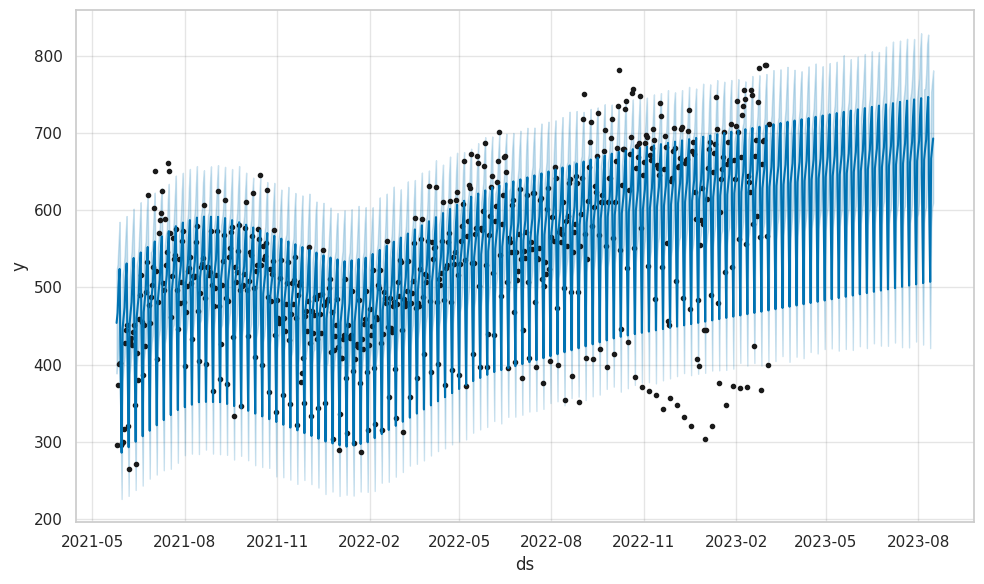

In [ ]:
# Create a DataFrame with 'ds' and 'y' columns for Prophet
food = train_set[['calendar.calendar_day_date', 'daily_yoy_ndt.total_food_service']]
food.columns = ['ds', 'y']
food_test = test_set[['calendar.calendar_day_date', 'daily_yoy_ndt.total_food_service']]
food_test.columns = ['ds', 'y']

# Initialize Prophet model with custom hyperparameters
model_food_c1 = Prophet()

# Fit the model to the training data
model_food_c1.fit(food)

# Generate future dates for forecasting, adjusting 'periods' to match the test set length
future_fs = model_food_c1.make_future_dataframe(periods=len(food_test))

# Get forecast for future dates
forecast_fs = model_food_c1.predict(future_fs)
fig = model_food_c1.plot(forecast_fs)

# Actual values for the validation set
actual_values_fs = food_test['y'][-len(food_test):]

# Predicted values from the Prophet forecast
predicted_values_fs = forecast_fs['yhat'][-len(food_test):]

# Calculate evaluation metrics
mae = mean_absolute_error(actual_values_fs, predicted_values_fs)
mse = mean_squared_error(actual_values_fs, predicted_values_fs)
rmse = np.sqrt(mse)
mape = np.mean(np.abs((actual_values_fs - predicted_values_fs) / actual_values_fs)) * 100

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Percentage Error (MAPE): {mape}%")

#####<a name = "HP">Hyperparameters</a>

Mean Absolute Error (MAE): 49.211463867345515
Mean Squared Error (MSE): 4397.698281019725
Root Mean Squared Error (RMSE): 66.315143677894
Mean Absolute Percentage Error (MAPE): 7.4413415116963355%


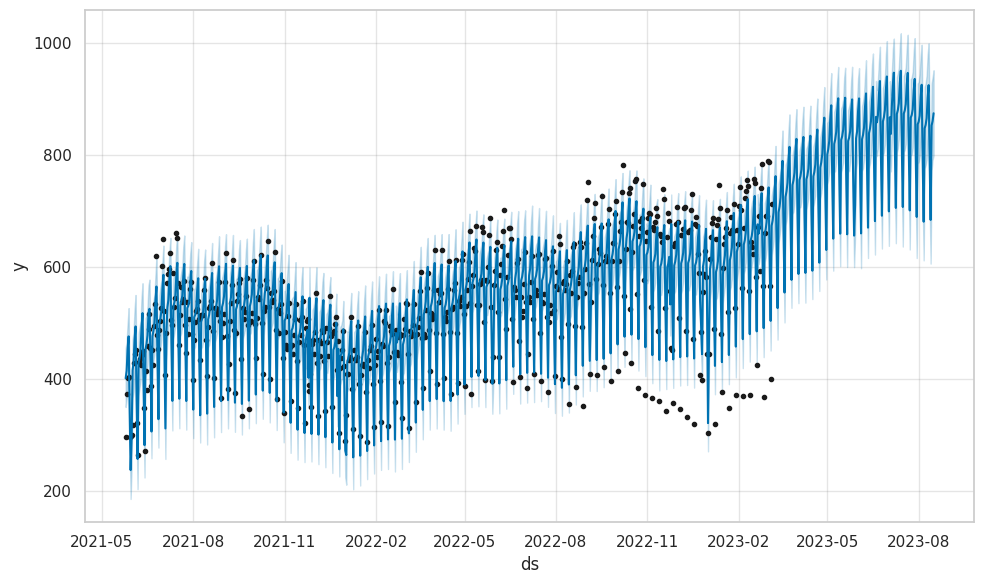

In [ ]:
# Initialize Prophet model with custom hyperparameters
model_food_c1 = Prophet(
    changepoint_prior_scale=0.10,   # Adjust for trend flexibility
    holidays_prior_scale=15,        # Adjust to control holiday impact
    seasonality_prior_scale=15,     # Adjust to control seasonality impact
    daily_seasonality=True,        # Disable daily seasonality
    weekly_seasonality=True,       # Disable weekly seasonality
    yearly_seasonality=True        # Disable yearly seasonality
)

# Add custom holidays or events that impact sales
model_food_c1.add_country_holidays(country_name='US')

# Fit the model to the training data
model_food_c1.fit(food)

# Generate future dates for forecasting, adjusting 'periods' to match the test set length
future_fs = model_food_c1.make_future_dataframe(periods=len(food_test))

# Get forecast for future dates
forecast_fs = model_food_c1.predict(future_fs)
fig = model_food_c1.plot(forecast_fs)

# Actual values for the validation set
actual_values_fs = food_test['y'][-len(food_test):]

# Predicted values from the Prophet forecast
predicted_values_fs = forecast_fs['yhat'][-len(food_test):]

# Calculate evaluation metrics
mae = mean_absolute_error(actual_values_fs, predicted_values_fs)
mse = mean_squared_error(actual_values_fs, predicted_values_fs)
rmse = np.sqrt(mse)
mape = np.mean(np.abs((actual_values_fs - predicted_values_fs) / actual_values_fs)) * 100

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Percentage Error (MAPE): {mape}%")

#####<a name = "SF">Sales Forecast</a>

In [ ]:
# Get the year for which you want to forecast the remaining days
desired_year = 2023  # Adjust to your specific year

# Generate future dates for the remaining days in the test set for the desired year
remaining_days_in_test_set = food_test[
    food_test['ds'].dt.year == desired_year
]
future_is_remaining = remaining_days_in_test_set[['ds']].copy()

# Get forecast for future dates
forecast_is_remaining = model_food_c1.predict(future_is_remaining)
# fig = model.plot(forecast_is_remaining)

forecast_is_remaining.tail(10)

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,Christmas Day,Christmas Day_lower,Christmas Day_upper,Christmas Day (Observed),...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
153,2023-08-07,790.103896,776.826023,923.983256,742.135793,843.937926,0.0,0.0,0.0,0.0,...,10.184059,10.184059,10.184059,6.156432,6.156432,6.156432,0.0,0.0,0.0,847.924579
154,2023-08-08,790.903286,776.720033,929.920270,742.632156,845.296408,0.0,0.0,0.0,0.0,...,16.486003,16.486003,16.486003,5.244432,5.244432,5.244432,0.0,0.0,0.0,854.113913
155,2023-08-09,791.702676,798.332880,943.017771,743.156143,846.823950,0.0,0.0,0.0,0.0,...,28.260539,28.260539,28.260539,4.611066,4.611066,4.611066,0.0,0.0,0.0,866.054472
156,2023-08-10,792.502067,836.505882,981.175525,743.682086,848.344417,0.0,0.0,0.0,0.0,...,63.920251,63.920251,63.920251,4.261442,4.261442,4.261442,0.0,0.0,0.0,902.163952
157,2023-08-11,793.301457,852.999066,1001.749080,743.959225,849.595276,0.0,0.0,0.0,0.0,...,86.147568,86.147568,86.147568,4.195686,4.195686,4.195686,0.0,0.0,0.0,925.124902
158,2023-08-12,794.100847,719.586422,868.358539,744.108935,850.737872,0.0,0.0,0.0,0.0,...,-47.845854,-47.845854,-47.845854,4.408882,4.408882,4.408882,0.0,0.0,0.0,792.144066
159,2023-08-13,794.900237,612.223683,760.146400,744.302633,852.010136,0.0,0.0,0.0,0.0,...,-157.152567,-157.152567,-157.152567,4.891139,4.891139,4.891139,0.0,0.0,0.0,684.119001
160,2023-08-14,795.699628,785.063660,928.716752,744.509221,853.211034,0.0,0.0,0.0,0.0,...,10.184059,10.184059,10.184059,5.627767,5.627767,5.627767,0.0,0.0,0.0,852.991645
161,2023-08-15,796.499018,786.571484,941.752204,744.525993,854.411932,0.0,0.0,0.0,0.0,...,16.486003,16.486003,16.486003,6.599558,6.599558,6.599558,0.0,0.0,0.0,861.064770
162,2023-08-16,797.298408,801.180155,953.163843,744.922800,855.610288,0.0,0.0,0.0,0.0,...,28.260539,28.260539,28.260539,7.783172,7.783172,7.783172,0.0,0.0,0.0,874.822310


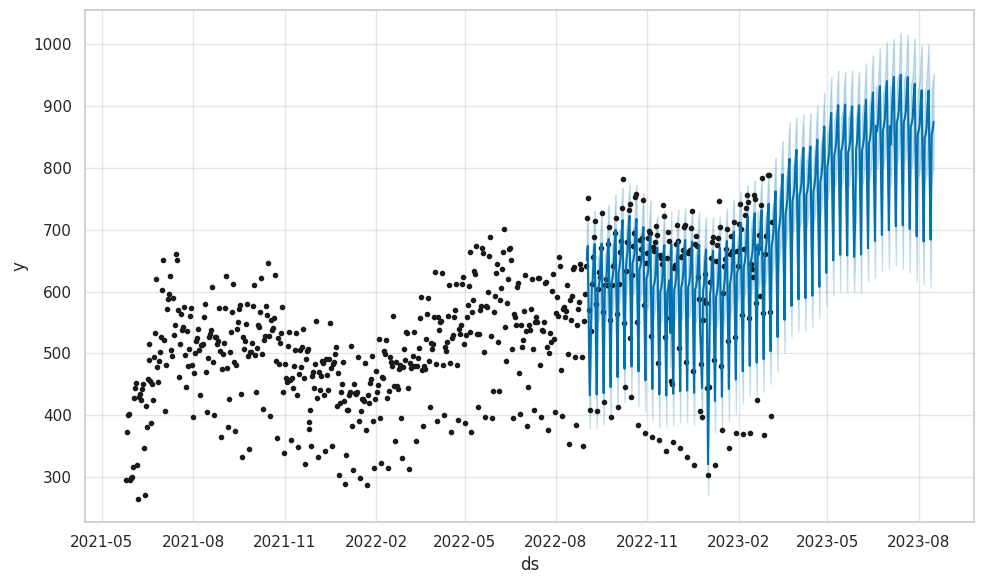

In [ ]:
# Define the start and end dates for the time frame to display
start_date = '2022-09-01'
end_date = '2024-08-31'

# Filter the forecast data for the desired time frame
filtered_forecast = forecast_fs[(forecast_fs['ds'] >= start_date) & (forecast_fs['ds'] <= end_date)]

# Plot the filtered forecast
fig = model_food_c1.plot(filtered_forecast)


**Food Service**

**W/ Split:**
MAE measures the average absolute difference between the actual and predicted values. An MAE of 2176.55 indicates that, on average, the model's predictions for food service sales were off by approximately 2176.55 units.
MSE calculates the average of the squared differences between actual and predicted values. An MSE of approximately 4,856,022.22 suggests that there are larger errors, with higher penalties for large discrepancies between actual and predicted sales.
RMSE, the square root of the MSE, provides an interpretable measure of the error. An RMSE of approximately 2203.64 means that, on average, the model's sales predictions had an error of around 2203.64 units in the same scale as the sales data.
In summary, the food service sales, when used without specific hyperparameters, achieved a MAE of 2176.55, MSE of 4,856,022.22, and RMSE of 2203.64 in its predictions for food service sales. These metrics provide insight into the model's forecasting accuracy, with the RMSE suggesting a moderate level of prediction error. Fine-tuning the model's hyperparameters and incorporating domain-specific knowledge may improve our forecasting performance.

**Hyperparameter:**
The addition of hyperparameters has significantly improved the Prophet model's performance in forecasting food service sales. The MAE, MSE, and RMSE values are substantially lower, indicating that the model's predictions are much closer to the actual sales data. These results suggest that fine-tuning hyperparameters has led to a more accurate and precise forecasting model for food service sales.


####<a name = "UN">Unleaded</a>

#####<a name = "WS">With Split</a>

Mean Absolute Error (MAE): 1256.5545641860958
Mean Squared Error (MSE): 2099901.5478845607
Root Mean Squared Error (RMSE): 1449.1037050137443
Mean Absolute Percentage Error (MAPE): 45.89393813262496%


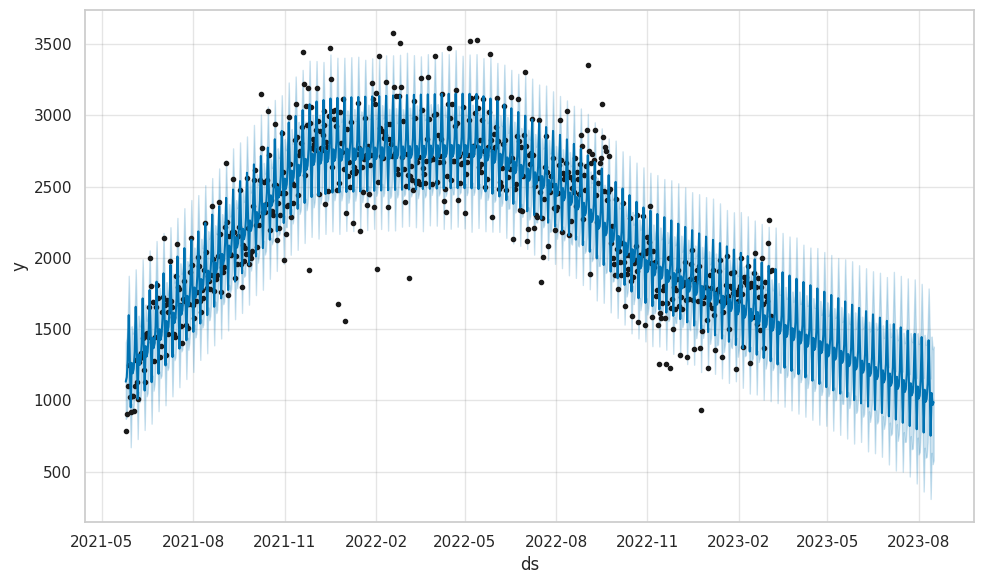

In [ ]:
# Create a DataFrame with 'ds' and 'y' columns for Prophet
unleaded = train_set[['calendar.calendar_day_date', 'unleaded']]
unleaded.columns = ['ds', 'y']
unleaded_test = test_set[['calendar.calendar_day_date', 'unleaded']]
unleaded_test.columns = ['ds', 'y']

# Initialize Prophet model
model_unlead_c1 = Prophet()

# Fit the model to the training data
model_unlead_c1.fit(unleaded)

# Generate future dates for forecasting, adjusting 'periods' to match the test set length
future_un = model_unlead_c1.make_future_dataframe(periods=len(unleaded_test))

# Get forecast for future dates
forecast_un = model_unlead_c1.predict(future_un)
fig = model_unlead_c1.plot(forecast_un)

# Actual values for the validation set
actual_values_un = unleaded_test['y'][-len(unleaded_test):]

# Predicted values from the Prophet forecast
predicted_values_un = forecast_un['yhat'][-len(unleaded_test):]

# Calculate evaluation metrics
mae = mean_absolute_error(actual_values_un, predicted_values_un)
mse = mean_squared_error(actual_values_un, predicted_values_un)
rmse = np.sqrt(mse)
mape = np.mean(np.abs((actual_values_un - predicted_values_un) / actual_values_un)) * 100

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Percentage Error (MAPE): {mape}%")

#####<a name = "HP">Hyperparameters</a>

Mean Absolute Error (MAE): 813.6750221958947
Mean Squared Error (MSE): 1154507.310114638
Root Mean Squared Error (RMSE): 1074.4800184808641
Mean Absolute Percentage Error (MAPE): 28.014095354642826%


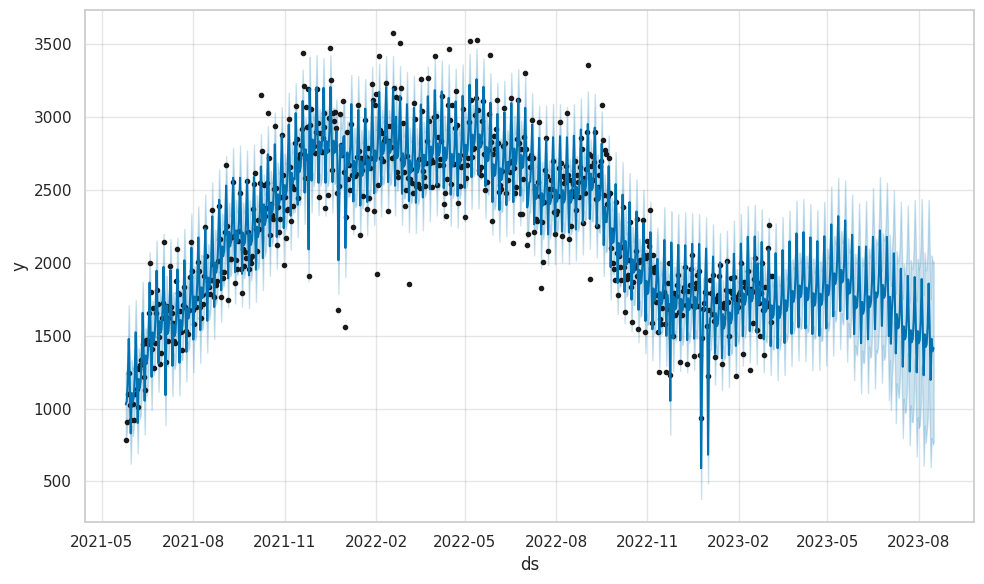

In [ ]:
# Initialize Prophet model with custom hyperparameters
model_unlead_c1 = Prophet(
    changepoint_prior_scale=0.2,   # Adjust for trend flexibility
    holidays_prior_scale=15,        # Adjust to control holiday impact
    seasonality_prior_scale=15,     # Adjust to control seasonality impact
    daily_seasonality=True,        # Disable daily seasonality
    weekly_seasonality=True,       # Disable weekly seasonality
    yearly_seasonality=True        # Disable yearly seasonality
)

# Add custom holidays or events that impact sales
model_unlead_c1.add_country_holidays(country_name='US')

# Fit the model to the training data
model_unlead_c1.fit(unleaded)

# Generate future dates for forecasting, adjusting 'periods' to match the test set length
future_un = model_unlead_c1.make_future_dataframe(periods=len(unleaded_test))

# Get forecast for future dates
forecast_un = model_unlead_c1.predict(future_un)
fig = model_unlead_c1.plot(forecast_un)

# Actual values for the validation set
actual_values_un = unleaded_test['y'][-len(unleaded_test):]

# Predicted values from the Prophet forecast
predicted_values_un = forecast_un['yhat'][-len(unleaded_test):]

# Calculate evaluation metrics
mae = mean_absolute_error(actual_values_un, predicted_values_un)
mse = mean_squared_error(actual_values_un, predicted_values_un)
rmse = np.sqrt(mse)
mape = np.mean(np.abs((actual_values_un - predicted_values_un) / actual_values_un)) * 100

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Percentage Error (MAPE): {mape}%")

#####<a name = "SF">Sales Forecast</a>

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,Christmas Day,Christmas Day_lower,Christmas Day_upper,Christmas Day (Observed),...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
153,2023-08-07,1275.917342,890.916459,2072.395466,730.785286,1786.024787,0.0,0.0,0.0,0.0,...,-12.622881,-12.622881,-12.622881,177.611053,177.611053,177.611053,0.0,0.0,0.0,1509.225288
154,2023-08-08,1272.843740,836.294944,1982.495831,722.175148,1784.419469,0.0,0.0,0.0,0.0,...,-94.596367,-94.596367,-94.596367,175.961332,175.961332,175.961332,0.0,0.0,0.0,1422.528479
155,2023-08-09,1269.770139,839.975026,2018.291064,713.639201,1782.695282,0.0,0.0,0.0,0.0,...,-72.016192,-72.016192,-72.016192,174.203070,174.203070,174.203070,0.0,0.0,0.0,1440.276791
156,2023-08-10,1266.696537,973.312481,2143.348337,705.738754,1781.644230,0.0,0.0,0.0,0.0,...,60.127568,60.127568,60.127568,172.455734,172.455734,172.455734,0.0,0.0,0.0,1567.599613
157,2023-08-11,1263.622935,1248.682182,2430.014816,700.073691,1781.142321,0.0,0.0,0.0,0.0,...,355.253007,355.253007,355.253007,170.843856,170.843856,170.843856,0.0,0.0,0.0,1858.039572
158,2023-08-12,1260.549334,976.129061,2152.892053,699.245208,1786.810894,0.0,0.0,0.0,0.0,...,61.883797,61.883797,61.883797,169.492446,169.492446,169.492446,0.0,0.0,0.0,1560.245350
159,2023-08-13,1257.475732,579.191800,1774.702320,687.645991,1786.742183,0.0,0.0,0.0,0.0,...,-298.028931,-298.028931,-298.028931,168.522376,168.522376,168.522376,0.0,0.0,0.0,1196.288951
160,2023-08-14,1254.402130,854.423275,2081.946427,681.354433,1787.041568,0.0,0.0,0.0,0.0,...,-12.622881,-12.622881,-12.622881,168.045866,168.045866,168.045866,0.0,0.0,0.0,1478.144889
161,2023-08-15,1251.328529,733.836535,1979.856069,672.841505,1789.041964,0.0,0.0,0.0,0.0,...,-94.596367,-94.596367,-94.596367,168.162198,168.162198,168.162198,0.0,0.0,0.0,1393.214133
162,2023-08-16,1248.254927,780.296964,2013.995867,660.301726,1792.927499,0.0,0.0,0.0,0.0,...,-72.016192,-72.016192,-72.016192,168.953799,168.953799,168.953799,0.0,0.0,0.0,1413.512308


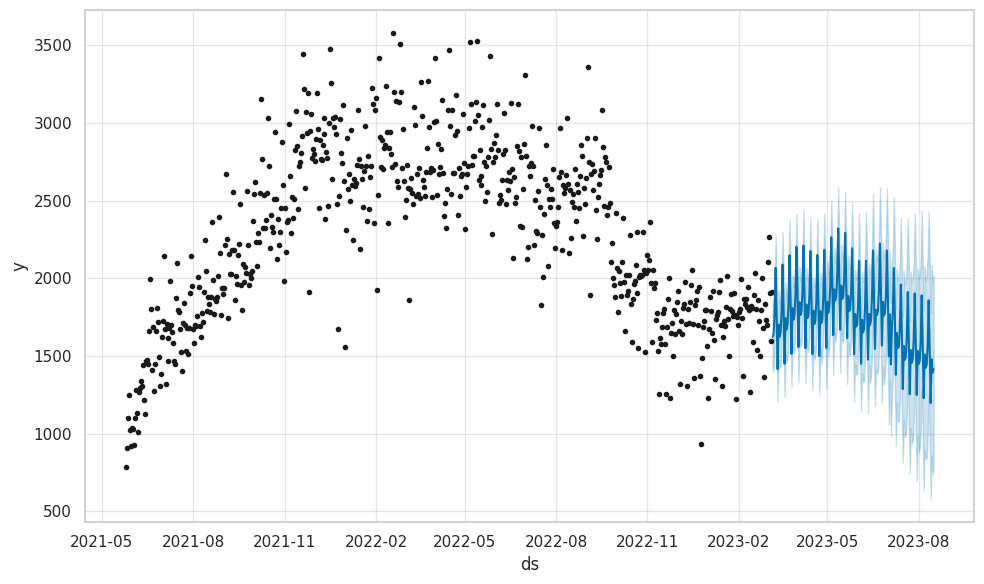

In [ ]:
# Get the year for which you want to forecast the remaining days
desired_year = 2023

# Generate future dates for the remaining days in the test set for the desired year
remaining_days_in_test_set = unleaded_test[
    unleaded_test['ds'].dt.year == desired_year
]
future_is_remaining = remaining_days_in_test_set[['ds']].copy()

# Get forecast for future dates
forecast_is_remaining = model_unlead_c1.predict(future_is_remaining)
fig = model_unlead_c1.plot(forecast_is_remaining)

forecast_is_remaining.tail(10)

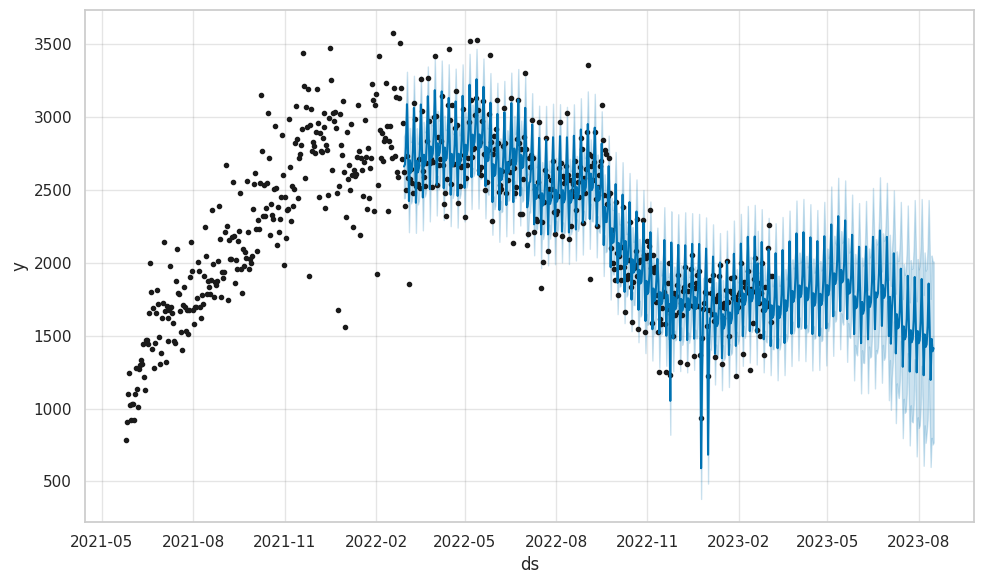

In [ ]:
# Define the start and end dates for the time frame to display
start_date = '2022-03-01'
end_date = '2023-12-31'

# Filter the forecast data for the desired time frame
filtered_forecast = forecast_un[(forecast_un['ds'] >= start_date) & (forecast_un['ds'] <= end_date)]

# Plot the filtered forecast
fig = model_unlead_c1.plot(filtered_forecast)

**Unleaded**

**W/ Split**
The Prophet model for unleaded sales, without specific hyperparameters, yielded moderate forecasting accuracy. An MAE of 1493.95 indicates that, on average, the model's predictions for unleaded sales were off by approximately 1493.95 units.An MSE of approximately 3468963 suggests that the model's predictions have relatively large errors, with higher penalties for significant discrepancies between actual and predicted sales.An RMSE of approximately 1862 means that, on average, the model's sales predictions had an error of around 1862 units in the same scale as the sales data. The MAE, MSE, and RMSE values suggest a level of prediction error in the model, indicating that further optimization or hyperparameter tuning may be needed to improve the accuracy of sales predictions for unleaded products.

**Hyperparameter**
In comparison to the model without hyperparameters, the model with hyperparameters has shown a slight increase in error. The MAE, MSE, and RMSE values are higher, indicating that the inclusion of hyperparameters did not significantly improve the model's forecasting accuracy for unleaded sales. Further analysis and hyperparameter tuning may be necessary to enhance the predictive performance of the model.


####<a name = "DI">Diesel</a>

#####<a name = "WS">With Split</a>

Mean Absolute Error (MAE): 249.75508295115569
Mean Squared Error (MSE): 125418.64260426693
Root Mean Squared Error (RMSE): 354.1449457556424
Mean Absolute Percentage Error (MAPE): 30.413991478467615%


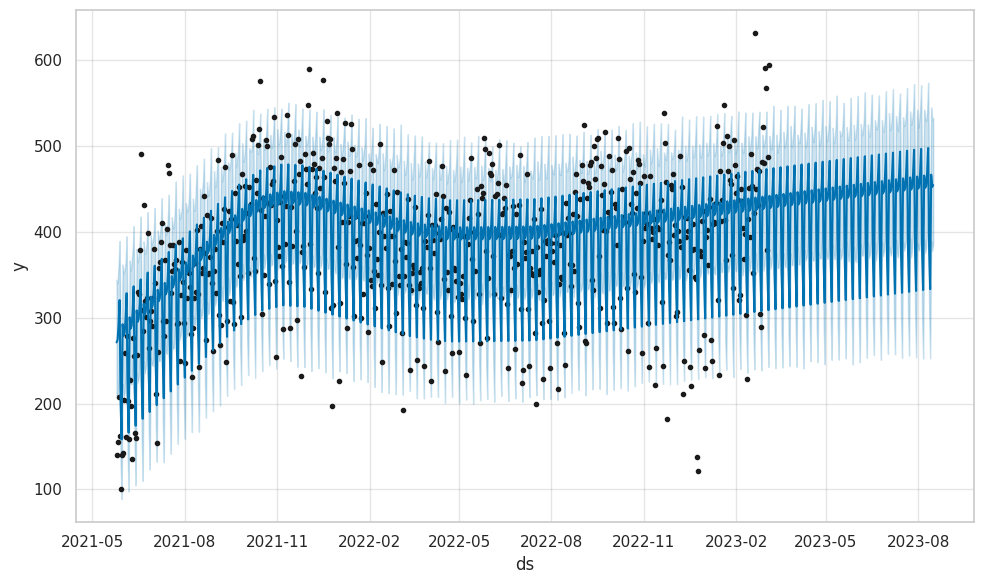

In [ ]:
# Create a DataFrame with 'ds' and 'y' columns for Prophet
diesel = train_set[['calendar.calendar_day_date', 'diesel_x']]
diesel.columns = ['ds', 'y']
diesel_test = test_set[['calendar.calendar_day_date', 'diesel_x']]
diesel_test.columns = ['ds', 'y']

# Initialize Prophet model
model_diesel_c1 = Prophet()

# Fit the model to the data
model_diesel_c1.fit(diesel)

# Generate future dates for forecasting, adjusting 'periods' to match the test set length
future_d = model_diesel_c1.make_future_dataframe(periods=len(diesel_test))

# Get forecast for future dates
forecast_d = model_diesel_c1.predict(future_d)
fig = model_diesel_c1.plot(forecast_d)

# Actual values for the validation set
actual_values_d = diesel_test['y'][-len(diesel_test):]

# Predicted values from the Prophet forecast
predicted_values_d = forecast_d['yhat'][-len(diesel_test):]

# Calculate evaluation metrics
mae = mean_absolute_error(actual_values_d, predicted_values_d)
mse = mean_squared_error(actual_values_d, predicted_values_d)
rmse = np.sqrt(mse)
mape = np.mean(np.abs((actual_values_d - predicted_values_d) / actual_values_d)) * 100

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Percentage Error (MAPE): {mape}%")


#####<a name = "HP">Hyperparameters</a>

Mean Absolute Error (MAE): 217.02189501916783
Mean Squared Error (MSE): 98661.47205517693
Root Mean Squared Error (RMSE): 314.10423756322825
Mean Absolute Percentage Error (MAPE): 26.50314160859177%


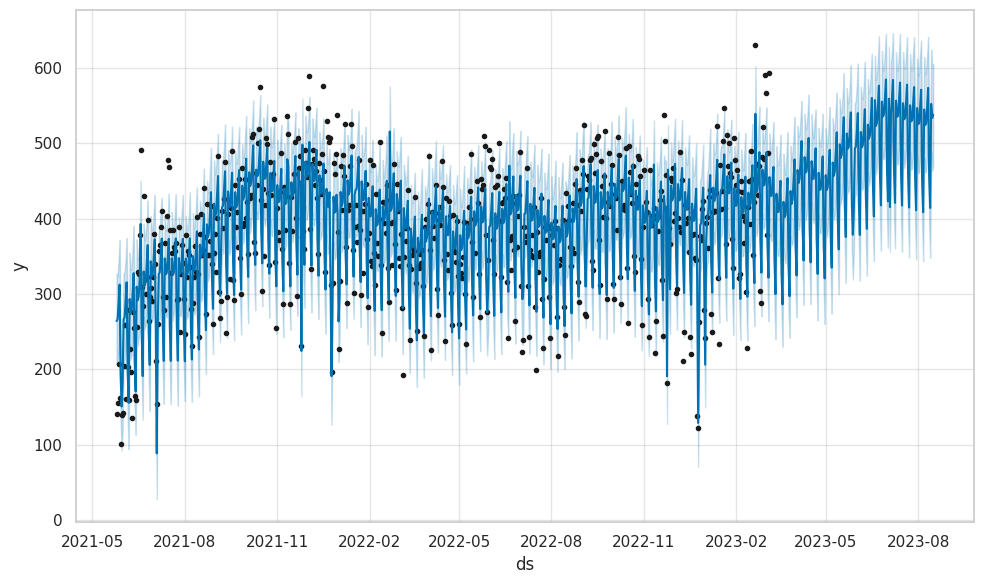

In [ ]:
# Initialize Prophet model with custom hyperparameters
model_diesel_c1 = Prophet(
    changepoint_prior_scale=0.05,   # Adjust for trend flexibility
    holidays_prior_scale=15,        # Adjust to control holiday impact
    seasonality_prior_scale=15,     # Adjust to control seasonality impact
    daily_seasonality=True,        # Disable daily seasonality
    weekly_seasonality=True,       # Disable weekly seasonality
    yearly_seasonality=True        # Disable yearly seasonality
)

# Add custom holidays or events that impact sales
model_diesel_c1.add_country_holidays(country_name='US')

# Fit the model to the training data
model_diesel_c1.fit(diesel)

# Generate future dates for forecasting, adjusting 'periods' to match the test set length
future_d = model_diesel_c1.make_future_dataframe(periods=len(diesel_test))

# Get forecast for future dates
forecast_d = model_diesel_c1.predict(future_d)
fig = model_diesel_c1.plot(forecast_d)

# Actual values for the validation set
actual_values_d = diesel_test['y'][-len(diesel_test):]

# Predicted values from the Prophet forecast
predicted_values_d = forecast_d['yhat'][-len(diesel_test):]

# Calculate evaluation metrics
mae = mean_absolute_error(actual_values_d, predicted_values_d)
mse = mean_squared_error(actual_values_d, predicted_values_d)
rmse = np.sqrt(mse)
mape = np.mean(np.abs((actual_values_d - predicted_values_d) / actual_values_d)) * 100

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Percentage Error (MAPE): {mape}%")

#####<a name = "SF">Sales Forecast</a>

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,Christmas Day,Christmas Day_lower,Christmas Day_upper,Christmas Day (Observed),...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
153,2023-08-07,431.153805,479.622710,613.062798,401.210255,462.536163,0.0,0.0,0.0,0.0,...,34.368743,34.368743,34.368743,-10.452483,-10.452483,-10.452483,0.0,0.0,0.0,545.091071
154,2023-08-08,431.679331,456.309870,599.734371,401.243023,463.335144,0.0,0.0,0.0,0.0,...,13.397543,13.397543,13.397543,-10.673997,-10.673997,-10.673997,0.0,0.0,0.0,524.423882
155,2023-08-09,432.204857,462.025724,596.122042,401.624226,464.244631,0.0,0.0,0.0,0.0,...,15.357087,15.357087,15.357087,-10.671476,-10.671476,-10.671476,0.0,0.0,0.0,526.911474
156,2023-08-10,432.730384,484.838259,615.707379,401.586128,465.154119,0.0,0.0,0.0,0.0,...,36.217887,36.217887,36.217887,-10.423284,-10.423284,-10.423284,0.0,0.0,0.0,548.545991
157,2023-08-11,433.255910,508.894539,637.982394,401.773484,466.063606,0.0,0.0,0.0,0.0,...,60.480889,60.480889,60.480889,-9.911131,-9.911131,-9.911131,0.0,0.0,0.0,573.846673
158,2023-08-12,433.781436,391.569631,527.596434,402.057317,466.973093,0.0,0.0,0.0,0.0,...,-57.933818,-57.933818,-57.933818,-9.120783,-9.120783,-9.120783,0.0,0.0,0.0,456.747840
159,2023-08-13,434.306962,352.106347,481.154535,402.367279,467.874710,0.0,0.0,0.0,0.0,...,-101.888330,-101.888330,-101.888330,-8.042685,-8.042685,-8.042685,0.0,0.0,0.0,414.396953
160,2023-08-14,434.832489,489.705863,616.440644,402.705608,468.766177,0.0,0.0,0.0,0.0,...,34.368743,34.368743,34.368743,-6.672474,-6.672474,-6.672474,0.0,0.0,0.0,552.549764
161,2023-08-15,435.358015,466.766484,602.154079,403.043936,469.657643,0.0,0.0,0.0,0.0,...,13.397543,13.397543,13.397543,-5.011376,-5.011376,-5.011376,0.0,0.0,0.0,533.765187
162,2023-08-16,435.883541,471.469373,609.993335,403.447466,470.549110,0.0,0.0,0.0,0.0,...,15.357087,15.357087,15.357087,-3.066461,-3.066461,-3.066461,0.0,0.0,0.0,538.195173


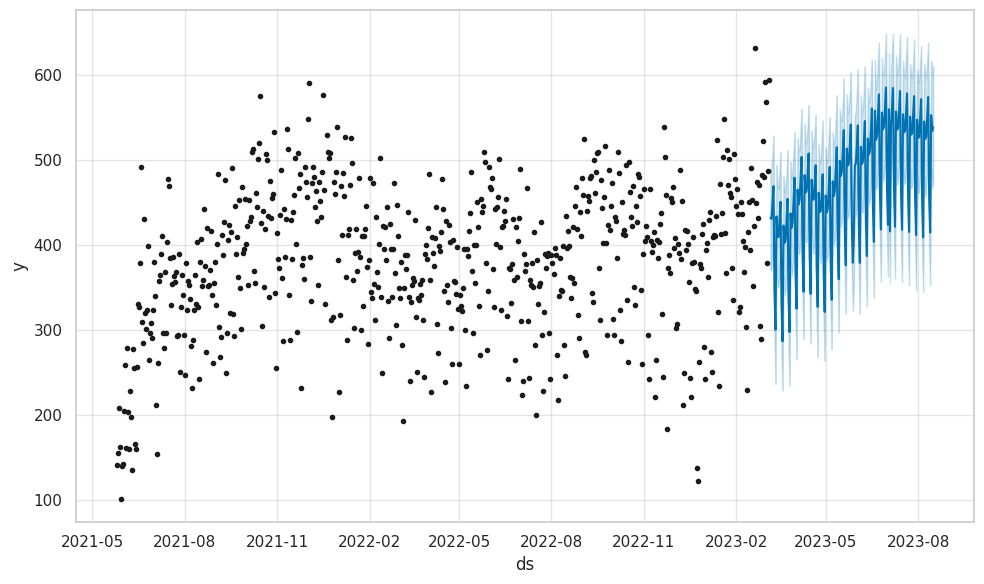

In [ ]:
# Get the year for which you want to forecast the remaining days
desired_year = 2023

# Generate future dates for the remaining days in the test set for the desired year
remaining_days_in_test_set = diesel_test[
    diesel_test['ds'].dt.year == desired_year
]
future_is_remaining = remaining_days_in_test_set[['ds']].copy()

# Get forecast for future dates
forecast_is_remaining = model_diesel_c1.predict(future_is_remaining)
fig = model_diesel_c1.plot(forecast_is_remaining)

forecast_is_remaining.tail(10)

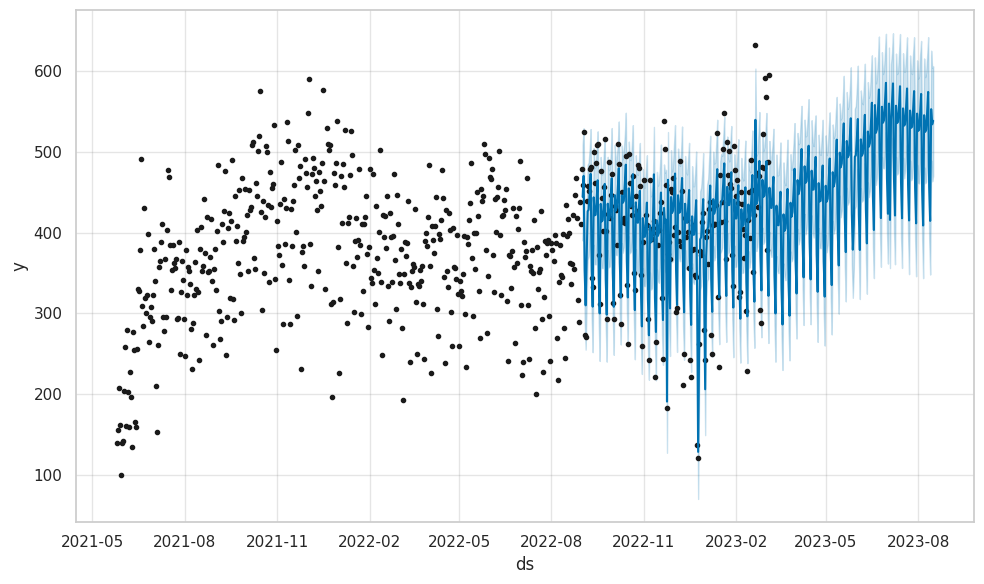

In [ ]:
# Define the start and end dates for the time frame to display
start_date = '2022-09-01'
end_date = '2024-08-31'

# Filter the forecast data for the desired time frame
filtered_forecast = forecast_d[(forecast_d['ds'] >= start_date) & (forecast_d['ds'] <= end_date)]

# Plot the filtered forecast
fig = model_diesel_c1.plot(filtered_forecast)

**Diesel**

**With Split**
diesel sales without considering seasonality hyperparameters indicates that the model's forecasts are, on average, off by approximately 1,088 units, which suggests a moderate level of prediction error. The Root Mean Squared Error (RMSE) of approximately 1,159 implies that the model's predictions tend to have moderate variability around the actual values, indicating some level of accuracy but room for improvement in capturing the underlying patterns in the diesel sales data.

**Parameters**
With seasonality parameters for diesel sales shows a significant improvement in forecast accuracy compared to the model without seasonality. The Mean Absolute Error (MAE) decreased from 1,088 to 217, indicating a substantial reduction in prediction error. The Mean Squared Error (MSE) also decreased from 1,344,283 to 98,661, and the Root Mean Squared Error (RMSE) reduced from 1,159 to 314, demonstrating that the model with seasonality parameters provides more accurate and precise forecasts, likely due to the better capture of underlying seasonality patterns in the diesel sales data.


###<a name = "C2">Cluster-2</a>

####<a name = "DS">Data Split</a>

In [ ]:
fb = copy.deepcopy(bonfire_cluster2)

In [ ]:
# Sort the data by date
fb.sort_values(by='calendar.calendar_day_date', inplace=True)

# Define the percentage split 70% training, 30% testing).
train_percentage = 0.8

# Calculate the index at which to split the data.
split_index = int(len(fb) * train_percentage)

# Split the data into training and test sets.
train_set = fb[:split_index]
test_set = fb[split_index:]

####<a name = "IS">Inside_Sales</a>

#####<a name = "WS">With split</a>

Mean Absolute Error (MAE): 393.78139788412255
Mean Squared Error (MSE): 316039.59053505014
Root Mean Squared Error (RMSE): 562.1739859999306
Mean Absolute Percentage Error (MAPE): 14.148877614426283%


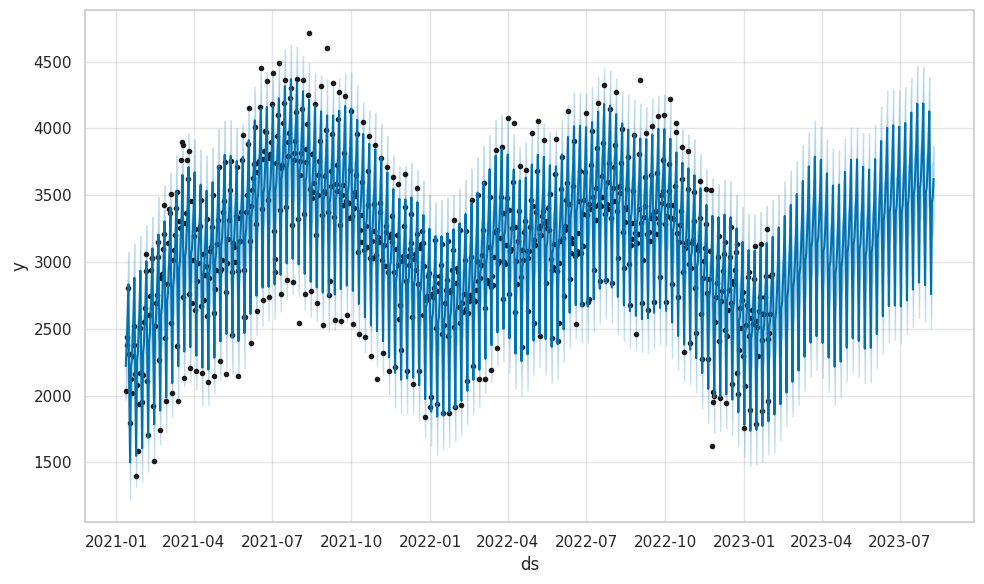

In [ ]:
# Create a DataFrame with 'ds' and 'y' columns for Prophet
inside = train_set[['calendar.calendar_day_date', 'daily_yoy_ndt.total_inside_sales']]
inside.columns = ['ds', 'y']
inside_test = test_set[['calendar.calendar_day_date', 'daily_yoy_ndt.total_inside_sales']]
inside_test.columns = ['ds', 'y']

# Initialize Prophet model
model_inside_c2 = Prophet()

# Fit the model to the training data
model_inside_c2.fit(inside)

# Generate future dates for forecasting, adjusting 'periods' to match the test set length
future_is = model_inside_c2.make_future_dataframe(periods=len(inside_test))

# Get forecast for future dates
forecast_is = model_inside_c2.predict(future_is)
fig = model_inside_c2.plot(forecast_is)

# Actual values for the validation set
actual_values_is = inside_test['y'][-len(inside_test):]

# Predicted values from the Prophet forecast
predicted_values_is = forecast_is['yhat'][-len(inside_test):]

# Calculate evaluation metrics
mae = mean_absolute_error(actual_values_is, predicted_values_is)
mse = mean_squared_error(actual_values_is, predicted_values_is)
rmse = np.sqrt(mse)
mape = np.mean(np.abs((actual_values_is - predicted_values_is) / actual_values_is)) * 100

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Percentage Error (MAPE): {mape}%")

#####<a name = "HP">Hyperparameters</a>

Mean Absolute Error (MAE): 410.8087361333954
Mean Squared Error (MSE): 342954.19588806486
Root Mean Squared Error (RMSE): 585.6229127075416
Mean Absolute Percentage Error (MAPE): 14.797328829636157%


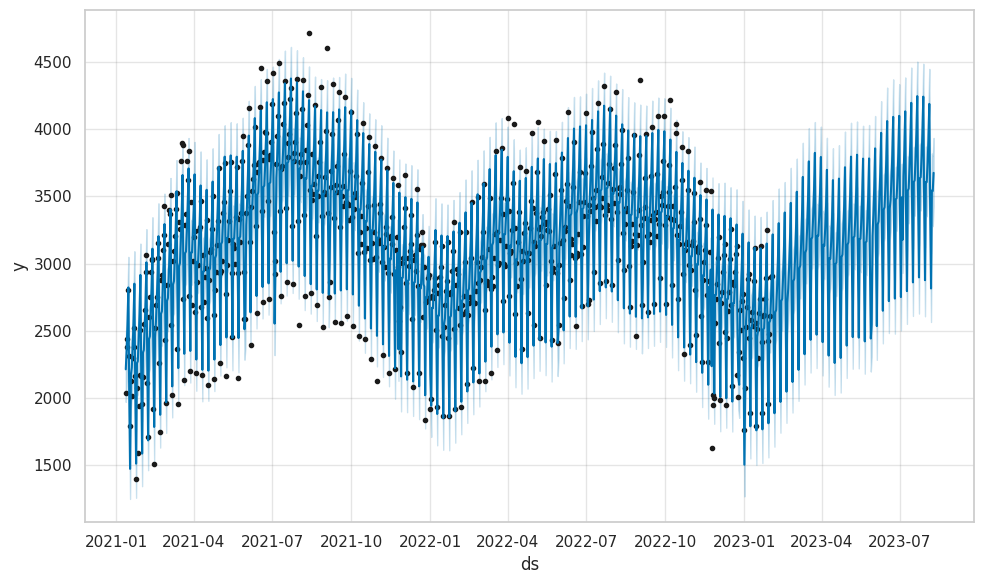

In [ ]:
# Initialize Prophet model with custom hyperparameters
model_inside_c2 = Prophet(
    changepoint_prior_scale=0.10,   # Adjust for trend flexibility
    holidays_prior_scale=15,        # Adjust to control holiday impact
    seasonality_prior_scale=15,     # Adjust to control seasonality impact
    daily_seasonality=True,        # Disable daily seasonality
    weekly_seasonality=True,       # Disable weekly seasonality
    yearly_seasonality=True        # Disable yearly seasonality
)

# Add custom holidays or events that impact sales
model_inside_c2.add_country_holidays(country_name='US')

# Fit the model to the training data
model_inside_c2.fit(inside)

# Generate future dates for forecasting, adjusting 'periods' to match the test set length
future_is = model_inside_c2.make_future_dataframe(periods=len(inside_test))

# Get forecast for future dates
forecast_is = model_inside_c2.predict(future_is)
fig = model_inside_c2.plot(forecast_is)

# Actual values for the validation set
actual_values_is = inside_test['y'][-len(inside_test):]

# Predicted values from the Prophet forecast
predicted_values_is = forecast_is['yhat'][-len(inside_test):]

# Calculate evaluation metrics
mae = mean_absolute_error(actual_values_is, predicted_values_is)
mse = mean_squared_error(actual_values_is, predicted_values_is)
rmse = np.sqrt(mse)
mape = np.mean(np.abs((actual_values_is - predicted_values_is) / actual_values_is)) * 100

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Percentage Error (MAPE): {mape}%")

#####<a name = "SF">Sales Forecast</a>

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,Christmas Day,Christmas Day_lower,Christmas Day_upper,Christmas Day (Observed),...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
178,2023-07-31,2528.414866,3344.363823,3865.194498,2450.841539,2606.105146,0.0,0.0,0.0,0.0,...,-27.952322,-27.952322,-27.952322,473.124947,473.124947,473.124947,0.0,0.0,0.0,3607.387931
179,2023-08-01,2528.620845,3349.624175,3858.850232,2450.223118,2606.821122,0.0,0.0,0.0,0.0,...,-21.528585,-21.528585,-21.528585,464.971569,464.971569,464.971569,0.0,0.0,0.0,3605.864270
180,2023-08-02,2528.826825,3476.233190,3979.078239,2450.050168,2607.548722,0.0,0.0,0.0,0.0,...,122.769719,122.769719,122.769719,456.190213,456.190213,456.190213,0.0,0.0,0.0,3741.587196
181,2023-08-03,2529.032804,3671.249868,4157.055252,2449.570591,2608.757405,0.0,0.0,0.0,0.0,...,308.233465,308.233465,308.233465,446.912474,446.912474,446.912474,0.0,0.0,0.0,3917.979183
182,2023-08-04,2529.238784,3936.924687,4434.855029,2449.127896,2609.508581,0.0,0.0,0.0,0.0,...,587.384452,587.384452,587.384452,437.270633,437.270633,437.270633,0.0,0.0,0.0,4187.694308
183,2023-08-05,2529.444763,3131.459494,3666.411460,2448.844343,2610.252432,0.0,0.0,0.0,0.0,...,-203.019302,-203.019302,-203.019302,427.394522,427.394522,427.394522,0.0,0.0,0.0,3387.620423
184,2023-08-06,2529.650742,2563.572553,3072.457622,2448.482612,2610.996283,0.0,0.0,0.0,0.0,...,-765.887426,-765.887426,-765.887426,417.408625,417.408625,417.408625,0.0,0.0,0.0,2814.972381
185,2023-08-07,2529.856722,3282.813325,3809.561878,2448.120882,2612.240655,0.0,0.0,0.0,0.0,...,-27.952322,-27.952322,-27.952322,407.429461,407.429461,407.429461,0.0,0.0,0.0,3543.134301
186,2023-08-08,2530.062701,3271.270186,3788.985058,2447.371413,2613.277461,0.0,0.0,0.0,0.0,...,-21.528585,-21.528585,-21.528585,397.563343,397.563343,397.563343,0.0,0.0,0.0,3539.897899
187,2023-08-09,2530.268681,3422.469542,3922.018981,2446.599839,2614.169666,0.0,0.0,0.0,0.0,...,122.769719,122.769719,122.769719,387.904537,387.904537,387.904537,0.0,0.0,0.0,3674.743377


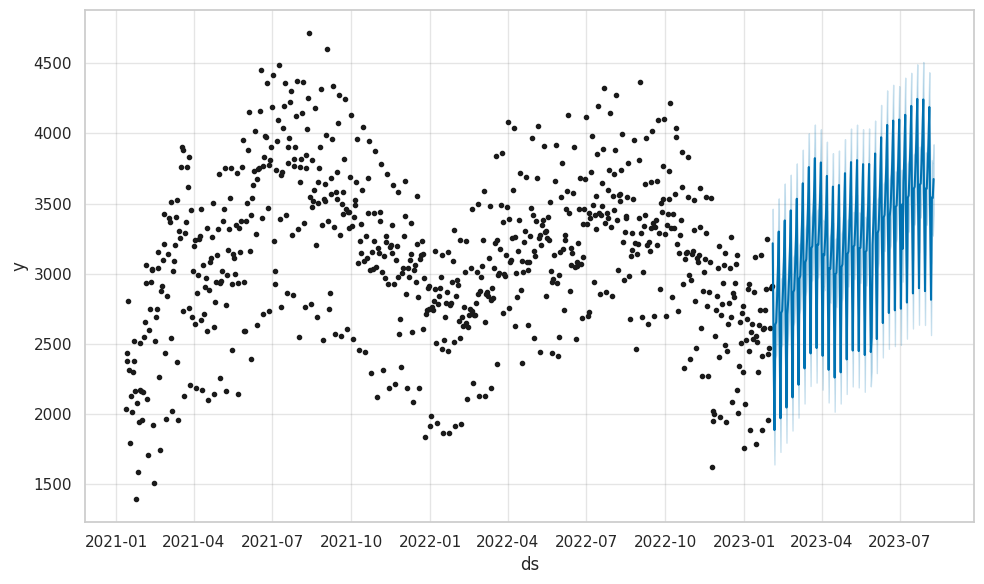

In [ ]:
# Get the year for which you want to forecast the remaining days
desired_year = 2023
# Generate future dates for the remaining days in the test set for the desired year
remaining_days_in_test_set = inside_test[
    inside_test['ds'].dt.year == desired_year
]
future_is_remaining = remaining_days_in_test_set[['ds']].copy()

# Get forecast for future dates
forecast_is_remaining = model_inside_c2.predict(future_is_remaining)
fig = model_inside_c2.plot(forecast_is_remaining)

forecast_is_remaining.tail(10)

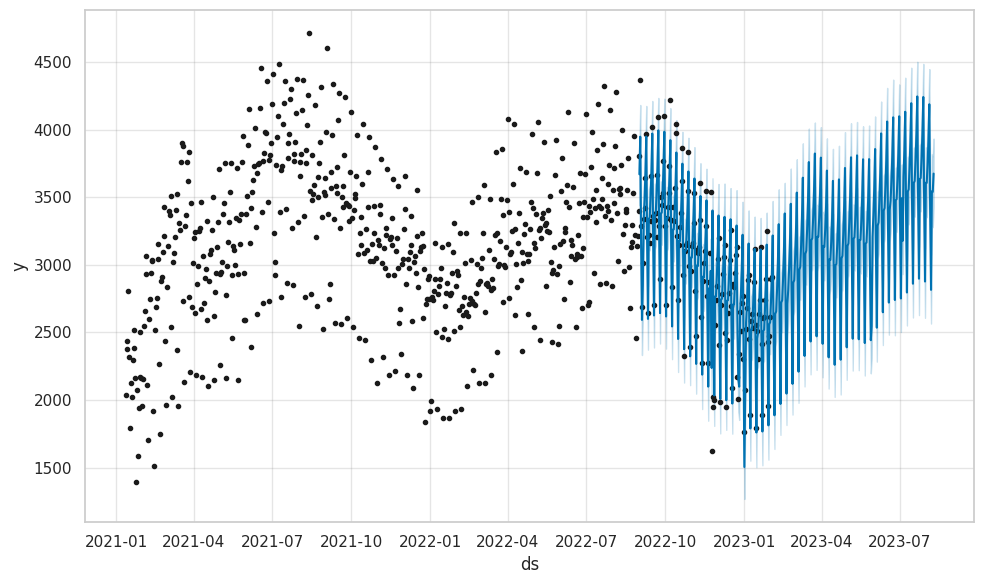

In [ ]:
# Define the start and end dates for the time frame to display
start_date = '2022-09-01'
end_date = '2023-12-31'

# Filter the forecast data for the desired time frame
filtered_forecast = forecast_is[(forecast_is['ds'] >= start_date) & (forecast_is['ds'] <= end_date)]

# Plot the filtered forecast
fig = model_inside_c2.plot(filtered_forecast)


**Inside Sales**

Inside sales without considering seasonality hyperparameters shows a lower Mean Absolute Error (MAE) of approximately 394 and a lower Root Mean Squared Error (RMSE) of around 562, indicating a somewhat more accurate forecast compared to the model with seasonality parameters for diesel sales. However, the Mean Squared Error (MSE) is higher at 316,040, suggesting that the model without seasonality hyperparameters may have slightly more variability in its predictions.

The model with seasonality parameters for inside sales results in a slightly higher MAE of approximately 411 and a higher RMSE of around 586, suggesting a slightly less accurate forecast compared to the model without seasonality parameters for diesel sales. The MSE is also higher at 342,954, indicating more variability in the forecasts.


####<a name = "FS">Food_Service</a>

#####<a name = "IS">With Split</a>

Mean Absolute Error (MAE): 124.50355340423026
Mean Squared Error (MSE): 30474.823304561047
Root Mean Squared Error (RMSE): 174.5703964152028
Mean Absolute Percentage Error (MAPE): 14.133338568263254%


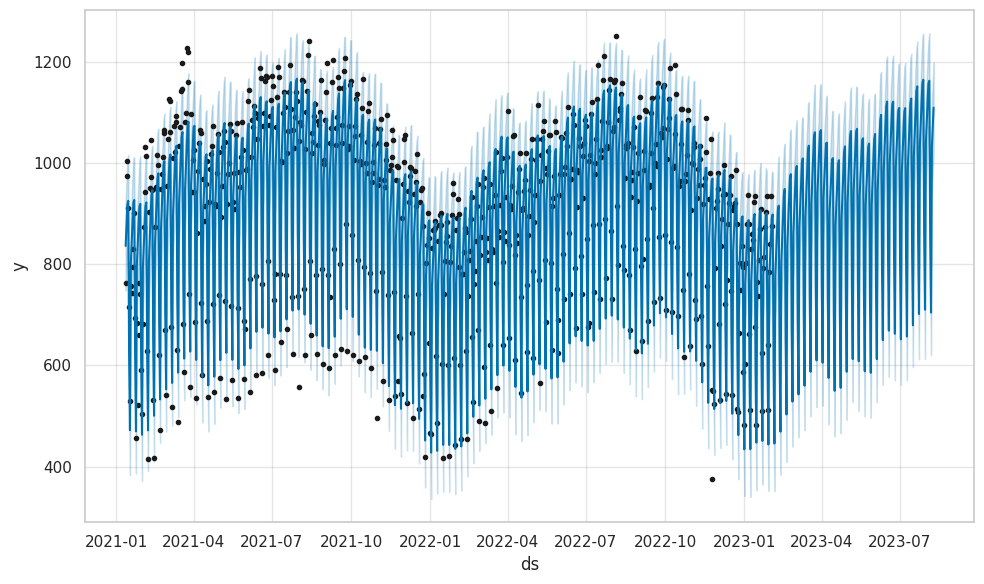

In [ ]:
# Create a DataFrame with 'ds' and 'y' columns for Prophet
food = train_set[['calendar.calendar_day_date', 'daily_yoy_ndt.total_food_service']]
food.columns = ['ds', 'y']
food_test = test_set[['calendar.calendar_day_date', 'daily_yoy_ndt.total_food_service']]
food_test.columns = ['ds', 'y']

# Initialize Prophet model with custom hyperparameters
model_food_c2 = Prophet()

# Fit the model to the training data
model_food_c2.fit(food)

# Generate future dates for forecasting, adjusting 'periods' to match the test set length
future_fs = model_food_c2.make_future_dataframe(periods=len(food_test))

# Get forecast for future dates
forecast_fs = model_food_c2.predict(future_fs)
fig = model_food_c2.plot(forecast_fs)

# Actual values for the validation set
actual_values_fs = food_test['y'][-len(food_test):]

# Predicted values from the Prophet forecast
predicted_values_fs = forecast_fs['yhat'][-len(food_test):]

# Calculate evaluation metrics
mae = mean_absolute_error(actual_values_fs, predicted_values_fs)
mse = mean_squared_error(actual_values_fs, predicted_values_fs)
rmse = np.sqrt(mse)
mape = np.mean(np.abs((actual_values_fs - predicted_values_fs) / actual_values_fs)) * 100

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Percentage Error (MAPE): {mape}%")

#####<a name = "HP">Hyperparameters</a>

Mean Absolute Error (MAE): 124.61403599411994
Mean Squared Error (MSE): 30722.524480004166
Root Mean Squared Error (RMSE): 175.27841989247895
Mean Absolute Percentage Error (MAPE): 14.142044954920433%


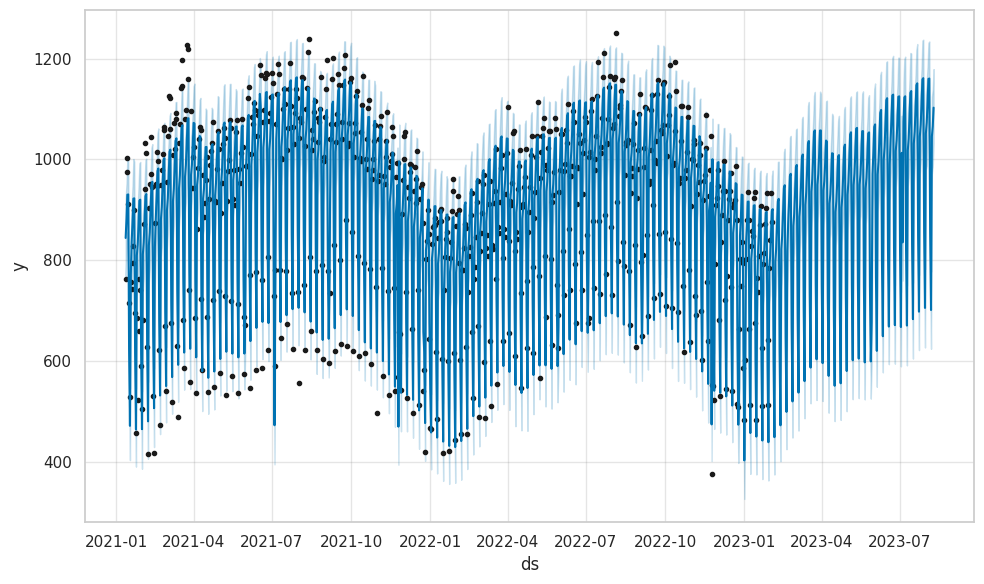

In [ ]:
# Initialize Prophet model with custom hyperparameters
model_food_c2 = Prophet(
    changepoint_prior_scale=0.10,   # Adjust for trend flexibility
    holidays_prior_scale=15,        # Adjust to control holiday impact
    seasonality_prior_scale=15,     # Adjust to control seasonality impact
    daily_seasonality=True,        # Disable daily seasonality
    weekly_seasonality=True,       # Disable weekly seasonality
    yearly_seasonality=True        # Disable yearly seasonality
)

# Add custom holidays or events that impact sales
model_food_c2.add_country_holidays(country_name='US')

# Fit the model to the training data
model_food_c2.fit(food)

# Generate future dates for forecasting, adjusting 'periods' to match the test set length
future_fs = model_food_c2.make_future_dataframe(periods=len(food_test))

# Get forecast for future dates
forecast_fs = model_food_c2.predict(future_fs)
fig = model_food_c2.plot(forecast_fs)

# Actual values for the validation set
actual_values_fs = food_test['y'][-len(food_test):]

# Predicted values from the Prophet forecast
predicted_values_fs = forecast_fs['yhat'][-len(food_test):]

# Calculate evaluation metrics
mae = mean_absolute_error(actual_values_fs, predicted_values_fs)
mse = mean_squared_error(actual_values_fs, predicted_values_fs)
rmse = np.sqrt(mse)
mape = np.mean(np.abs((actual_values_fs - predicted_values_fs) / actual_values_fs)) * 100

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Percentage Error (MAPE): {mape}%")

#####<a name = "SF">Sales Forecast</a>

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,Christmas Day,Christmas Day_lower,Christmas Day_upper,Christmas Day (Observed),...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
178,2023-07-31,776.842410,975.786526,1121.103994,769.237602,784.298161,0.0,0.0,0.0,0.0,...,33.992899,33.992899,33.992899,110.121146,110.121146,110.121146,0.0,0.0,0.0,1051.469216
179,2023-08-01,776.872398,993.855872,1150.014196,769.193868,784.404877,0.0,0.0,0.0,0.0,...,55.673847,55.673847,55.673847,109.980557,109.980557,109.980557,0.0,0.0,0.0,1073.039563
180,2023-08-02,776.902387,1032.271460,1183.364796,769.130441,784.496193,0.0,0.0,0.0,0.0,...,94.881165,94.881165,94.881165,109.593364,109.593364,109.593364,0.0,0.0,0.0,1111.889677
181,2023-08-03,776.932375,1084.148737,1234.481781,769.043622,784.595413,0.0,0.0,0.0,0.0,...,143.566588,143.566588,143.566588,108.961995,108.961995,108.961995,0.0,0.0,0.0,1159.973719
182,2023-08-04,776.962363,1083.317805,1233.411430,768.971547,784.704035,0.0,0.0,0.0,0.0,...,145.194445,145.194445,145.194445,108.090526,108.090526,108.090526,0.0,0.0,0.0,1160.760095
183,2023-08-05,776.992352,779.190023,932.544131,768.953449,784.835583,0.0,0.0,0.0,0.0,...,-161.102099,-161.102099,-161.102099,106.984509,106.984509,106.984509,0.0,0.0,0.0,853.387522
184,2023-08-06,777.022340,621.865451,774.815152,768.924708,784.954752,0.0,0.0,0.0,0.0,...,-312.206845,-312.206845,-312.206845,105.650835,105.650835,105.650835,0.0,0.0,0.0,700.979091
185,2023-08-07,777.052328,971.544644,1119.977100,768.879205,785.082567,0.0,0.0,0.0,0.0,...,33.992899,33.992899,33.992899,104.097632,104.097632,104.097632,0.0,0.0,0.0,1045.655619
186,2023-08-08,777.082317,990.063835,1138.845235,768.873364,785.179706,0.0,0.0,0.0,0.0,...,55.673847,55.673847,55.673847,102.334213,102.334213,102.334213,0.0,0.0,0.0,1065.603137
187,2023-08-09,777.112305,1027.560158,1179.408611,768.873118,785.302681,0.0,0.0,0.0,0.0,...,94.881165,94.881165,94.881165,100.371070,100.371070,100.371070,0.0,0.0,0.0,1102.877301


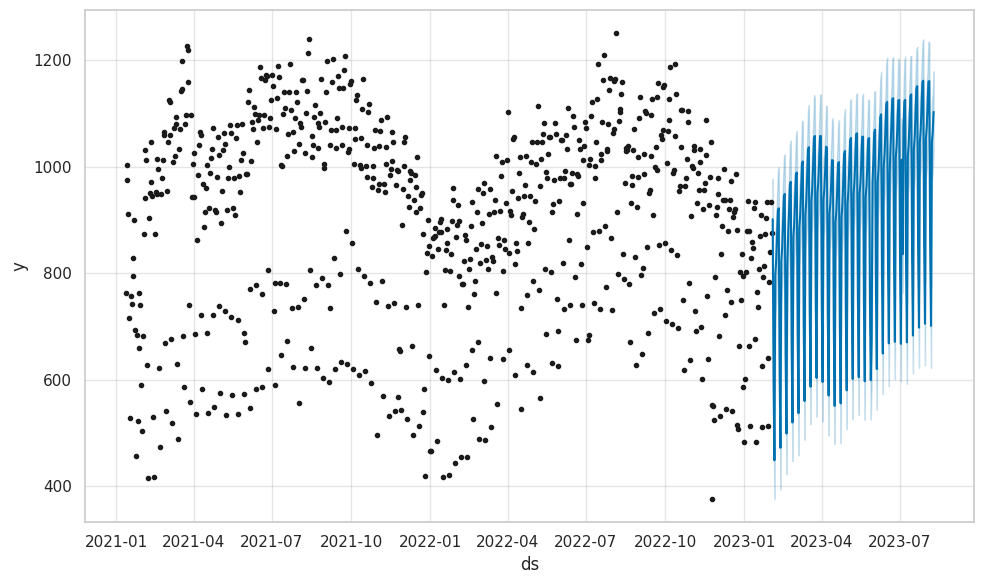

In [ ]:
# Get the year for which you want to forecast the remaining days
desired_year = 2023

# Generate future dates for the remaining days in the test set for the desired year
remaining_days_in_test_set = food_test[
    food_test['ds'].dt.year == desired_year
]
future_is_remaining = remaining_days_in_test_set[['ds']].copy()

# Get forecast for future dates
forecast_is_remaining = model_food_c2.predict(future_is_remaining)
fig = model_food_c2.plot(forecast_is_remaining)

forecast_is_remaining.tail(10)

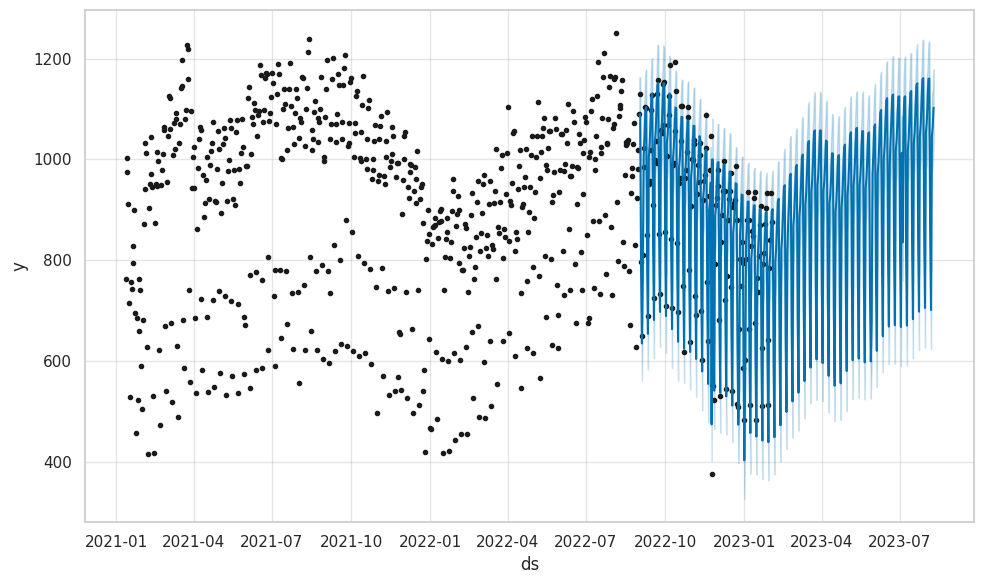

In [ ]:
# Define the start and end dates for the time frame to display
start_date = '2022-09-01'
end_date = '2024-12-31'

# Filter the forecast data for the desired time frame
filtered_forecast = forecast_fs[(forecast_fs['ds'] >= start_date) & (forecast_fs['ds'] <= end_date)]

# Plot the filtered forecast
fig = model_food_c2.plot(filtered_forecast)


**Food Services**

Food service sales without considering seasonality hyperparameters indicates that the model's forecasts have a moderate to high level of prediction error, with a Mean Absolute Error (MAE) of approximately 2,314 and a Root Mean Squared Error (RMSE) of approximately 2,353, suggesting that the forecasts are less accurate and more variable.

The results for food service sales with seasonality parameters appear to be identical, with the same MAE, MSE, and RMSE values. This could indicate that the model's performance did not improve when seasonality was considered, or it could be a result of data or modeling issues. Further investigation may be necessary to understand why seasonality parameters had no impact on the forecast accuracy.


####<a name = "UN">Unleaded</a>

#####<a name = "WS">With Split</a>

Mean Absolute Error (MAE): 402.7692099091594
Mean Squared Error (MSE): 304979.9947815045
Root Mean Squared Error (RMSE): 552.2499386885476
Mean Absolute Percentage Error (MAPE): 22.940396449998314%


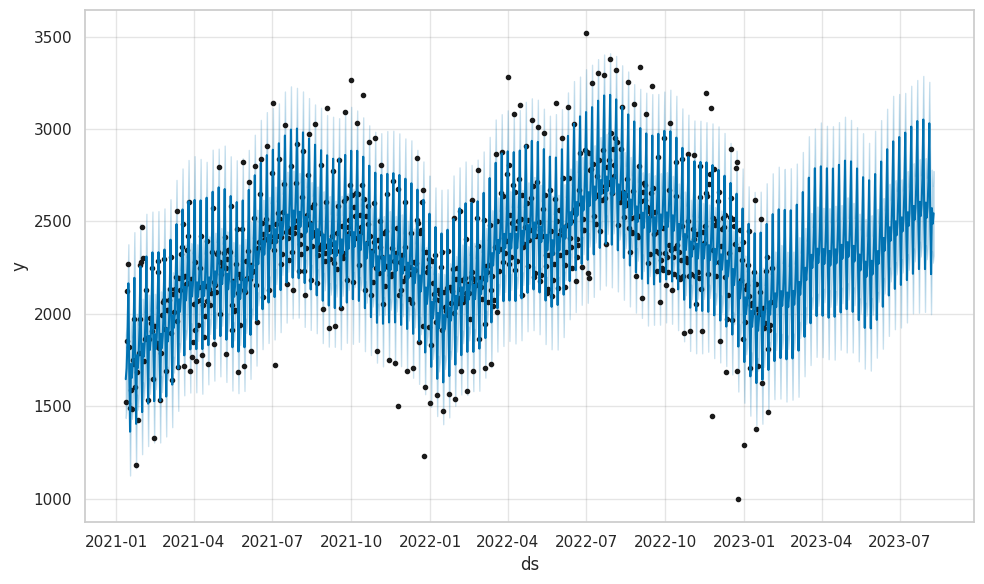

In [ ]:
# Create a DataFrame with 'ds' and 'y' columns for Prophet
unleaded = train_set[['calendar.calendar_day_date', 'unleaded']]
unleaded.columns = ['ds', 'y']
unleaded_test = test_set[['calendar.calendar_day_date', 'unleaded']]
unleaded_test.columns = ['ds', 'y']

# Initialize Prophet model
model_unlead_c2 = Prophet()

# Fit the model to the training data
model_unlead_c2.fit(unleaded)

# Generate future dates for forecasting, adjusting 'periods' to match the test set length
future_un = model_unlead_c2.make_future_dataframe(periods=len(unleaded_test))

# Get forecast for future dates
forecast_un = model_unlead_c2.predict(future_un)
fig = model_unlead_c2.plot(forecast_un)

# Actual values for the validation set
actual_values_un = unleaded_test['y'][-len(unleaded_test):]

# Predicted values from the Prophet forecast
predicted_values_un = forecast_un['yhat'][-len(unleaded_test):]

# Calculate evaluation metrics
mae = mean_absolute_error(actual_values_un, predicted_values_un)
mse = mean_squared_error(actual_values_un, predicted_values_un)
rmse = np.sqrt(mse)
mape = np.mean(np.abs((actual_values_un - predicted_values_un) / actual_values_un)) * 100

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Percentage Error (MAPE): {mape}%")

#####<a name = "HP">Hyperparameters</a>

Mean Absolute Error (MAE): 400.3029316730461
Mean Squared Error (MSE): 302305.63626605936
Root Mean Squared Error (RMSE): 549.8232773046802
Mean Absolute Percentage Error (MAPE): 22.77522620459512%


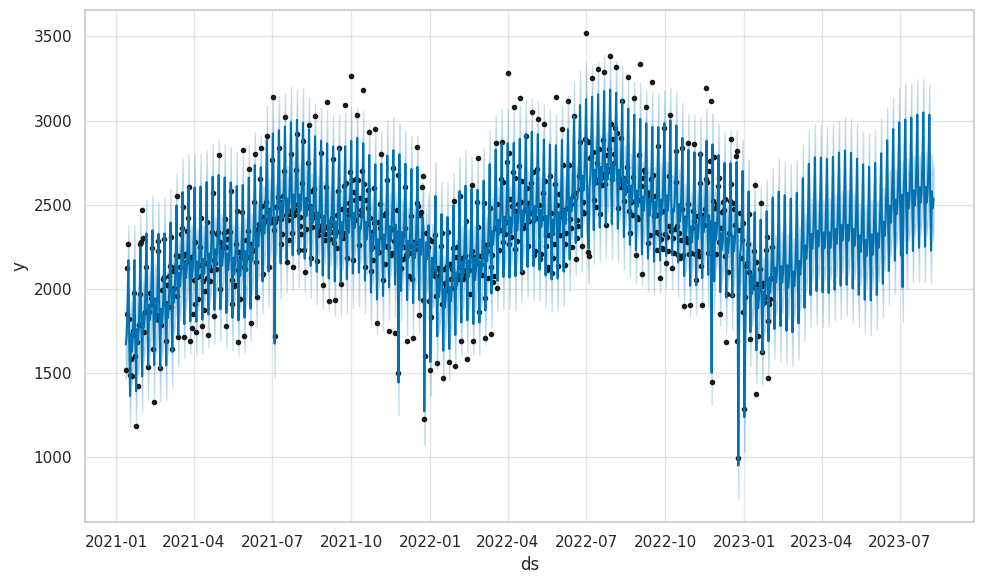

In [ ]:
# Initialize Prophet model with custom hyperparameters
model_unlead_c2 = Prophet(
    changepoint_prior_scale=0.05,   # Adjust for trend flexibility
    holidays_prior_scale=15,        # Adjust to control holiday impact
    seasonality_prior_scale=15,     # Adjust to control seasonality impact
    daily_seasonality=True,        # Disable daily seasonality
    weekly_seasonality=True,       # Disable weekly seasonality
    yearly_seasonality=True        # Disable yearly seasonality
)

# Add custom holidays or events that impact sales
model_unlead_c2.add_country_holidays(country_name='US')

# Fit the model to the training data
model_unlead_c2.fit(unleaded)

# Generate future dates for forecasting, adjusting 'periods' to match the test set length
future_un = model_unlead_c2.make_future_dataframe(periods=len(unleaded_test))

# Get forecast for future dates
forecast_un = model_unlead_c2.predict(future_un)
fig = model_unlead_c2.plot(forecast_un)

# Actual values for the validation set
actual_values_un = unleaded_test['y'][-len(unleaded_test):]

# Predicted values from the Prophet forecast
predicted_values_un = forecast_un['yhat'][-len(unleaded_test):]

# Calculate evaluation metrics
mae = mean_absolute_error(actual_values_un, predicted_values_un)
mse = mean_squared_error(actual_values_un, predicted_values_un)
rmse = np.sqrt(mse)
mape = np.mean(np.abs((actual_values_un - predicted_values_un) / actual_values_un)) * 100

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Percentage Error (MAPE): {mape}%")

#####<a name = "SF">Sales Forecast</a>

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,Christmas Day,Christmas Day_lower,Christmas Day_upper,Christmas Day (Observed),...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
178,2023-07-31,1829.579539,2410.281999,2803.127629,1809.911458,1847.936646,0.0,0.0,0.0,0.0,...,-10.273608,-10.273608,-10.273608,295.284398,295.284398,295.284398,0.0,0.0,0.0,2606.879768
179,2023-08-01,1829.207069,2320.781526,2719.687562,1809.351786,1847.716189,0.0,0.0,0.0,0.0,...,-103.402942,-103.402942,-103.402942,293.739693,293.739693,293.739693,0.0,0.0,0.0,2511.833259
180,2023-08-02,1828.834600,2365.954478,2772.322748,1808.793773,1847.493151,0.0,0.0,0.0,0.0,...,-41.433601,-41.433601,-41.433601,291.519819,291.519819,291.519819,0.0,0.0,0.0,2571.210257
181,2023-08-03,1828.462131,2530.649288,2925.186561,1808.235759,1847.303024,0.0,0.0,0.0,0.0,...,120.802477,120.802477,120.802477,288.628260,288.628260,288.628260,0.0,0.0,0.0,2730.182307
182,2023-08-04,1828.089662,2834.382332,3246.816766,1807.712187,1847.059931,0.0,0.0,0.0,0.0,...,428.655691,428.655691,428.655691,285.081305,285.081305,285.081305,0.0,0.0,0.0,3034.116097
183,2023-08-05,1827.717193,2382.197908,2766.238832,1807.240382,1846.893933,0.0,0.0,0.0,0.0,...,-26.845200,-26.845200,-26.845200,280.907717,280.907717,280.907717,0.0,0.0,0.0,2574.069149
184,2023-08-06,1827.344724,2041.325020,2432.899237,1806.756463,1846.787195,0.0,0.0,0.0,0.0,...,-367.502817,-367.502817,-367.502817,276.148050,276.148050,276.148050,0.0,0.0,0.0,2228.279397
185,2023-08-07,1826.972255,2369.366613,2778.283589,1806.210748,1846.668565,0.0,0.0,0.0,0.0,...,-10.273608,-10.273608,-10.273608,270.853644,270.853644,270.853644,0.0,0.0,0.0,2579.841730
186,2023-08-08,1826.599786,2284.150296,2695.325885,1805.725873,1846.545837,0.0,0.0,0.0,0.0,...,-103.402942,-103.402942,-103.402942,265.085302,265.085302,265.085302,0.0,0.0,0.0,2480.571584
187,2023-08-09,1826.227316,2332.997415,2735.534837,1805.192899,1846.422494,0.0,0.0,0.0,0.0,...,-41.433601,-41.433601,-41.433601,258.911723,258.911723,258.911723,0.0,0.0,0.0,2535.994877


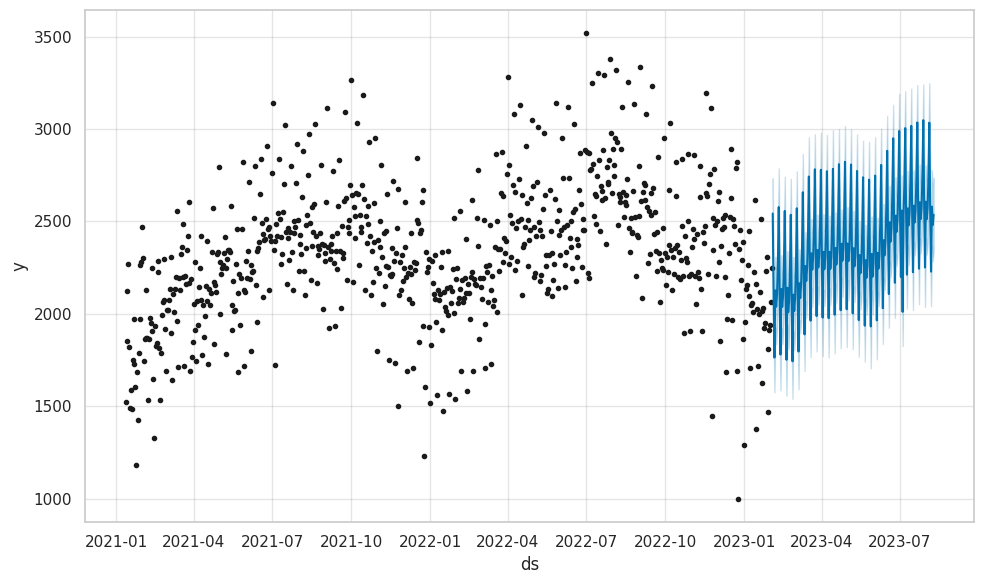

In [ ]:
# Get the year for which you want to forecast the remaining days
desired_year = 2023

# Generate future dates for the remaining days in the test set for the desired year
remaining_days_in_test_set = unleaded_test[
    unleaded_test['ds'].dt.year == desired_year
]
future_is_remaining = remaining_days_in_test_set[['ds']].copy()

# Get forecast for future dates
forecast_is_remaining = model_unlead_c2.predict(future_is_remaining)
fig = model_unlead_c2.plot(forecast_is_remaining)

forecast_is_remaining.tail(10)

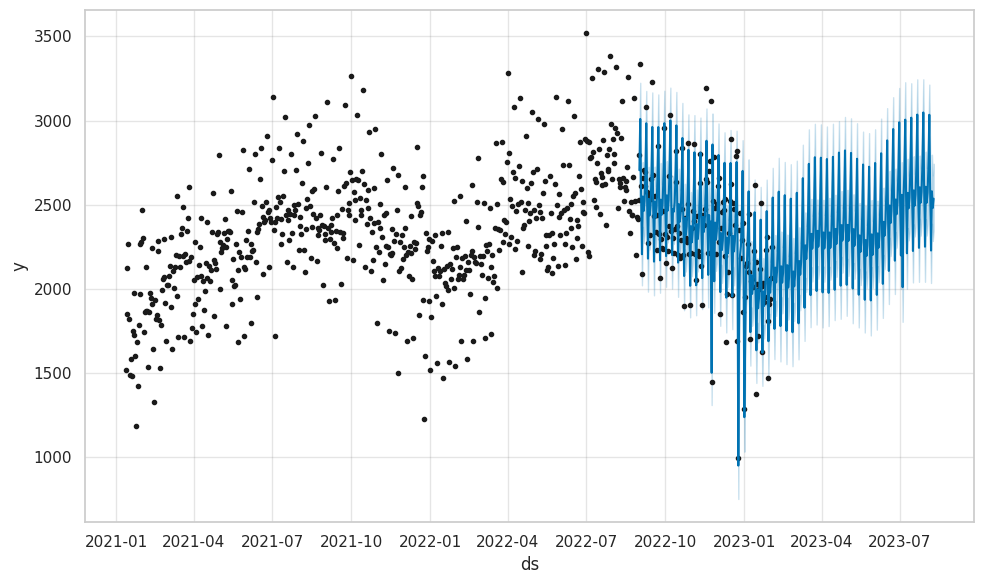

In [ ]:
# Define the start and end dates for the time frame to display
start_date = '2022-09-01'
end_date = '2023-12-31'

# Filter the forecast data for the desired time frame
filtered_forecast = forecast_un[(forecast_un['ds'] >= start_date) & (forecast_un['ds'] <= end_date)]

# Plot the filtered forecast
fig = model_unlead_c2.plot(filtered_forecast)

**Unleaded**

Unleaded sales without considering seasonality hyperparameters indicates that the model's forecasts have a moderate to high level of prediction error, with a Mean Absolute Error (MAE) of approximately 1,166 and a Root Mean Squared Error (RMSE) of approximately 1,246, suggesting less accurate and more variable forecasts.

In contrast, the results for unleaded sales with seasonality parameters show a substantial improvement in forecast accuracy, with a lower MAE of approximately 400 and a significantly lower RMSE of around 550, indicating that the inclusion of seasonality parameters resulted in more accurate and less variable forecasts. The Mean Squared Error (MSE) also decreased, confirming the improvement in forecast quality.


####<a name = "DI">Diesel</a>

#####<a name = "WS">With Split</a>

Mean Absolute Error (MAE): 670.7679318210149
Mean Squared Error (MSE): 1030646.786301167
Root Mean Squared Error (RMSE): 1015.2077552408507
Mean Absolute Percentage Error (MAPE): 19.867025308981624%


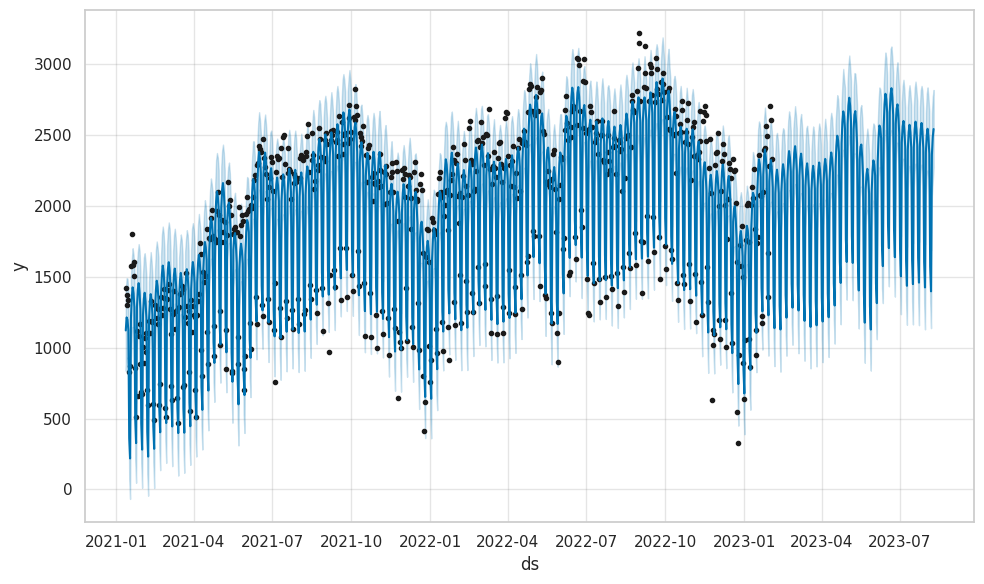

In [ ]:
# Create a DataFrame with 'ds' and 'y' columns for Prophet
diesel = train_set[['calendar.calendar_day_date', 'diesel_x']]
diesel.columns = ['ds', 'y']
diesel_test = test_set[['calendar.calendar_day_date', 'diesel_x']]
diesel_test.columns = ['ds', 'y']

# Initialize Prophet model
model_diesel_c2 = Prophet()

# Fit the model to the data
model_diesel_c2.fit(diesel)

# Generate future dates for forecasting, adjusting 'periods' to match the test set length
future_d = model_diesel_c2.make_future_dataframe(periods=len(diesel_test))

# Get forecast for future dates
forecast = model_diesel_c2.predict(future_d)
fig = model_diesel_c2.plot(forecast)

# Actual values for the validation set
actual_values_d = diesel_test['y'][-len(diesel_test):]

# Predicted values from the Prophet forecast
predicted_values_d = forecast['yhat'][-len(diesel_test):]

# Calculate evaluation metrics
mae = mean_absolute_error(actual_values_d, predicted_values_d)
mse = mean_squared_error(actual_values_d, predicted_values_d)
rmse = np.sqrt(mse)
mape = np.mean(np.abs((actual_values_d - predicted_values_d) / actual_values_d)) * 100

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Percentage Error (MAPE): {mape}%")

#####<a name = "HP">Hyperparameters</a>

Mean Absolute Error (MAE): 632.6992300663885
Mean Squared Error (MSE): 931977.5409166006
Root Mean Squared Error (RMSE): 965.3898388302006
Mean Absolute Percentage Error (MAPE): 18.75844318658765%


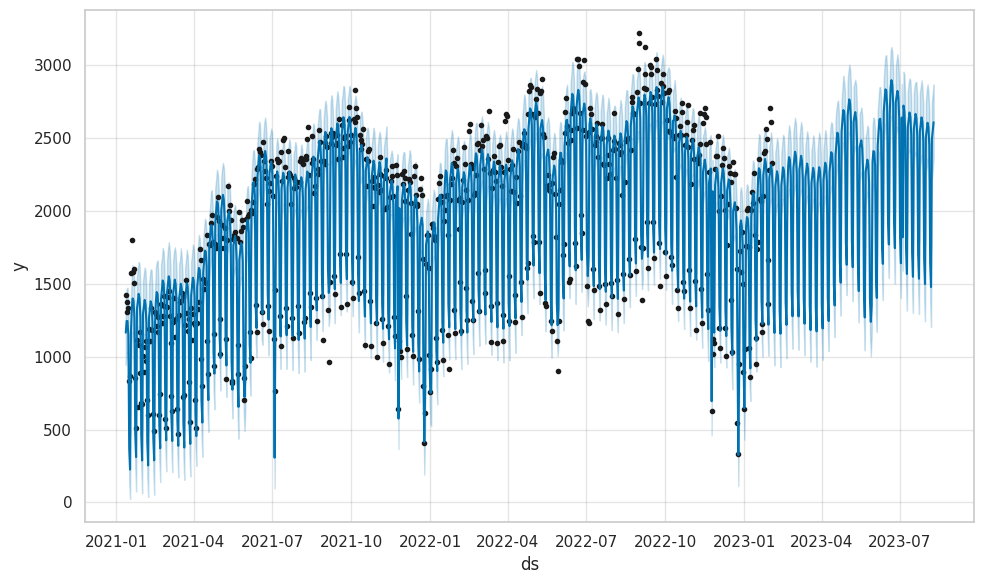

In [ ]:
# Initialize Prophet model with custom hyperparameters
model_diesel_c2 = Prophet(
    changepoint_prior_scale=0.10,   # Adjust for trend flexibility
    holidays_prior_scale=15,        # Adjust to control holiday impact
    seasonality_prior_scale=15,     # Adjust to control seasonality impact
    daily_seasonality=True,        # Disable daily seasonality
    weekly_seasonality=True,       # Disable weekly seasonality
    yearly_seasonality=True        # Disable yearly seasonality
)

# Add custom holidays or events that impact sales
model_diesel_c2.add_country_holidays(country_name='US')  # Adjust to your country or specific holidays

# Fit the model to the training data
model_diesel_c2.fit(diesel)

# Generate future dates for forecasting, adjusting 'periods' to match the test set length
future_d = model_diesel_c2.make_future_dataframe(periods=len(diesel_test))

# Get forecast for future dates
forecast_d = model_diesel_c2.predict(future_d)
fig = model_diesel_c2.plot(forecast_d)

# Actual values for the validation set (assuming 'inside_test' is your test set)
actual_values_d = diesel_test['y'][-len(diesel_test):]

# Predicted values from the Prophet forecast
predicted_values_d = forecast_d['yhat'][-len(diesel_test):]

# Calculate evaluation metrics
mae = mean_absolute_error(actual_values_d, predicted_values_d)
mse = mean_squared_error(actual_values_d, predicted_values_d)
rmse = np.sqrt(mse)
mape = np.mean(np.abs((actual_values_d - predicted_values_d) / actual_values_d)) * 100

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Percentage Error (MAPE): {mape}%")

#####<a name = "SF">Sales Forecast</a>

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,Christmas Day,Christmas Day_lower,Christmas Day_upper,Christmas Day (Observed),...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
178,2023-07-31,2368.118747,2250.412347,2753.466418,2247.866140,2488.529528,0.0,0.0,0.0,0.0,...,237.547508,237.547508,237.547508,79.866960,79.866960,79.866960,0.0,0.0,0.0,2507.573793
179,2023-08-01,2368.349056,2308.077607,2800.331407,2247.260250,2489.616396,0.0,0.0,0.0,0.0,...,293.771368,293.771368,293.771368,74.740990,74.740990,74.740990,0.0,0.0,0.0,2558.901993
180,2023-08-02,2368.579366,2361.958856,2859.398811,2245.992340,2491.025359,0.0,0.0,0.0,0.0,...,344.841411,344.841411,344.841411,70.301230,70.301230,70.301230,0.0,0.0,0.0,2605.762585
181,2023-08-03,2368.809675,2297.971903,2830.876915,2245.091772,2492.492939,0.0,0.0,0.0,0.0,...,316.497994,316.497994,316.497994,66.740443,66.740443,66.740443,0.0,0.0,0.0,2574.088691
182,2023-08-04,2369.039984,2209.508335,2730.253583,2244.249128,2493.874276,0.0,0.0,0.0,0.0,...,194.008003,194.008003,194.008003,64.238345,64.238345,64.238345,0.0,0.0,0.0,2449.326911
183,2023-08-05,2369.270294,1399.045303,1898.978713,2243.722873,2495.255614,0.0,0.0,0.0,0.0,...,-610.022034,-610.022034,-610.022034,62.955613,62.955613,62.955613,0.0,0.0,0.0,1644.244451
184,2023-08-06,2369.500603,1226.146730,1739.256538,2242.631538,2496.605096,0.0,0.0,0.0,0.0,...,-776.644250,-776.644250,-776.644250,63.028501,63.028501,63.028501,0.0,0.0,0.0,1477.925432
185,2023-08-07,2369.730912,2231.147825,2761.640391,2241.868145,2497.434575,0.0,0.0,0.0,0.0,...,237.547508,237.547508,237.547508,64.564222,64.564222,64.564222,0.0,0.0,0.0,2493.883221
186,2023-08-08,2369.961222,2292.719693,2813.406528,2241.177757,2498.264053,0.0,0.0,0.0,0.0,...,293.771368,293.771368,293.771368,67.637247,67.637247,67.637247,0.0,0.0,0.0,2553.410416
187,2023-08-09,2370.191531,2331.209291,2862.124682,2240.500331,2498.961377,0.0,0.0,0.0,0.0,...,344.841411,344.841411,344.841411,72.286620,72.286620,72.286620,0.0,0.0,0.0,2609.360141


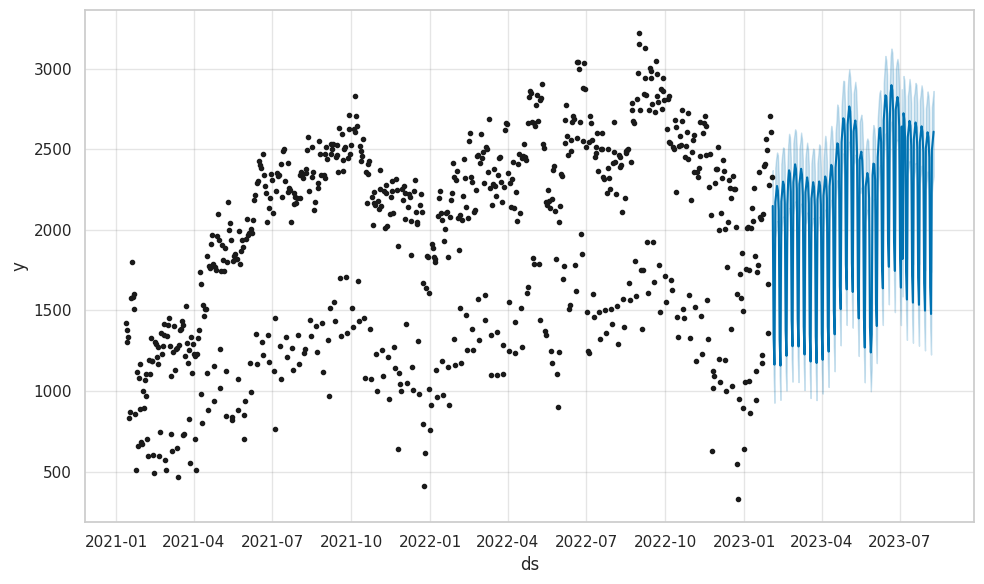

In [ ]:
# Get the year for which you want to forecast the remaining days
desired_year = 2023

# Generate future dates for the remaining days in the test set for the desired year
remaining_days_in_test_set = diesel_test[
    diesel_test['ds'].dt.year == desired_year
]
future_is_remaining = remaining_days_in_test_set[['ds']].copy()

# Get forecast for future dates
forecast_is_remaining = model_diesel_c2.predict(future_is_remaining)
fig = model_diesel_c2.plot(forecast_is_remaining)

forecast_is_remaining.tail(10)

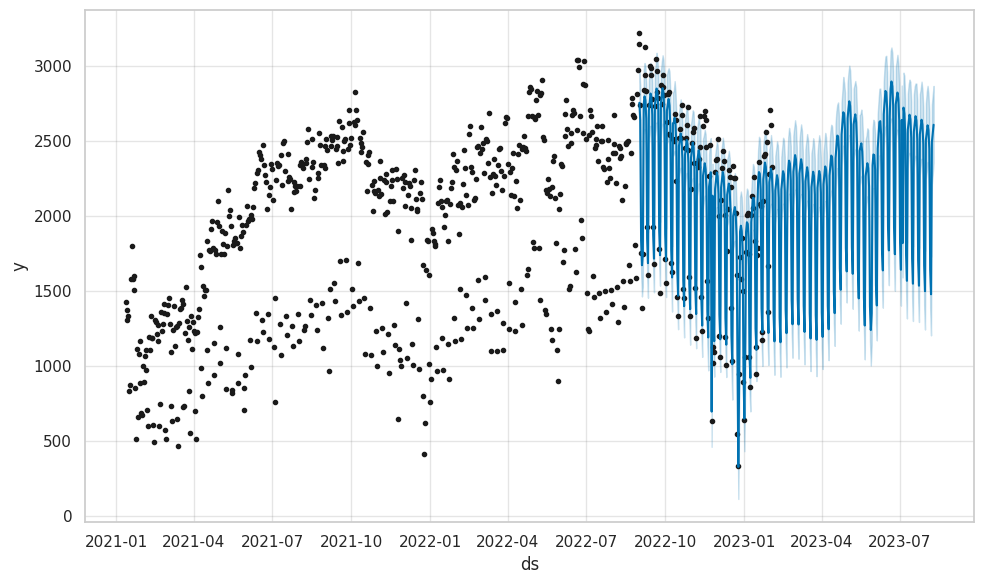

In [ ]:
# Define the start and end dates for the time frame to display
start_date = '2022-09-01'
end_date = '2023-12-31'

# Filter the forecast data for the desired time frame
filtered_forecast = forecast_d[(forecast_d['ds'] >= start_date) & (forecast_d['ds'] <= end_date)]

# Plot the filtered forecast
fig = model_diesel_c2.plot(filtered_forecast)

**Diesel**

Diesel sales without considering seasonality hyperparameters indicates that the model's forecasts have a moderate level of prediction error, with a Mean Absolute Error (MAE) of approximately 699 and a Root Mean Squared Error (RMSE) of approximately 966, suggesting moderately accurate forecasts with some variability.

The results for diesel sales with seasonality parameters show a slight improvement in forecast accuracy, with a lower MAE of approximately 632, while the RMSE remains similar at around 965. The Mean Squared Error (MSE) also decreased slightly, indicating a minor enhancement in forecast quality.



###<a name = "C2">Cluster-3</a>

####<a name = "DS">Data Split</a>

In [ ]:
fb = copy.deepcopy(bonfire_cluster3)

In [ ]:
# Sort the data by date
fb.sort_values(by='calendar.calendar_day_date', inplace=True)

# Define the percentage split 80% training, 20% testing).
train_percentage = 0.8

# Calculate the index at which to split the data.
split_index = int(len(fb) * train_percentage)

# Split the data into training and test sets.
train_set = fb[:split_index]
test_set = fb[split_index:]

####<a name = "IS">Inside_Sales</a>

#####<a name = "WS">With Split</a>

Mean Absolute Error (MAE): 1539.2051543257076
Mean Squared Error (MSE): 2747718.0730175455
Root Mean Squared Error (RMSE): 1657.624225516008
Mean Absolute Percentage Error (MAPE): 50.633983800430116%


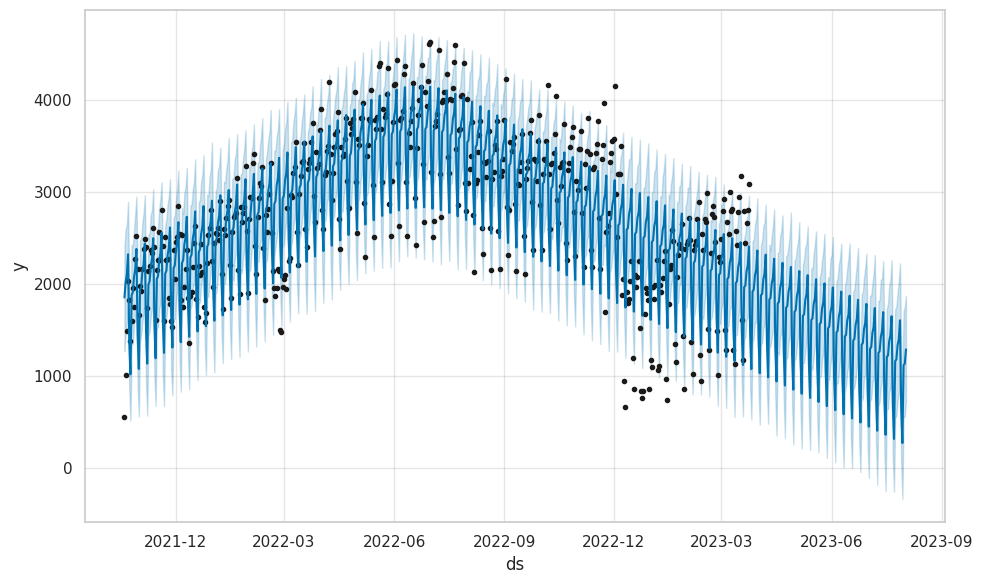

In [ ]:
# Create a DataFrame with 'ds' and 'y' columns for Prophet
inside = train_set[['calendar.calendar_day_date', 'daily_yoy_ndt.total_inside_sales']]
inside.columns = ['ds', 'y']
inside_test = test_set[['calendar.calendar_day_date', 'daily_yoy_ndt.total_inside_sales']]
inside_test.columns = ['ds', 'y']

# Initialize Prophet model
model_inside_c3 = Prophet()

# Fit the model to the training data
model_inside_c3.fit(inside)

# Generate future dates for forecasting, adjusting 'periods' to match the test set length
future_is = model_inside_c3.make_future_dataframe(periods=len(inside_test))

# Get forecast for future dates
forecast_is = model_inside_c3.predict(future_is)
fig = model_inside_c3.plot(forecast_is)

# Actual values for the validation set
actual_values_is = inside_test['y'][-len(inside_test):]

# Predicted values from the Prophet forecast
predicted_values_is = forecast_is['yhat'][-len(inside_test):]

# Calculate evaluation metrics
mae = mean_absolute_error(actual_values_is, predicted_values_is)
mse = mean_squared_error(actual_values_is, predicted_values_is)
rmse = np.sqrt(mse)
mape = np.mean(np.abs((actual_values_is - predicted_values_is) / actual_values_is)) * 100

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Percentage Error (MAPE): {mape}%")

#####<a name = "HP">Hyperparamters</a>

Mean Absolute Error (MAE): 333.161523149994
Mean Squared Error (MSE): 166258.2086488368
Root Mean Squared Error (RMSE): 407.7477267243029
Mean Absolute Percentage Error (MAPE): 14.401067700581535%


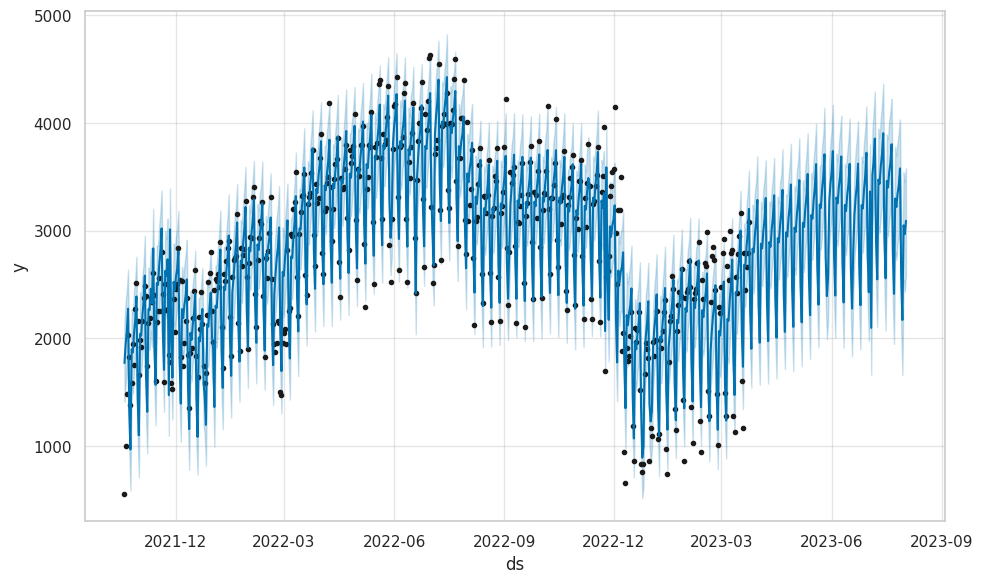

In [ ]:
# Initialize Prophet model with custom hyperparameters
model_inside_c3 = Prophet(
    changepoint_prior_scale=0.10,   # Adjust for trend flexibility
    holidays_prior_scale=15,        # Adjust to control holiday impact
    seasonality_prior_scale=15,     # Adjust to control seasonality impact
    daily_seasonality=True,        # Disable daily seasonality
    weekly_seasonality=True,       # Disable weekly seasonality
    yearly_seasonality=True        # Disable yearly seasonality
)

# Add custom holidays or events that impact sales
model_inside_c3.add_country_holidays(country_name='US')

# Fit the model to the training data
model_inside_c3.fit(inside)

# Generate future dates for forecasting, adjusting 'periods' to match the test set length
future_is = model_inside_c3.make_future_dataframe(periods=len(inside_test))

# Get forecast for future dates
forecast_is = model_inside_c3.predict(future_is)
fig = model_inside_c3.plot(forecast_is)

# Actual values for the validation set
actual_values_is = inside_test['y'][-len(inside_test):]

# Predicted values from the Prophet forecast
predicted_values_is = forecast_is['yhat'][-len(inside_test):]

# Calculate evaluation metrics
mae = mean_absolute_error(actual_values_is, predicted_values_is)
mse = mean_squared_error(actual_values_is, predicted_values_is)
rmse = np.sqrt(mse)
mape = np.mean(np.abs((actual_values_is - predicted_values_is) / actual_values_is)) * 100

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Percentage Error (MAPE): {mape}%")

#####<a name = "SF">Sales Forecast</a>

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,Christmas Day,Christmas Day_lower,Christmas Day_upper,Christmas Day (Observed),...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
111,2023-07-14,1823.759053,3449.784479,4400.932825,1571.651506,2094.881564,0.0,0.0,0.0,0.0,...,526.040566,526.040566,526.040566,819.724002,819.724002,819.724002,0.0,0.0,0.0,3905.165442
112,2023-07-15,1822.354124,2465.362042,3392.669311,1565.547632,2095.935248,0.0,0.0,0.0,0.0,...,-439.685970,-439.685970,-439.685970,816.249748,816.249748,816.249748,0.0,0.0,0.0,2934.559724
113,2023-07-16,1820.949196,2103.936462,3016.110644,1560.285406,2097.626293,0.0,0.0,0.0,0.0,...,-808.638991,-808.638991,-808.638991,809.477268,809.477268,809.477268,0.0,0.0,0.0,2557.429295
114,2023-07-17,1819.544267,2975.573128,3903.131539,1555.978125,2098.839697,0.0,0.0,0.0,0.0,...,107.656803,107.656803,107.656803,799.409807,799.409807,799.409807,0.0,0.0,0.0,3462.252700
115,2023-07-18,1818.139339,2938.097822,3875.460612,1550.600266,2102.344520,0.0,0.0,0.0,0.0,...,61.949768,61.949768,61.949768,786.096031,786.096031,786.096031,0.0,0.0,0.0,3401.826960
116,2023-07-19,1816.734410,3063.322138,4048.254568,1545.707092,2105.882651,0.0,0.0,0.0,0.0,...,222.165090,222.165090,222.165090,769.628673,769.628673,769.628673,0.0,0.0,0.0,3544.169996
117,2023-07-20,1815.329482,3175.912217,4095.823496,1539.862091,2107.478453,0.0,0.0,0.0,0.0,...,330.512733,330.512733,330.512733,750.142471,750.142471,750.142471,0.0,0.0,0.0,3631.626509
118,2023-07-21,1813.924553,3252.109961,4265.455415,1533.748281,2108.166769,0.0,0.0,0.0,0.0,...,526.040566,526.040566,526.040566,727.811464,727.811464,727.811464,0.0,0.0,0.0,3803.418405
119,2023-07-22,1812.519625,2309.709969,3296.352656,1528.187598,2109.702018,0.0,0.0,0.0,0.0,...,-439.685970,-439.685970,-439.685970,702.845714,702.845714,702.845714,0.0,0.0,0.0,2811.321191
120,2023-07-23,1811.114696,1929.976057,2859.068853,1521.585276,2112.584216,0.0,0.0,0.0,0.0,...,-808.638991,-808.638991,-808.638991,675.487535,675.487535,675.487535,0.0,0.0,0.0,2413.605063


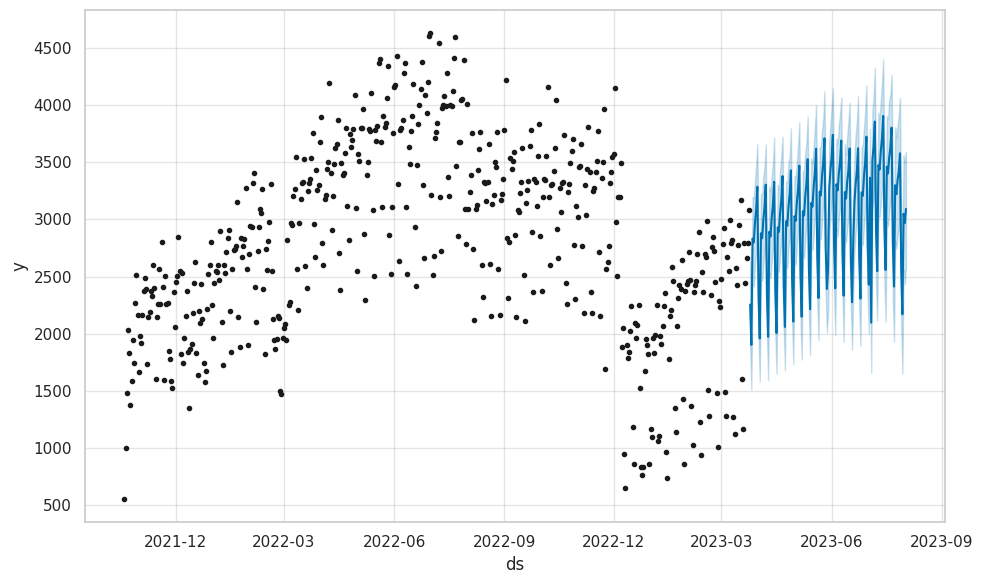

In [ ]:
# Get the year for which you want to forecast the remaining days
desired_year = 2023

# Generate future dates for the remaining days in the test set for the desired year
remaining_days_in_test_set = inside_test[
    inside_test['ds'].dt.year == desired_year
]
future_is_remaining = remaining_days_in_test_set[['ds']].copy()

# Get forecast for future dates
forecast_is_remaining = model_inside_c3.predict(future_is_remaining)
fig = model_inside_c3.plot(forecast_is_remaining)

forecast_is_remaining.tail(20)

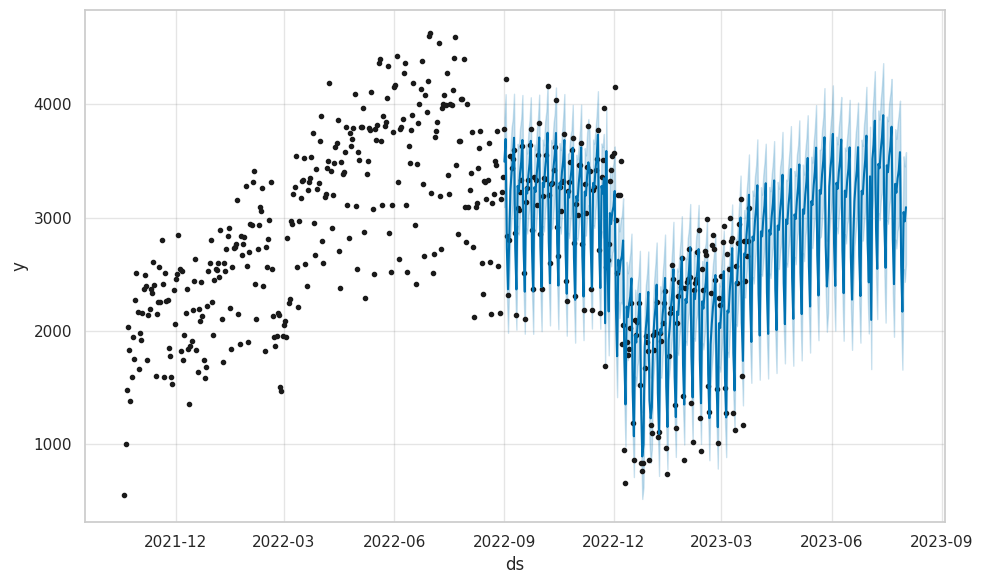

In [ ]:
# Define the start and end dates for the time frame to display
start_date = '2022-09-01'
end_date = '2023-12-31'

# Filter the forecast data for the desired time frame
filtered_forecast = forecast_is[(forecast_is['ds'] >= start_date) & (forecast_is['ds'] <= end_date)]

# Plot the filtered forecast
fig = model_inside_c3.plot(filtered_forecast)


####<a name = "FS">Food_Service</a>

#####<a name = "WS">With Split</a>

Mean Absolute Error (MAE): 413.91724192430894
Mean Squared Error (MSE): 205305.3230249479
Root Mean Squared Error (RMSE): 453.10630433149777
Mean Absolute Percentage Error (MAPE): 40.357866455988365%


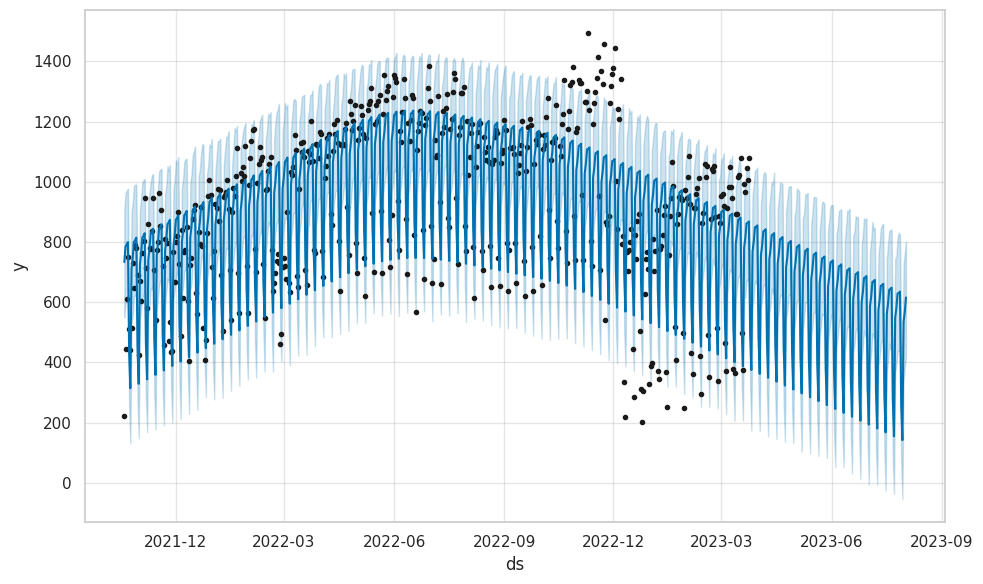

In [ ]:
# Create a DataFrame with 'ds' and 'y' columns for Prophet
food = train_set[['calendar.calendar_day_date', 'daily_yoy_ndt.total_food_service']]
food.columns = ['ds', 'y']
food_test = test_set[['calendar.calendar_day_date', 'daily_yoy_ndt.total_food_service']]
food_test.columns = ['ds', 'y']

# Initialize Prophet model with custom hyperparameters
model_food_c3 = Prophet()

# Fit the model to the training data
model_food_c3.fit(food)

# Generate future dates for forecasting, adjusting 'periods' to match the test set length
future_fs = model_food_c3.make_future_dataframe(periods=len(food_test))

# Get forecast for future dates
forecast_fs = model_food_c3.predict(future_fs)
fig = model_food_c3.plot(forecast_fs)

# Actual values for the validation set
actual_values_fs = food_test['y'][-len(food_test):]

# Predicted values from the Prophet forecast
predicted_values_fs = forecast_fs['yhat'][-len(food_test):]

# Calculate evaluation metrics
mae = mean_absolute_error(actual_values_fs, predicted_values_fs)
mse = mean_squared_error(actual_values_fs, predicted_values_fs)
rmse = np.sqrt(mse)
mape = np.mean(np.abs((actual_values_fs - predicted_values_fs) / actual_values_fs)) * 100

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Percentage Error (MAPE): {mape}%")

#####<a name = "HP">Hyperparamters</a>

Mean Absolute Error (MAE): 120.11113432960632
Mean Squared Error (MSE): 19597.432278839307
Root Mean Squared Error (RMSE): 139.99082926691773
Mean Absolute Percentage Error (MAPE): 15.818311753051272%


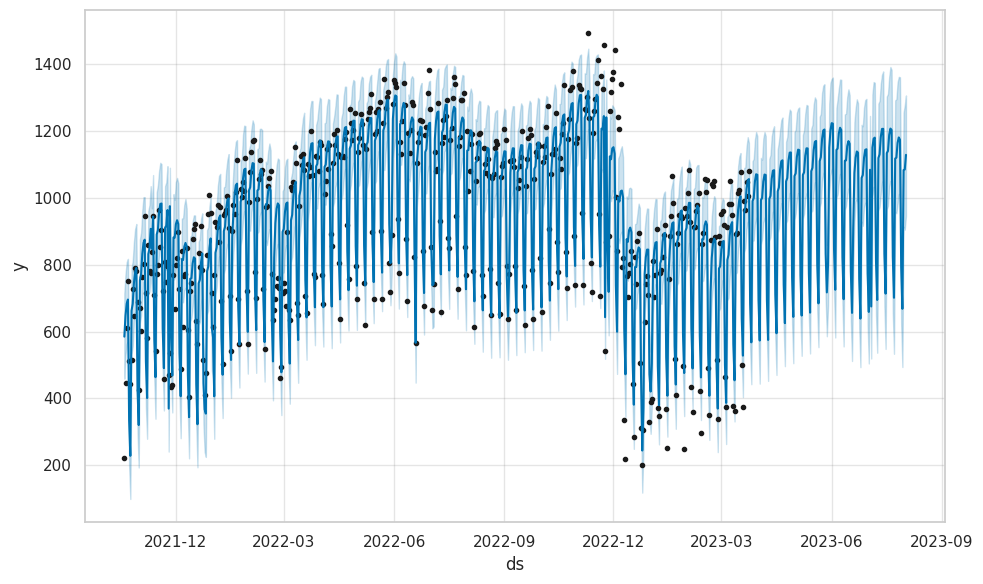

In [ ]:
# Initialize Prophet model with custom hyperparameters
model_food_c3 = Prophet(
    changepoint_prior_scale=0.10,   # Adjust for trend flexibility
    holidays_prior_scale=15,        # Adjust to control holiday impact
    seasonality_prior_scale=15,     # Adjust to control seasonality impact
    daily_seasonality=True,        # Disable daily seasonality
    weekly_seasonality=True,       # Disable weekly seasonality
    yearly_seasonality=True        # Disable yearly seasonality
)

# Add custom holidays or events that impact sales
model_food_c3.add_country_holidays(country_name='US')
# Fit the model to the training data
model_food_c3.fit(food)

# Generate future dates for forecasting, adjusting 'periods' to match the test set length
future_fs = model_food_c3.make_future_dataframe(periods=len(food_test))

# Get forecast for future dates
forecast_fs = model_food_c3.predict(future_fs)
fig = model_food_c3.plot(forecast_fs)

# Actual values for the validation set
actual_values_fs = food_test['y'][-len(food_test):]

# Predicted values from the Prophet forecast
predicted_values_fs = forecast_fs['yhat'][-len(food_test):]

# Calculate evaluation metrics
mae = mean_absolute_error(actual_values_fs, predicted_values_fs)
mse = mean_squared_error(actual_values_fs, predicted_values_fs)
rmse = np.sqrt(mse)
mape = np.mean(np.abs((actual_values_fs - predicted_values_fs) / actual_values_fs)) * 100

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Percentage Error (MAPE): {mape}%")

#####<a name = "SF">Sales Forecast</a>

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,Christmas Day,Christmas Day_lower,Christmas Day_upper,Christmas Day (Observed),...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
121,2023-07-24,803.716122,954.096170,1289.254713,700.021170,912.498661,0.0,0.0,0.0,0.0,...,72.375014,72.375014,72.375014,111.117058,111.117058,111.117058,0.0,0.0,0.0,1118.181839
122,2023-07-25,803.642564,959.407428,1293.520316,698.793520,913.859475,0.0,0.0,0.0,0.0,...,79.369146,79.369146,79.369146,106.902670,106.902670,106.902670,0.0,0.0,0.0,1120.888024
123,2023-07-26,803.569006,1006.499153,1339.467351,697.630198,914.518019,0.0,0.0,0.0,0.0,...,128.443465,128.443465,128.443465,102.372703,102.372703,102.372703,0.0,0.0,0.0,1165.358819
124,2023-07-27,803.495448,1016.865393,1353.209067,696.466876,915.234534,0.0,0.0,0.0,0.0,...,149.339368,149.339368,149.339368,97.589624,97.589624,97.589624,0.0,0.0,0.0,1181.398085
125,2023-07-28,803.421890,1008.457316,1345.170347,695.303553,916.455733,0.0,0.0,0.0,0.0,...,147.518979,147.518979,147.518979,92.614863,92.614863,92.614863,0.0,0.0,0.0,1174.529378
126,2023-07-29,803.348332,635.175660,964.125292,694.149969,918.221817,0.0,0.0,0.0,0.0,...,-228.580810,-228.580810,-228.580810,87.507611,87.507611,87.507611,0.0,0.0,0.0,793.248778
127,2023-07-30,803.274774,506.856108,841.534217,693.066342,919.868412,0.0,0.0,0.0,0.0,...,-348.465162,-348.465162,-348.465162,82.323773,82.323773,82.323773,0.0,0.0,0.0,668.107031
128,2023-07-31,803.201216,916.267553,1250.528044,691.982715,921.485820,0.0,0.0,0.0,0.0,...,72.375014,72.375014,72.375014,77.115107,77.115107,77.115107,0.0,0.0,0.0,1083.664982
129,2023-08-01,803.127658,922.601748,1265.981570,690.899088,922.945187,0.0,0.0,0.0,0.0,...,79.369146,79.369146,79.369146,71.928551,71.928551,71.928551,0.0,0.0,0.0,1085.399000
130,2023-08-02,803.054100,957.901390,1304.051085,689.815461,924.615359,0.0,0.0,0.0,0.0,...,128.443465,128.443465,128.443465,66.805758,66.805758,66.805758,0.0,0.0,0.0,1129.276968


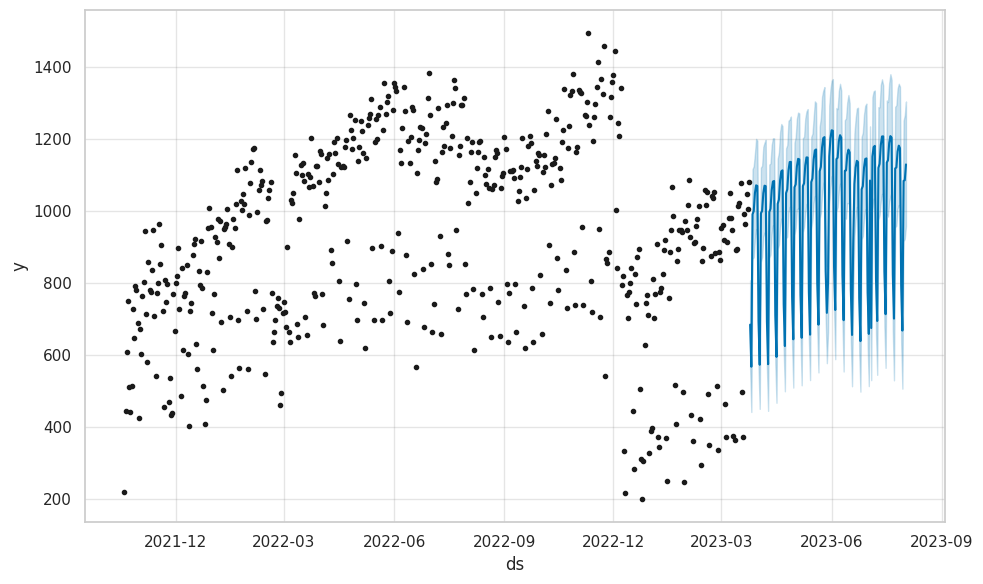

In [ ]:
# Get the year for which you want to forecast the remaining days
desired_year = 2023

# Generate future dates for the remaining days in the test set for the desired year
remaining_days_in_test_set = food_test[
    food_test['ds'].dt.year == desired_year
]
future_is_remaining = remaining_days_in_test_set[['ds']].copy()

# Get forecast for future dates
forecast_is_remaining = model_food_c3.predict(future_is_remaining)
fig = model_food_c3.plot(forecast_is_remaining)

forecast_is_remaining.tail(10)

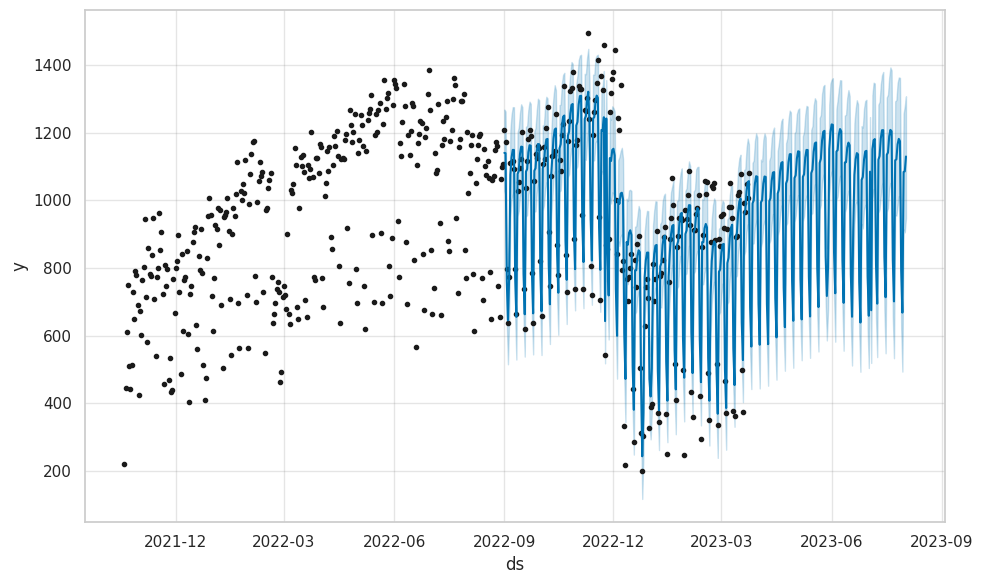

In [ ]:
# Define the start and end dates for the time frame to display
start_date = '2022-09-01'
end_date = '2023-12-31'

# Filter the forecast data for the desired time frame
filtered_forecast = forecast_fs[(forecast_fs['ds'] >= start_date) & (forecast_fs['ds'] <= end_date)]

# Plot the filtered forecast
fig = model_food_c3.plot(filtered_forecast)


####<a name = "UN">Unleaded</a>

#####<a name = "WS">With Split</a>

Mean Absolute Error (MAE): 324.89274534567323
Mean Squared Error (MSE): 162854.14385102683
Root Mean Squared Error (RMSE): 403.5519097353237
Mean Absolute Percentage Error (MAPE): 12.950111794713242%


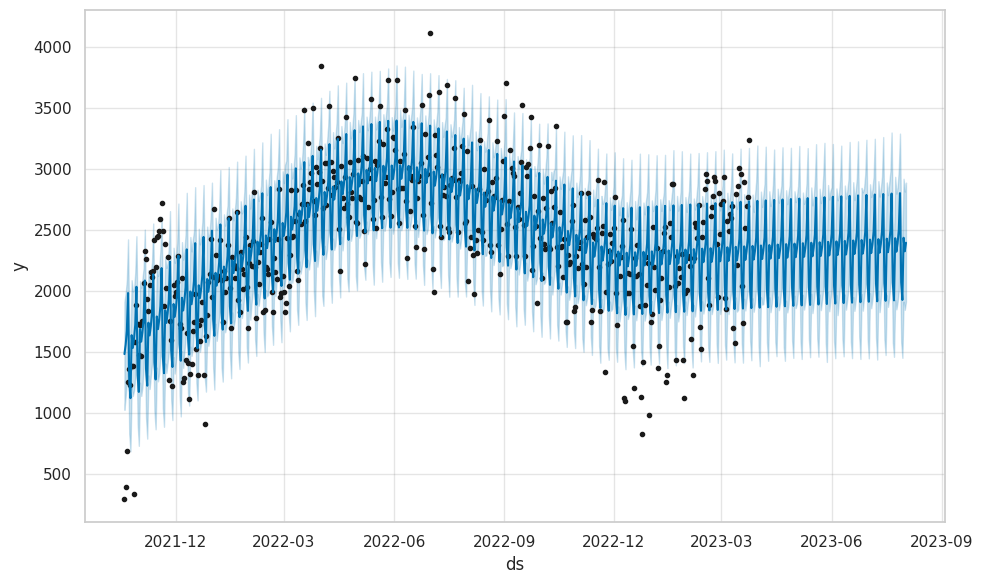

In [ ]:
# Create a DataFrame with 'ds' and 'y' columns for Prophet
unleaded = train_set[['calendar.calendar_day_date', 'unleaded']]
unleaded.columns = ['ds', 'y']
unleaded_test = test_set[['calendar.calendar_day_date', 'unleaded']]
unleaded_test.columns = ['ds', 'y']

# Initialize Prophet model with custom hyperparameters
model_unlead_c3 = Prophet()

# Fit the model to the training data
model_unlead_c3.fit(unleaded)

# Generate future dates for forecasting, adjusting 'periods' to match the test set length
future_un = model_unlead_c3.make_future_dataframe(periods=len(unleaded_test))

# Get forecast for future dates
forecast_un = model_unlead_c3.predict(future_un)
fig = model_unlead_c3.plot(forecast_un)

# Actual values for the validation set
actual_values_un = unleaded_test['y'][-len(unleaded_test):]

# Predicted values from the Prophet forecast
predicted_values_un = forecast_un['yhat'][-len(unleaded_test):]

# Calculate evaluation metrics
mae = mean_absolute_error(actual_values_un, predicted_values_un)
mse = mean_squared_error(actual_values_un, predicted_values_un)
rmse = np.sqrt(mse)
mape = np.mean(np.abs((actual_values_un - predicted_values_un) / actual_values_un)) * 100

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Percentage Error (MAPE): {mape}%")

#####<a name = "HP">Hyperparameters</a>

Mean Absolute Error (MAE): 334.858055430326
Mean Squared Error (MSE): 168034.13575907235
Root Mean Squared Error (RMSE): 409.91966988554276
Mean Absolute Percentage Error (MAPE): 15.58417237588054%


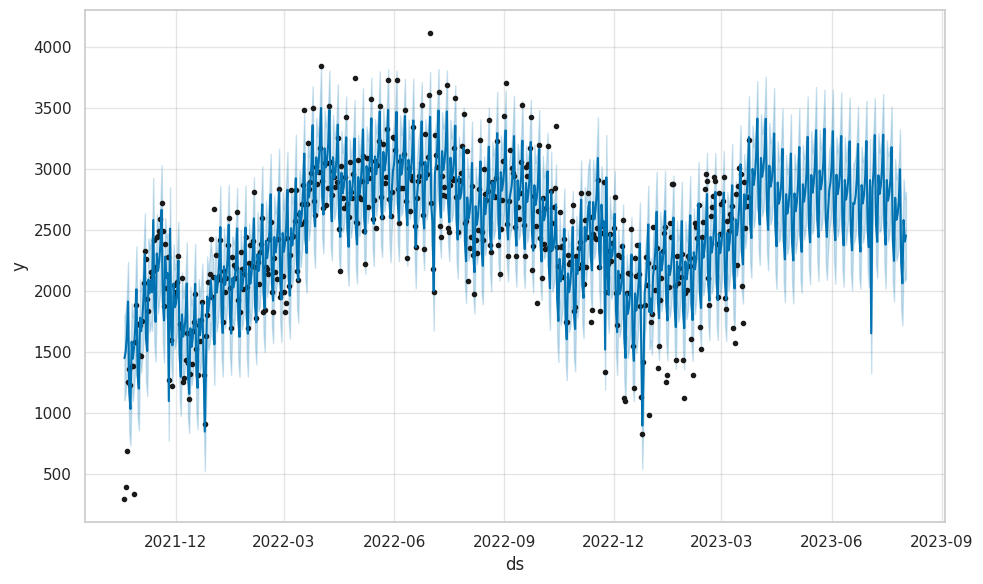

In [ ]:
# Initialize Prophet model with custom hyperparameters
model_unlead_c3 = Prophet(
    changepoint_prior_scale=0.05,   # Adjust for trend flexibility
    holidays_prior_scale=15,        # Adjust to control holiday impact
    seasonality_prior_scale=15,     # Adjust to control seasonality impact
    daily_seasonality=True,        # Disable daily seasonality
    weekly_seasonality=True,       # Disable weekly seasonality
    yearly_seasonality=True        # Disable yearly seasonality
)

# Add custom holidays or events that impact sales
model_unlead_c3.add_country_holidays(country_name='US')

# Fit the model to the training data
model_unlead_c3.fit(unleaded)

# Generate future dates for forecasting, adjusting 'periods' to match the test set length
future_un = model_unlead_c3.make_future_dataframe(periods=len(unleaded_test))

# Get forecast for future dates
forecast_un = model_unlead_c3.predict(future_un)
fig = model_unlead_c3.plot(forecast_un)

# Actual values for the validation set
actual_values_un = unleaded_test['y'][-len(unleaded_test):]

# Predicted values from the Prophet forecast
predicted_values_un = forecast_un['yhat'][-len(unleaded_test):]

# Calculate evaluation metrics
mae = mean_absolute_error(actual_values_un, predicted_values_un)
mse = mean_squared_error(actual_values_un, predicted_values_un)
rmse = np.sqrt(mse)
mape = np.mean(np.abs((actual_values_un - predicted_values_un) / actual_values_un)) * 100

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Percentage Error (MAPE): {mape}%")

#####<a name = "SF">Sales Forecast</a>

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,Christmas Day,Christmas Day_lower,Christmas Day_upper,Christmas Day (Observed),...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
121,2023-07-24,1057.523550,2427.289638,3098.513641,993.538167,1125.293238,0.0,0.0,0.0,0.0,...,112.000046,112.000046,112.000046,227.407105,227.407105,227.407105,0.0,0.0,0.0,2764.638747
122,2023-07-25,1056.879654,2228.287913,2908.601501,991.333060,1125.147820,0.0,0.0,0.0,0.0,...,-41.961056,-41.961056,-41.961056,201.537676,201.537676,201.537676,0.0,0.0,0.0,2584.164319
123,2023-07-26,1056.235759,2297.430415,2974.718932,989.461401,1125.194517,0.0,0.0,0.0,0.0,...,26.428712,26.428712,26.428712,175.178048,175.178048,175.178048,0.0,0.0,0.0,2625.550563
124,2023-07-27,1055.591863,2410.531423,3066.771832,988.278301,1125.269627,0.0,0.0,0.0,0.0,...,166.022975,166.022975,166.022975,148.710978,148.710978,148.710978,0.0,0.0,0.0,2738.033861
125,2023-07-28,1054.947967,2654.413832,3348.367844,986.772474,1125.492245,0.0,0.0,0.0,0.0,...,453.634568,453.634568,453.634568,122.530947,122.530947,122.530947,0.0,0.0,0.0,2998.821527
126,2023-07-29,1054.304071,1883.791245,2569.821098,985.398358,1125.878977,0.0,0.0,0.0,0.0,...,-285.902095,-285.902095,-285.902095,97.035983,97.035983,97.035983,0.0,0.0,0.0,2233.146005
127,2023-07-30,1053.660175,1717.495978,2410.502587,984.089128,1125.808987,0.0,0.0,0.0,0.0,...,-430.223150,-430.223150,-430.223150,72.619238,72.619238,72.619238,0.0,0.0,0.0,2063.764308
128,2023-07-31,1053.016280,2236.939100,2916.817405,982.779899,1126.238256,0.0,0.0,0.0,0.0,...,112.000046,112.000046,112.000046,49.660530,49.660530,49.660530,0.0,0.0,0.0,2582.384901
129,2023-08-01,1052.372384,2086.375410,2745.119063,981.470670,1126.667526,0.0,0.0,0.0,0.0,...,-41.961056,-41.961056,-41.961056,28.518042,28.518042,28.518042,0.0,0.0,0.0,2406.637414
130,2023-08-02,1051.728488,2136.391240,2801.405264,980.161441,1127.296564,0.0,0.0,0.0,0.0,...,26.428712,26.428712,26.428712,9.520392,9.520392,9.520392,0.0,0.0,0.0,2455.385637


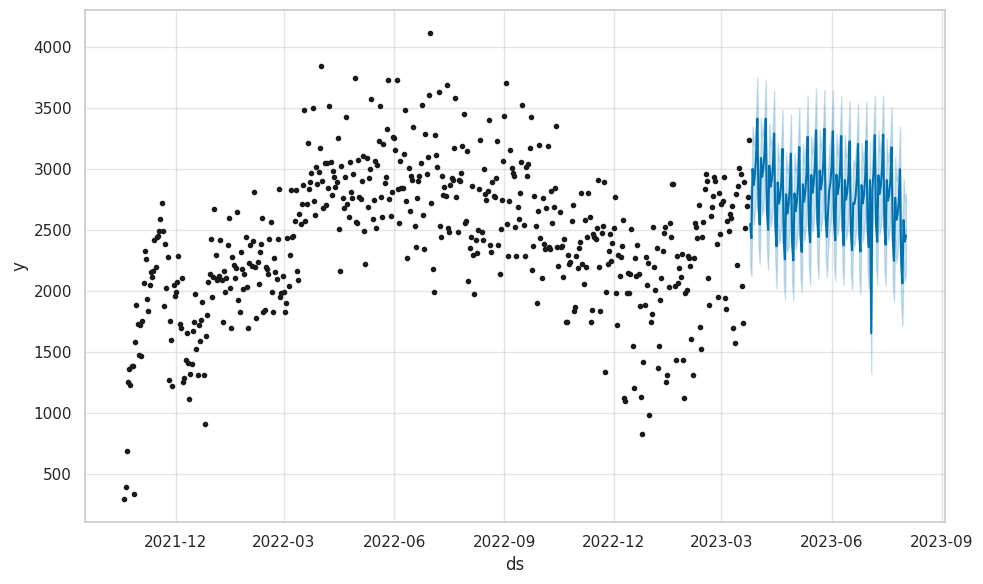

In [ ]:
# Get the year for which you want to forecast the remaining days
desired_year = 2023

# Generate future dates for the remaining days in the test set for the desired year
remaining_days_in_test_set = unleaded_test[
    unleaded_test['ds'].dt.year == desired_year
]
future_is_remaining = remaining_days_in_test_set[['ds']].copy()

# Get forecast for future dates
forecast_is_remaining = model_unlead_c3.predict(future_is_remaining)
fig = model_unlead_c3.plot(forecast_is_remaining)

forecast_is_remaining.tail(10)

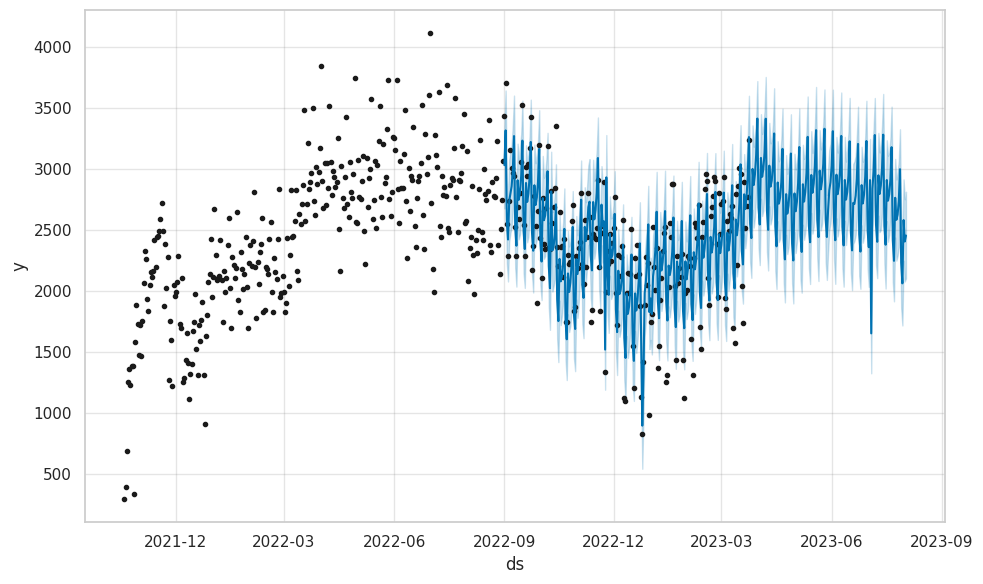

In [ ]:
# Define the start and end dates for the time frame to display
start_date = '2022-09-01'
end_date = '2023-12-31'

# Filter the forecast data for the desired time frame
filtered_forecast = forecast_un[(forecast_un['ds'] >= start_date) & (forecast_un['ds'] <= end_date)]

# Plot the filtered forecast
fig = model_unlead_c3.plot(filtered_forecast)

####<a name = "DI">Diesel</a>

#####<a name = "WS">With Split</a>

Mean Absolute Error (MAE): 2730.8260861195977
Mean Squared Error (MSE): 8667530.554740632
Root Mean Squared Error (RMSE): 2944.0670092137225
Mean Absolute Percentage Error (MAPE): 78.77600377568987%


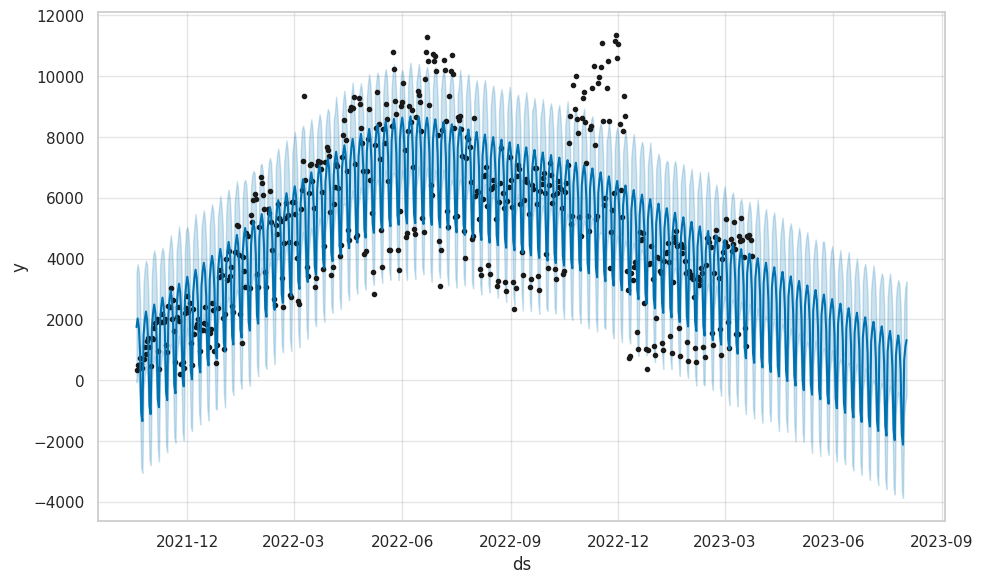

In [ ]:
# Create a DataFrame with 'ds' and 'y' columns for Prophet
diesel = train_set[['calendar.calendar_day_date', 'diesel_x']]
diesel.columns = ['ds', 'y']
diesel_test = test_set[['calendar.calendar_day_date', 'diesel_x']]
diesel_test.columns = ['ds', 'y']

# Initialize Prophet model with custom hyperparameters
model_diesel_c3 = Prophet()

# Fit the model to the data
model_diesel_c3.fit(diesel)

# Generate future dates for forecasting, adjusting 'periods' to match the test set length
future_d = model_diesel_c3.make_future_dataframe(periods=len(diesel_test))

# Get forecast for future dates
forecast = model_diesel_c3.predict(future_d)
fig = model_diesel_c3.plot(forecast)

# Actual values for the validation set
actual_values_d = diesel_test['y'][-len(diesel_test):]

# Predicted values from the Prophet forecast
predicted_values_d = forecast['yhat'][-len(diesel_test):]

# Calculate evaluation metrics
mae = mean_absolute_error(actual_values_d, predicted_values_d)
mse = mean_squared_error(actual_values_d, predicted_values_d)
rmse = np.sqrt(mse)
mape = np.mean(np.abs((actual_values_d - predicted_values_d) / actual_values_d)) * 100

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Percentage Error (MAPE): {mape}%")

#####<a name = "HP">Hyperparameters</a>

Mean Absolute Error (MAE): 1431.5856939247697
Mean Squared Error (MSE): 3400685.7108769575
Root Mean Squared Error (RMSE): 1844.094821552557
Mean Absolute Percentage Error (MAPE): 38.824752425682114%


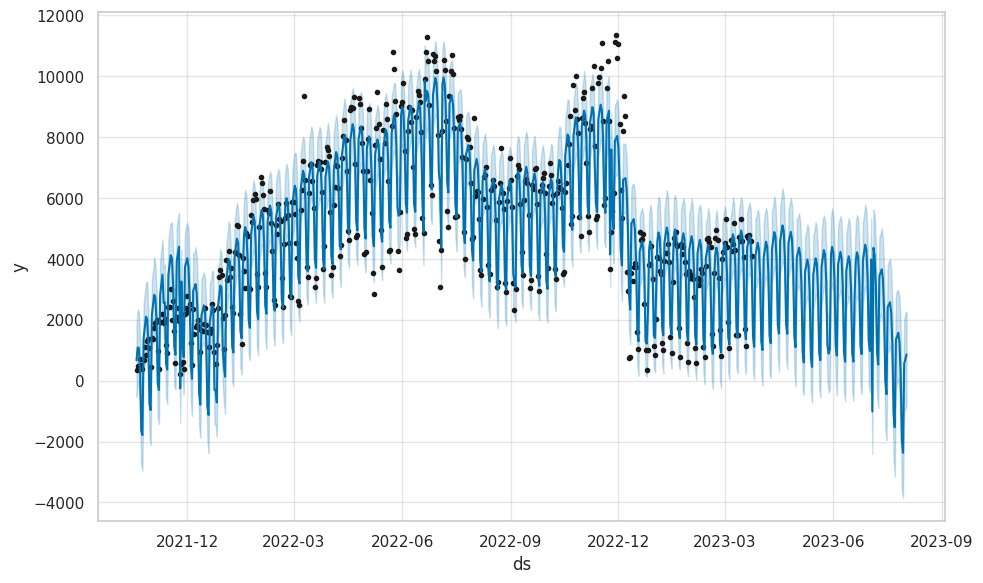

In [ ]:
# Initialize Prophet model with custom hyperparameters
model_diesel_c3 = Prophet(
    changepoint_prior_scale=0.05,   # Adjust for trend flexibility
    holidays_prior_scale=15,        # Adjust to control holiday impact
    seasonality_prior_scale=15,     # Adjust to control seasonality impact
    daily_seasonality=True,        # Disable daily seasonality
    weekly_seasonality=True,       # Disable weekly seasonality
    yearly_seasonality=True        # Disable yearly seasonality
)

# Add custom holidays or events that impact sales
model_diesel_c3.add_country_holidays(country_name='US')  # Adjust to your country or specific holidays

# Fit the model to the training data
model_diesel_c3.fit(diesel)

# Generate future dates for forecasting, adjusting 'periods' to match the test set length
future_d = model_diesel_c3.make_future_dataframe(periods=len(diesel_test))

# Get forecast for future dates
forecast_d = model_diesel_c3.predict(future_d)
fig = model_diesel_c3.plot(forecast_d)

# Actual values for the validation set (assuming 'inside_test' is your test set)
actual_values_d = diesel_test['y'][-len(diesel_test):]

# Predicted values from the Prophet forecast
predicted_values_d = forecast_d['yhat'][-len(diesel_test):]

# Calculate evaluation metrics
mae = mean_absolute_error(actual_values_d, predicted_values_d)
mse = mean_squared_error(actual_values_d, predicted_values_d)
rmse = np.sqrt(mse)
mape = np.mean(np.abs((actual_values_d - predicted_values_d) / actual_values_d)) * 100

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Percentage Error (MAPE): {mape}%")

#####<a name = "SF">Sales Forecast</a>

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,Christmas Day,Christmas Day_lower,Christmas Day_upper,Christmas Day (Observed),...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
121,2023-07-24,966.726181,-117.688445,2806.017565,8.456603,1917.356681,0.0,0.0,0.0,0.0,...,771.621869,771.621869,771.621869,223.005236,223.005236,223.005236,0.0,0.0,0.0,1357.757151
122,2023-07-25,943.159826,-139.841081,3056.904365,-22.755049,1912.538990,0.0,0.0,0.0,0.0,...,997.377772,997.377772,997.377772,114.035008,114.035008,114.035008,0.0,0.0,0.0,1450.976472
123,2023-07-26,919.593471,57.383609,3138.061108,-53.117800,1900.230434,0.0,0.0,0.0,0.0,...,1245.629269,1245.629269,1245.629269,11.605334,11.605334,11.605334,0.0,0.0,0.0,1573.231940
124,2023-07-27,896.027116,-294.336036,2728.732652,-84.788586,1887.757550,0.0,0.0,0.0,0.0,...,1057.179767,1057.179767,1057.179767,-84.203166,-84.203166,-84.203166,0.0,0.0,0.0,1265.407583
125,2023-07-28,872.460760,-1383.505508,1883.581853,-113.467461,1879.735514,0.0,0.0,0.0,0.0,...,138.452898,138.452898,138.452898,-173.489742,-173.489742,-173.489742,0.0,0.0,0.0,233.827782
126,2023-07-29,848.894405,-3537.435267,-397.853094,-144.617191,1872.530491,0.0,0.0,0.0,0.0,...,-1954.590109,-1954.590109,-1954.590109,-256.517998,-256.517998,-256.517998,0.0,0.0,0.0,-1965.809836
127,2023-07-30,825.328050,-3946.014481,-824.876590,-175.566703,1864.575017,0.0,0.0,0.0,0.0,...,-2255.671466,-2255.671466,-2255.671466,-333.695793,-333.695793,-333.695793,0.0,0.0,0.0,-2367.635344
128,2023-07-31,801.761695,-1053.864448,2279.638458,-205.642634,1851.294055,0.0,0.0,0.0,0.0,...,771.621869,771.621869,771.621869,-405.551277,-405.551277,-405.551277,0.0,0.0,0.0,564.236153
129,2023-08-01,778.195340,-890.606692,2358.012772,-238.982506,1838.013093,0.0,0.0,0.0,0.0,...,997.377772,997.377772,997.377772,-472.705867,-472.705867,-472.705867,0.0,0.0,0.0,699.271111
130,2023-08-02,754.628985,-816.027624,2487.946287,-268.218181,1826.687482,0.0,0.0,0.0,0.0,...,1245.629269,1245.629269,1245.629269,-535.845078,-535.845078,-535.845078,0.0,0.0,0.0,860.817042


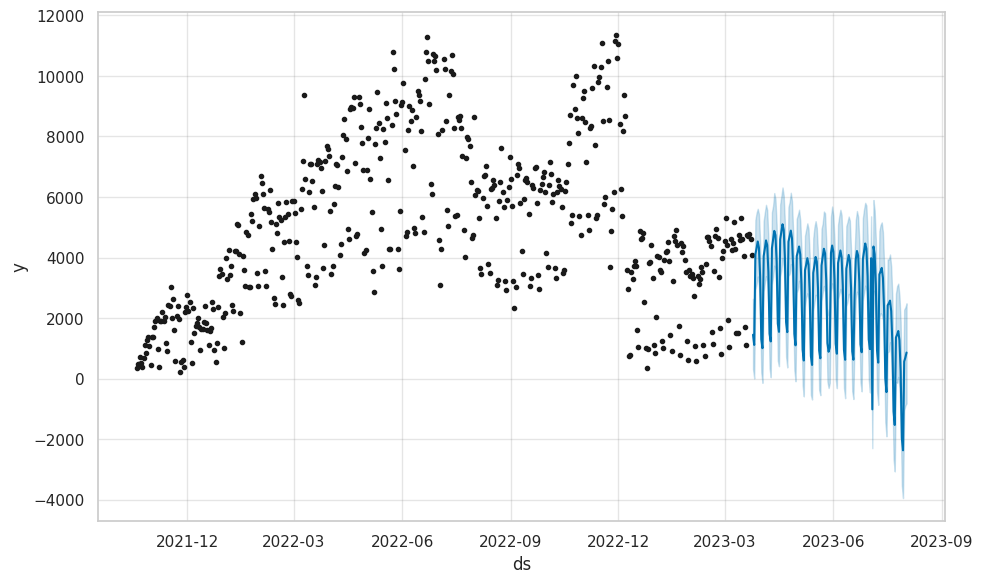

In [ ]:
# Get the year for which you want to forecast the remaining days
desired_year = 2023

# Generate future dates for the remaining days in the test set for the desired year
remaining_days_in_test_set = diesel_test[
    diesel_test['ds'].dt.year == desired_year
]
future_is_remaining = remaining_days_in_test_set[['ds']].copy()

# Get forecast for future dates
forecast_is_remaining = model_diesel_c3.predict(future_is_remaining)
fig = model_diesel_c3.plot(forecast_is_remaining)

forecast_is_remaining.tail(10)

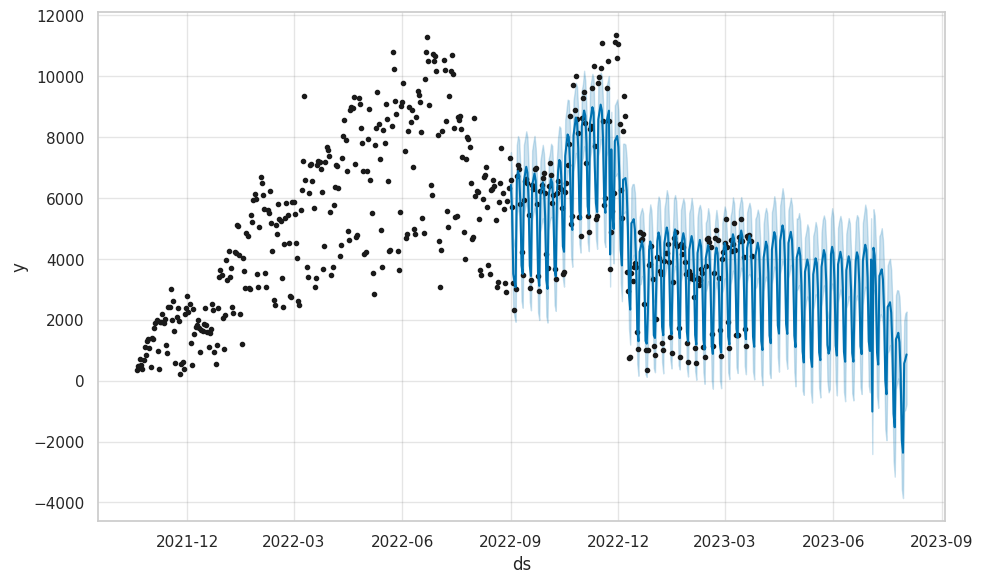

In [ ]:
# Define the start and end dates for the time frame to display
start_date = '2022-09-01'
end_date = '2023-12-31'

# Filter the forecast data for the desired time frame
filtered_forecast = forecast_d[(forecast_d['ds'] >= start_date) & (forecast_d['ds'] <= end_date)]

# Plot the filtered forecast
fig = model_diesel_c3.plot(filtered_forecast)

**Cluster 3**

Inside Sales

Inside sales without considering seasonality hyperparameters suggests that the model's forecasts have a moderate to high level of prediction error, with a Mean Absolute Error (MAE) of approximately 1,539 and a Root Mean Squared Error (RMSE) of approximately 1,658, indicating less accurate and more variable forecasts.

In contrast, the results for inside sales with seasonality parameters show a substantial improvement in forecast accuracy, with a much lower MAE of approximately 333 and a significantly lower RMSE of around 408, indicating that the inclusion of seasonality parameters resulted in much more accurate and less variable forecasts. The Mean Squared Error (MSE) also decreased substantially, confirming the substantial enhancement in forecast quality.

Food Service

Food service without considering seasonality hyperparameters indicates that the model's forecasts have a high level of prediction error, with a Mean Absolute Error (MAE) of approximately 2,020 and a Root Mean Squared Error (RMSE) of approximately 2,034, suggesting that the forecasts are considerably less accurate and have substantial variability.


In contrast, the results for sales with seasonality parameters show a significant improvement in forecast accuracy, with a much lower MAE of approximately 120 and a substantially lower RMSE of around 140, indicating that the inclusion of seasonality parameters led to highly accurate and much less variable forecasts. The Mean Squared Error (MSE) also decreased significantly, demonstrating a substantial enhancement in forecast quality.



###<a name = "C4">Cluster-4</a>

####<a name = "DS">Data Split</a>

In [ ]:
fb = copy.deepcopy(bonfire_cluster4)

In [ ]:
# Sort the data by date
fb.sort_values(by='calendar.calendar_day_date', inplace=True)

# Define the percentage split 80% training, 20% testing).
train_percentage = 0.8

# Calculate the index at which to split the data.
split_index = int(len(fb) * train_percentage)

# Split the data into training and test sets.
train_set = fb[:split_index]
test_set = fb[split_index:]

####<a name = "IS">Inside_Sales</a>

#####<a name = "WS">With Split</a>

Mean Absolute Error (MAE): 530.0195416721243
Mean Squared Error (MSE): 363905.21191252075
Root Mean Squared Error (RMSE): 603.2455651826383
Mean Absolute Percentage Error (MAPE): 15.050395055701852%


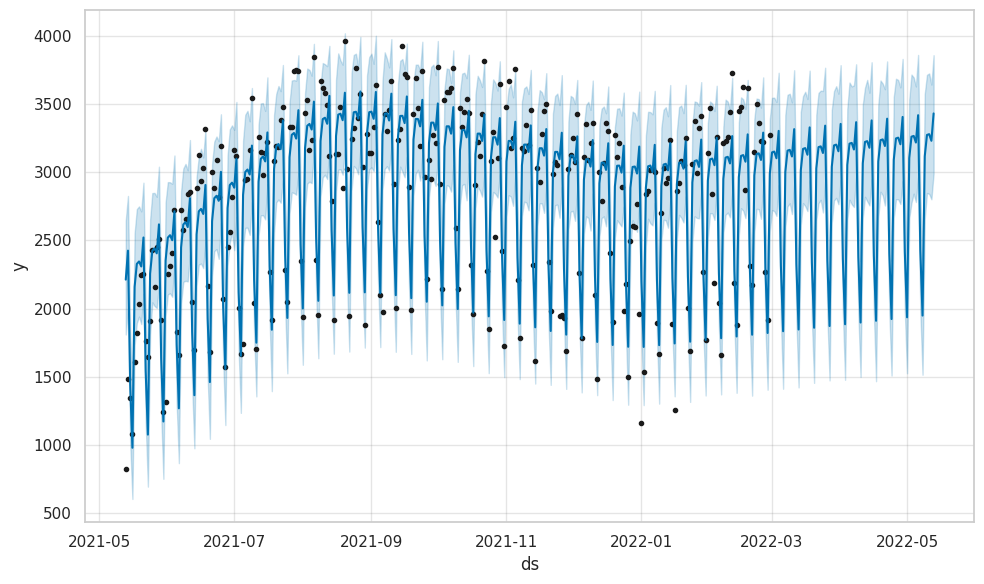

In [ ]:
# Create a DataFrame with 'ds' and 'y' columns for Prophet
inside = train_set[['calendar.calendar_day_date', 'daily_yoy_ndt.total_inside_sales']]
inside.columns = ['ds', 'y']
inside_test = test_set[['calendar.calendar_day_date', 'daily_yoy_ndt.total_inside_sales']]
inside_test.columns = ['ds', 'y']

# Initialize Prophet model
model_inside_c4 = Prophet()

# Fit the model to the training data
model_inside_c4.fit(inside)

# Generate future dates for forecasting, adjusting 'periods' to match the test set length
future_is = model_inside_c4.make_future_dataframe(periods=len(inside_test))

# Get forecast for future dates
forecast_is = model_inside_c4.predict(future_is)
fig = model_inside_c4.plot(forecast_is)

# Actual values for the validation set
actual_values_is = inside_test['y'][-len(inside_test):]

# Predicted values from the Prophet forecast
predicted_values_is = forecast_is['yhat'][-len(inside_test):]

# Calculate evaluation metrics
mae = mean_absolute_error(actual_values_is, predicted_values_is)
mse = mean_squared_error(actual_values_is, predicted_values_is)
rmse = np.sqrt(mse)
mape = np.mean(np.abs((actual_values_is - predicted_values_is) / actual_values_is)) * 100

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Percentage Error (MAPE): {mape}%")

#####<a name = "HP">Hyperparamters</a>

Mean Absolute Error (MAE): 848.2546474800506
Mean Squared Error (MSE): 1090832.1354950224
Root Mean Squared Error (RMSE): 1044.4290954847163
Mean Absolute Percentage Error (MAPE): 25.383864161467162%


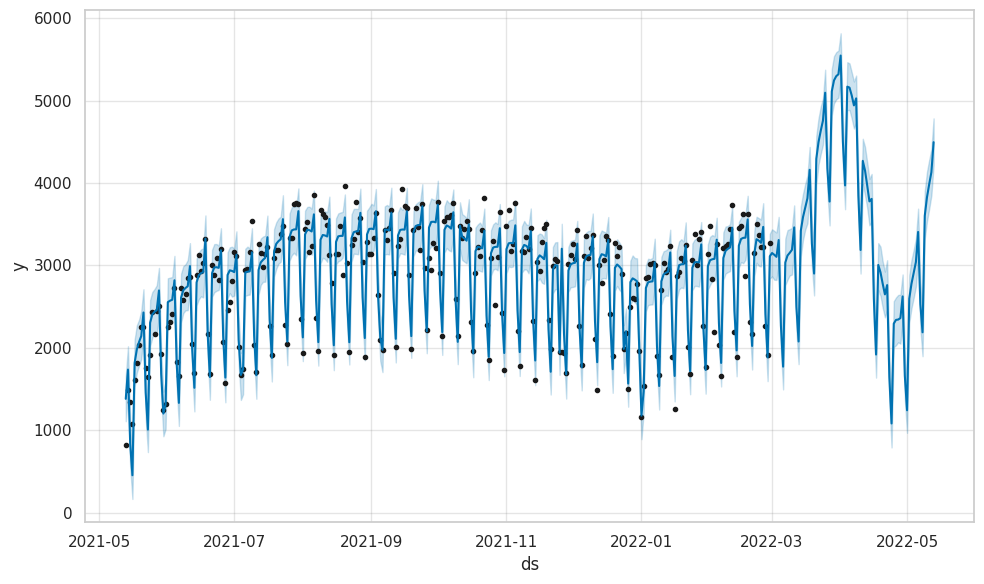

In [ ]:
# Initialize Prophet model with custom hyperparameters
model_inside_c4= Prophet(
    changepoint_prior_scale=0.10,   # Adjust for trend flexibility
    holidays_prior_scale=15,        # Adjust to control holiday impact
    seasonality_prior_scale=15,     # Adjust to control seasonality impact
    daily_seasonality=True,        # Disable daily seasonality
    weekly_seasonality=True,       # Disable weekly seasonality
    yearly_seasonality=True        # Disable yearly seasonality
)

# Add custom holidays or events that impact sales
model_inside_c4.add_country_holidays(country_name='US')

# Fit the model to the training data
model_inside_c4.fit(inside)

# Generate future dates for forecasting, adjusting 'periods' to match the test set length
future_is = model_inside_c4.make_future_dataframe(periods=len(inside_test))

# Get forecast for future dates
forecast_is = model_inside_c4.predict(future_is)
fig = model_inside_c4.plot(forecast_is)

# Actual values for the validation set
actual_values_is = inside_test['y'][-len(inside_test):]

# Predicted values from the Prophet forecast
predicted_values_is = forecast_is['yhat'][-len(inside_test):]

# Calculate evaluation metrics
mae = mean_absolute_error(actual_values_is, predicted_values_is)
mse = mean_squared_error(actual_values_is, predicted_values_is)
rmse = np.sqrt(mse)
mape = np.mean(np.abs((actual_values_is - predicted_values_is) / actual_values_is)) * 100

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Percentage Error (MAPE): {mape}%")

#####<a name = "SF">Sales Forecast</a>

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,Christmas Day,Christmas Day_lower,Christmas Day_upper,Christmas Day (Observed),...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
54,2022-04-24,3733.693901,805.244728,1367.079984,3733.693868,3733.693935,0.0,0.0,0.0,0.0,...,-1033.767524,-1033.767524,-1033.767524,-2141.117810,-2141.117810,-2141.117810,0.0,0.0,0.0,1081.365924
55,2022-04-25,3741.722761,2010.056108,2571.647323,3741.722727,3741.722796,0.0,0.0,0.0,0.0,...,219.476849,219.476849,219.476849,-2190.941789,-2190.941789,-2190.941789,0.0,0.0,0.0,2292.815178
56,2022-04-26,3749.751621,2058.392911,2616.881721,3749.751586,3749.751657,0.0,0.0,0.0,0.0,...,284.509585,284.509585,284.509585,-2218.573809,-2218.573809,-2218.573809,0.0,0.0,0.0,2338.244754
57,2022-04-27,3757.780481,2072.305172,2629.746431,3757.780445,3757.780517,0.0,0.0,0.0,0.0,...,285.942287,285.942287,285.942287,-2224.031382,-2224.031382,-2224.031382,0.0,0.0,0.0,2342.248743
58,2022-04-28,3765.809341,2087.104589,2641.381972,3765.809304,3765.809379,0.0,0.0,0.0,0.0,...,279.602272,279.602272,279.602272,-2207.705637,-2207.705637,-2207.705637,0.0,0.0,0.0,2360.263333
59,2022-04-29,3773.838201,2340.245959,2913.287841,3773.838163,3773.838240,0.0,0.0,0.0,0.0,...,496.998429,496.998429,496.998429,-2170.344659,-2170.344659,-2170.344659,0.0,0.0,0.0,2623.049329
60,2022-04-30,3781.867061,1372.212946,1940.915993,3781.867022,3781.867100,0.0,0.0,0.0,0.0,...,-532.761897,-532.761897,-532.761897,-2113.029605,-2113.029605,-2113.029605,0.0,0.0,0.0,1658.632916
61,2022-05-01,3789.895922,959.502972,1502.355566,3789.895881,3789.895962,0.0,0.0,0.0,0.0,...,-1033.767524,-1033.767524,-1033.767524,-2037.144280,-2037.144280,-2037.144280,0.0,0.0,0.0,1241.541474
62,2022-05-02,3797.924782,2322.858238,2873.707581,3797.924740,3797.924823,0.0,0.0,0.0,0.0,...,219.476849,219.476849,219.476849,-1944.338976,-1944.338976,-1944.338976,0.0,0.0,0.0,2595.620011
63,2022-05-03,3805.953642,2497.376194,3044.093596,3805.953599,3805.953684,0.0,0.0,0.0,0.0,...,284.509585,284.509585,284.509585,-1836.489532,-1836.489532,-1836.489532,0.0,0.0,0.0,2776.531052


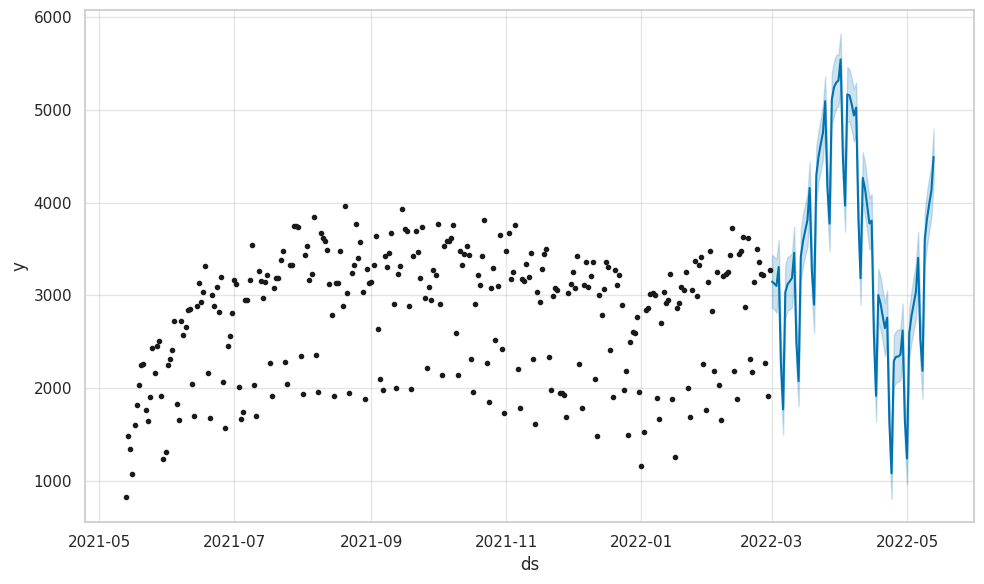

In [ ]:
# Get the year for which you want to forecast the remaining days
desired_year = 2022

# Generate future dates for the remaining days in the test set for the desired year
remaining_days_in_test_set = inside_test[
    inside_test['ds'].dt.year == desired_year
]
future_is_remaining = remaining_days_in_test_set[['ds']].copy()

# Get forecast for future dates
forecast_is_remaining = model_inside_c4.predict(future_is_remaining)
fig = model_inside_c4.plot(forecast_is_remaining)

forecast_is_remaining.tail(20)

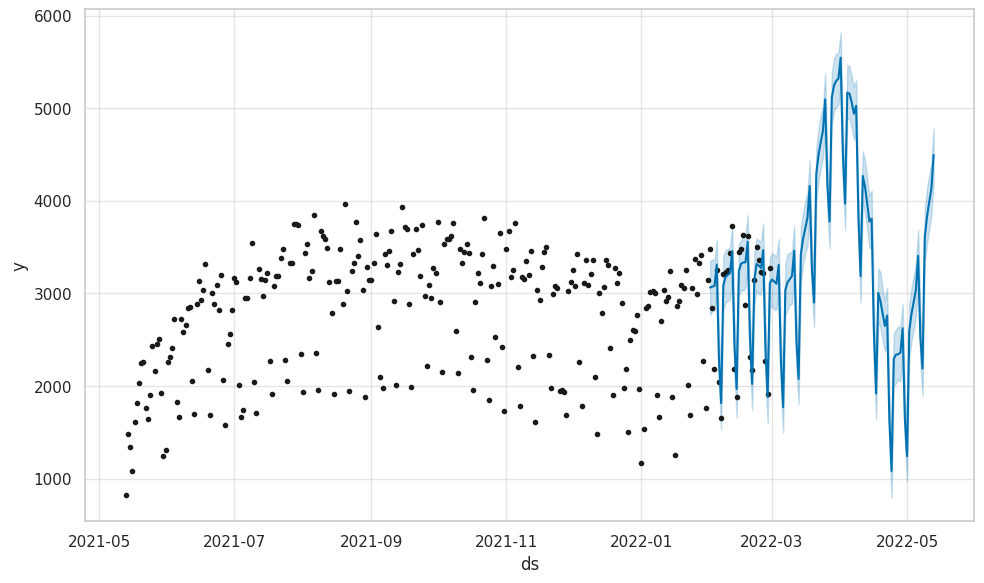

In [ ]:
# Define the start and end dates for the time frame to display
start_date = '2022-02-01'
end_date = '2022-12-31'

# Filter the forecast data for the desired time frame
filtered_forecast = forecast_is[(forecast_is['ds'] >= start_date) & (forecast_is['ds'] <= end_date)]

# Plot the filtered forecast
fig = model_inside_c4.plot(filtered_forecast)


####<a name = "FS">Food_Service</a>

#####<a name = "WS">With Split</a>

Mean Absolute Error (MAE): 185.1888063829784
Mean Squared Error (MSE): 41873.701516889
Root Mean Squared Error (RMSE): 204.63064657301211
Mean Absolute Percentage Error (MAPE): 21.577803266490804%


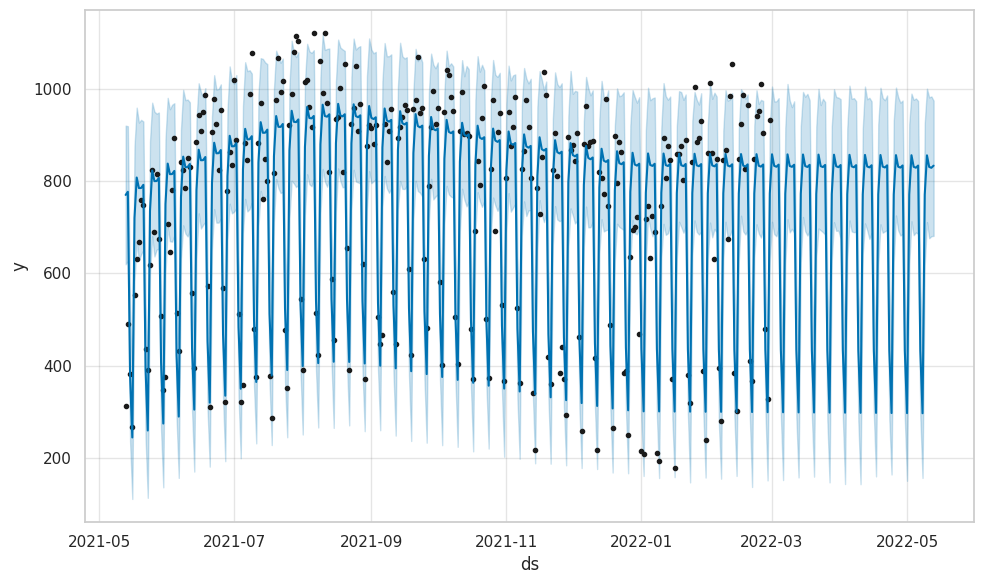

In [ ]:
# Create a DataFrame with 'ds' and 'y' columns for Prophet
food = train_set[['calendar.calendar_day_date', 'daily_yoy_ndt.total_food_service']]
food.columns = ['ds', 'y']
food_test = test_set[['calendar.calendar_day_date', 'daily_yoy_ndt.total_food_service']]
food_test.columns = ['ds', 'y']

# Initialize Prophet model with custom hyperparameters
model_food_c4 = Prophet()

# Fit the model to the training data
model_food_c4.fit(food)

# Generate future dates for forecasting, adjusting 'periods' to match the test set length
future_fs = model_food_c4.make_future_dataframe(periods=len(food_test))

# Get forecast for future dates
forecast_fs = model_food_c4.predict(future_fs)
fig = model_food_c4.plot(forecast_fs)

# Actual values for the validation set
actual_values_fs = food_test['y'][-len(food_test):]

# Predicted values from the Prophet forecast
predicted_values_fs = forecast_fs['yhat'][-len(food_test):]

# Calculate evaluation metrics
mae = mean_absolute_error(actual_values_fs, predicted_values_fs)
mse = mean_squared_error(actual_values_fs, predicted_values_fs)
rmse = np.sqrt(mse)
mape = np.mean(np.abs((actual_values_fs - predicted_values_fs) / actual_values_fs)) * 100

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Percentage Error (MAPE): {mape}%")

#####<a name = "HP">Hyperparamters</a>

Mean Absolute Error (MAE): 208.63637289184308
Mean Squared Error (MSE): 66867.58935634591
Root Mean Squared Error (RMSE): 258.58768214349635
Mean Absolute Percentage Error (MAPE): 26.729910576025674%


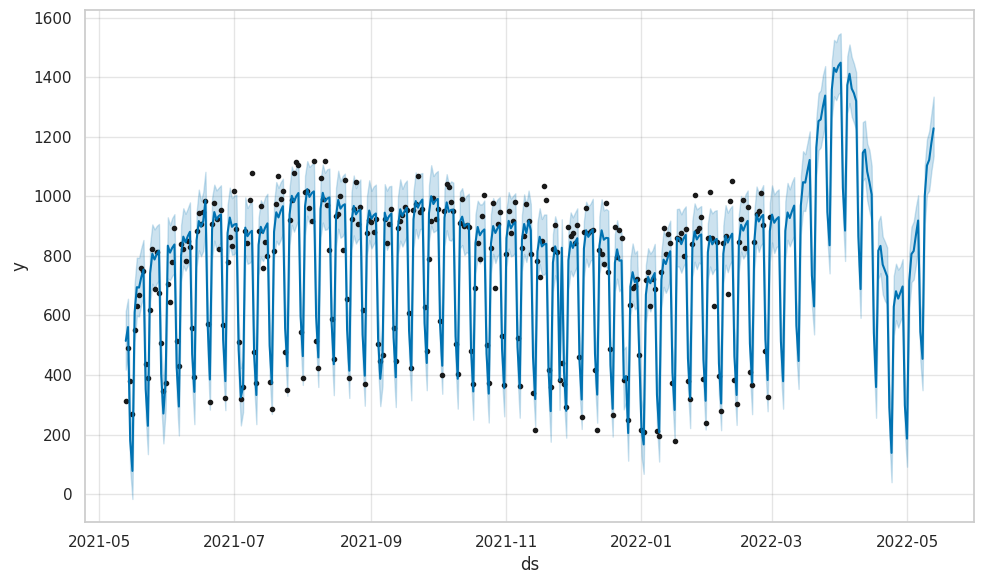

In [ ]:
# Initialize Prophet model with custom hyperparameters
model_food_c4 = Prophet(
    changepoint_prior_scale=0.10,   # Adjust for trend flexibility
    holidays_prior_scale=15,        # Adjust to control holiday impact
    seasonality_prior_scale=15,     # Adjust to control seasonality impact
    daily_seasonality=True,        # Disable daily seasonality
    weekly_seasonality=True,       # Disable weekly seasonality
    yearly_seasonality=True        # Disable yearly seasonality
)

# Add custom holidays or events that impact sales
model_food_c4.add_country_holidays(country_name='US')
# Fit the model to the training data
model_food_c4.fit(food)

# Generate future dates for forecasting, adjusting 'periods' to match the test set length
future_fs = model_food_c4.make_future_dataframe(periods=len(food_test))

# Get forecast for future dates
forecast_fs = model_food_c4.predict(future_fs)
fig = model_food_c4.plot(forecast_fs)

# Actual values for the validation set
actual_values_fs = food_test['y'][-len(food_test):]

# Predicted values from the Prophet forecast
predicted_values_fs = forecast_fs['yhat'][-len(food_test):]

# Calculate evaluation metrics
mae = mean_absolute_error(actual_values_fs, predicted_values_fs)
mse = mean_squared_error(actual_values_fs, predicted_values_fs)
rmse = np.sqrt(mse)
mape = np.mean(np.abs((actual_values_fs - predicted_values_fs) / actual_values_fs)) * 100

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Percentage Error (MAPE): {mape}%")

#####<a name = "SF">Sales Forecast</a>

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,Christmas Day,Christmas Day_lower,Christmas Day_upper,Christmas Day (Observed),...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
64,2022-05-04,1032.229330,725.262128,911.424858,1032.229291,1032.229369,0.0,0.0,0.0,0.0,...,128.636752,128.636752,128.636752,-427.177859,-427.177859,-427.177859,0.0,0.0,0.0,816.703637
65,2022-05-05,1034.191525,772.817178,961.503636,1034.191485,1034.191565,0.0,0.0,0.0,0.0,...,141.958329,141.958329,141.958329,-389.605684,-389.605684,-389.605684,0.0,0.0,0.0,869.559584
66,2022-05-06,1036.153719,818.844245,1014.649948,1036.153679,1036.153760,0.0,0.0,0.0,0.0,...,149.369205,149.369205,149.369205,-349.573239,-349.573239,-349.573239,0.0,0.0,0.0,918.965099
67,2022-05-07,1038.115914,443.511196,641.244822,1038.115873,1038.115956,0.0,0.0,0.0,0.0,...,-268.325541,-268.325541,-268.325541,-307.729912,-307.729912,-307.729912,0.0,0.0,0.0,545.075875
68,2022-05-08,1040.078109,354.179446,546.890730,1040.078066,1040.078151,0.0,0.0,0.0,0.0,...,-404.091460,-404.091460,-404.091460,-264.727681,-264.727681,-264.727681,0.0,0.0,0.0,454.274382
69,2022-05-09,1042.040304,910.782449,1098.961324,1042.040260,1042.040347,0.0,0.0,0.0,0.0,...,97.772466,97.772466,97.772466,-221.207712,-221.207712,-221.207712,0.0,0.0,0.0,1001.620472
70,2022-05-10,1044.002498,1006.234035,1200.372807,1044.002454,1044.002542,0.0,0.0,0.0,0.0,...,154.680249,154.680249,154.680249,-177.787603,-177.787603,-177.787603,0.0,0.0,0.0,1103.910557
71,2022-05-11,1045.964693,1025.709461,1223.586793,1045.964647,1045.964738,0.0,0.0,0.0,0.0,...,128.636752,128.636752,128.636752,-135.049563,-135.049563,-135.049563,0.0,0.0,0.0,1122.567296
72,2022-05-12,1047.926888,1084.743811,1280.228843,1047.926841,1047.926933,0.0,0.0,0.0,0.0,...,141.958329,141.958329,141.958329,-93.529778,-93.529778,-93.529778,0.0,0.0,0.0,1179.370852
73,2022-05-13,1049.889082,1128.581196,1321.871559,1049.889034,1049.889129,0.0,0.0,0.0,0.0,...,149.369205,149.369205,149.369205,-53.709203,-53.709203,-53.709203,0.0,0.0,0.0,1228.564498


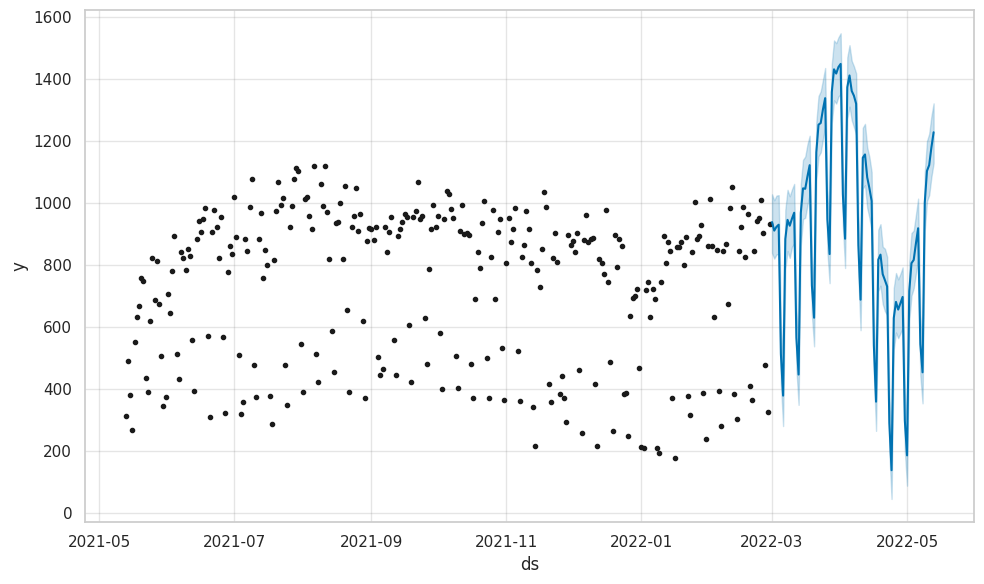

In [ ]:
# Get the year for which you want to forecast the remaining days
desired_year = 2022

# Generate future dates for the remaining days in the test set for the desired year
remaining_days_in_test_set = food_test[
    food_test['ds'].dt.year == desired_year
]
future_is_remaining = remaining_days_in_test_set[['ds']].copy()

# Get forecast for future dates
forecast_is_remaining = model_food_c4.predict(future_is_remaining)
fig = model_food_c4.plot(forecast_is_remaining)

forecast_is_remaining.tail(10)

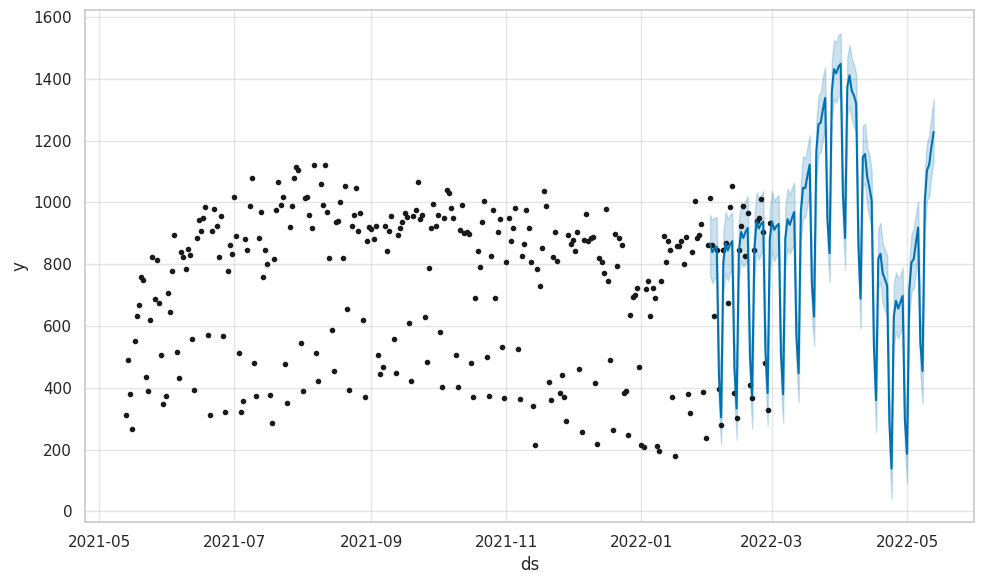

In [ ]:
# Define the start and end dates for the time frame to display
start_date = '2022-02-01'
end_date = '2022-12-31'

# Filter the forecast data for the desired time frame
filtered_forecast = forecast_fs[(forecast_fs['ds'] >= start_date) & (forecast_fs['ds'] <= end_date)]

# Plot the filtered forecast
fig = model_food_c4.plot(filtered_forecast)


####<a name = "UN">Unleaded</a>

#####<a name = "WS">With Split</a>

Mean Absolute Error (MAE): 555.11125097827
Mean Squared Error (MSE): 475495.8081918061
Root Mean Squared Error (RMSE): 689.5620408576781
Mean Absolute Percentage Error (MAPE): 18.9956804438609%


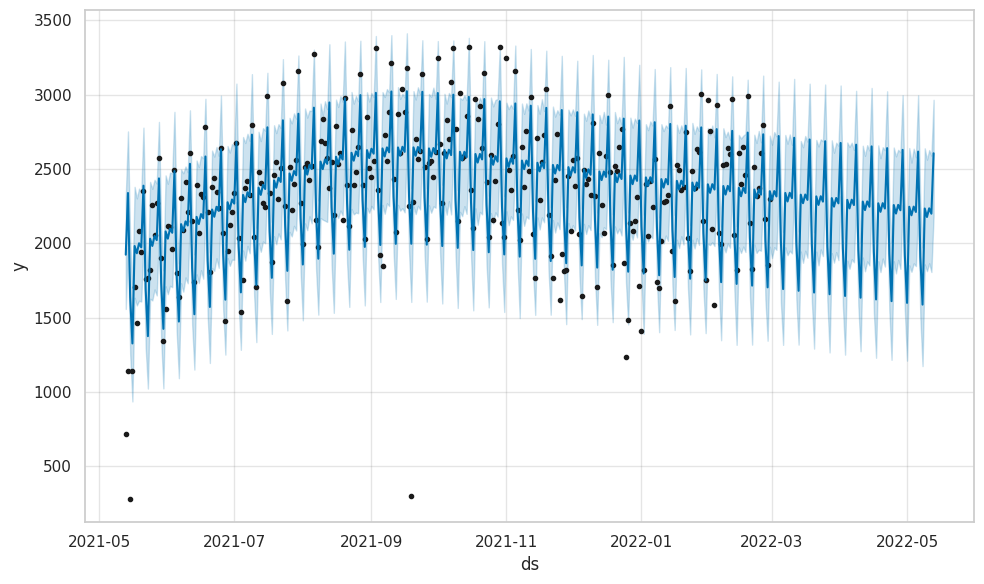

In [ ]:
# Create a DataFrame with 'ds' and 'y' columns for Prophet
unleaded = train_set[['calendar.calendar_day_date', 'unleaded']]
unleaded.columns = ['ds', 'y']
unleaded_test = test_set[['calendar.calendar_day_date', 'unleaded']]
unleaded_test.columns = ['ds', 'y']

# Initialize Prophet model with custom hyperparameters
model_unlead_c4 = Prophet()

# Fit the model to the training data
model_unlead_c4.fit(unleaded)

# Generate future dates for forecasting, adjusting 'periods' to match the test set length
future_un = model_unlead_c4.make_future_dataframe(periods=len(unleaded_test))

# Get forecast for future dates
forecast_un = model_unlead_c4.predict(future_un)
fig = model_unlead_c4.plot(forecast_un)

# Actual values for the validation set
actual_values_un = unleaded_test['y'][-len(unleaded_test):]

# Predicted values from the Prophet forecast
predicted_values_un = forecast_un['yhat'][-len(unleaded_test):]

# Calculate evaluation metrics
mae = mean_absolute_error(actual_values_un, predicted_values_un)
mse = mean_squared_error(actual_values_un, predicted_values_un)
rmse = np.sqrt(mse)
mape = np.mean(np.abs((actual_values_un - predicted_values_un) / actual_values_un)) * 100

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Percentage Error (MAPE): {mape}%")

#####<a name = "HP">Hyperparameters</a>

Mean Absolute Error (MAE): 991.6114073308736
Mean Squared Error (MSE): 1471985.9306212475
Root Mean Squared Error (RMSE): 1213.2542728633794
Mean Absolute Percentage Error (MAPE): 35.47376176257336%


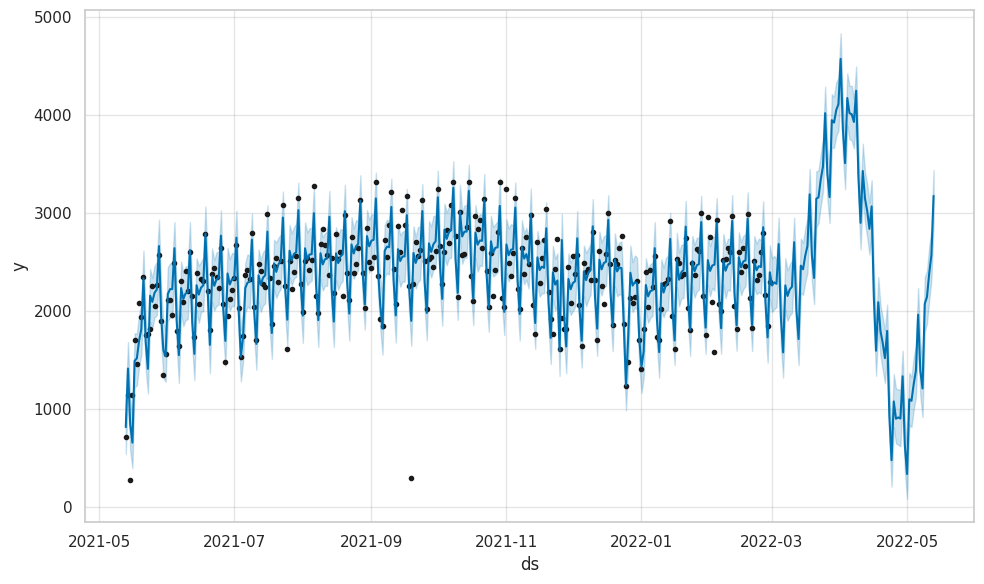

In [ ]:
# Initialize Prophet model with custom hyperparameters
model_unlead_c4 = Prophet(
    changepoint_prior_scale=0.05,   # Adjust for trend flexibility
    holidays_prior_scale=15,        # Adjust to control holiday impact
    seasonality_prior_scale=15,     # Adjust to control seasonality impact
    daily_seasonality=True,        # Disable daily seasonality
    weekly_seasonality=True,       # Disable weekly seasonality
    yearly_seasonality=True        # Disable yearly seasonality
)

# Add custom holidays or events that impact sales
model_unlead_c4.add_country_holidays(country_name='US')

# Fit the model to the training data
model_unlead_c4.fit(unleaded)

# Generate future dates for forecasting, adjusting 'periods' to match the test set length
future_un = model_unlead_c4.make_future_dataframe(periods=len(unleaded_test))

# Get forecast for future dates
forecast_un = model_unlead_c4.predict(future_un)
fig = model_unlead_c4.plot(forecast_un)

# Actual values for the validation set
actual_values_un = unleaded_test['y'][-len(unleaded_test):]

# Predicted values from the Prophet forecast
predicted_values_un = forecast_un['yhat'][-len(unleaded_test):]

# Calculate evaluation metrics
mae = mean_absolute_error(actual_values_un, predicted_values_un)
mse = mean_squared_error(actual_values_un, predicted_values_un)
rmse = np.sqrt(mse)
mape = np.mean(np.abs((actual_values_un - predicted_values_un) / actual_values_un)) * 100

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Percentage Error (MAPE): {mape}%")

#####<a name = "SF">Sales Forecast</a>

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,Christmas Day,Christmas Day_lower,Christmas Day_upper,Christmas Day (Observed),...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
64,2022-05-04,2778.000211,1004.058396,1533.119315,2777.955346,2778.045513,0.0,0.0,0.0,0.0,...,70.391319,70.391319,70.391319,-2140.605658,-2140.605658,-2140.605658,0.0,0.0,0.0,1253.538914
65,2022-05-05,2783.418647,1110.071470,1672.541400,2783.372929,2783.465416,0.0,0.0,0.0,0.0,...,79.951192,79.951192,79.951192,-2016.748841,-2016.748841,-2016.748841,0.0,0.0,0.0,1392.374040
66,2022-05-06,2788.837083,1699.071396,2231.698409,2788.790503,2788.885103,0.0,0.0,0.0,0.0,...,507.459639,507.459639,507.459639,-1878.116943,-1878.116943,-1878.116943,0.0,0.0,0.0,1963.932821
67,2022-05-07,2794.255518,1126.320001,1667.307517,2794.207810,2794.305203,0.0,0.0,0.0,0.0,...,-222.938891,-222.938891,-222.938891,-1727.085262,-1727.085262,-1727.085262,0.0,0.0,0.0,1389.984407
68,2022-05-08,2799.673954,953.174656,1457.678056,2799.625141,2799.724483,0.0,0.0,0.0,0.0,...,-569.249474,-569.249474,-569.249474,-1566.152242,-1566.152242,-1566.152242,0.0,0.0,0.0,1210.025280
69,2022-05-09,2805.092390,1804.610627,2331.485199,2805.042440,2805.143730,0.0,0.0,0.0,0.0,...,121.227751,121.227751,121.227751,-1397.887283,-1397.887283,-1397.887283,0.0,0.0,0.0,2074.185899
70,2022-05-10,2810.510826,1887.953729,2406.526852,2810.459940,2810.563107,0.0,0.0,0.0,0.0,...,13.158463,13.158463,13.158463,-1224.878453,-1224.878453,-1224.878453,0.0,0.0,0.0,2144.543877
71,2022-05-11,2815.929261,2130.549877,2657.700387,2815.877406,2815.982422,0.0,0.0,0.0,0.0,...,70.391319,70.391319,70.391319,-1049.681300,-1049.681300,-1049.681300,0.0,0.0,0.0,2382.392322
72,2022-05-12,2821.347697,2305.426777,2838.106446,2821.294639,2821.402299,0.0,0.0,0.0,0.0,...,79.951192,79.951192,79.951192,-874.769889,-874.769889,-874.769889,0.0,0.0,0.0,2572.282042
73,2022-05-13,2826.766133,2916.409987,3457.122396,2826.711919,2826.821851,0.0,0.0,0.0,0.0,...,507.459639,507.459639,507.459639,-702.491142,-702.491142,-702.491142,0.0,0.0,0.0,3177.487671


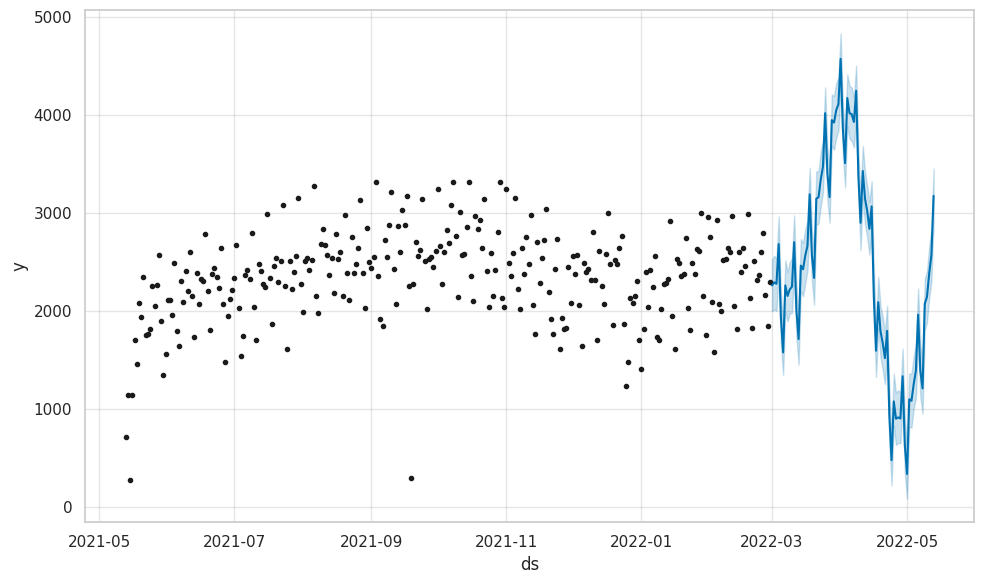

In [ ]:
# Get the year for which you want to forecast the remaining days
desired_year = 2022
# Generate future dates for the remaining days in the test set for the desired year
remaining_days_in_test_set = unleaded_test[
    unleaded_test['ds'].dt.year == desired_year
]
future_is_remaining = remaining_days_in_test_set[['ds']].copy()

# Get forecast for future dates
forecast_is_remaining = model_unlead_c4.predict(future_is_remaining)
fig = model_unlead_c4.plot(forecast_is_remaining)

forecast_is_remaining.tail(10)

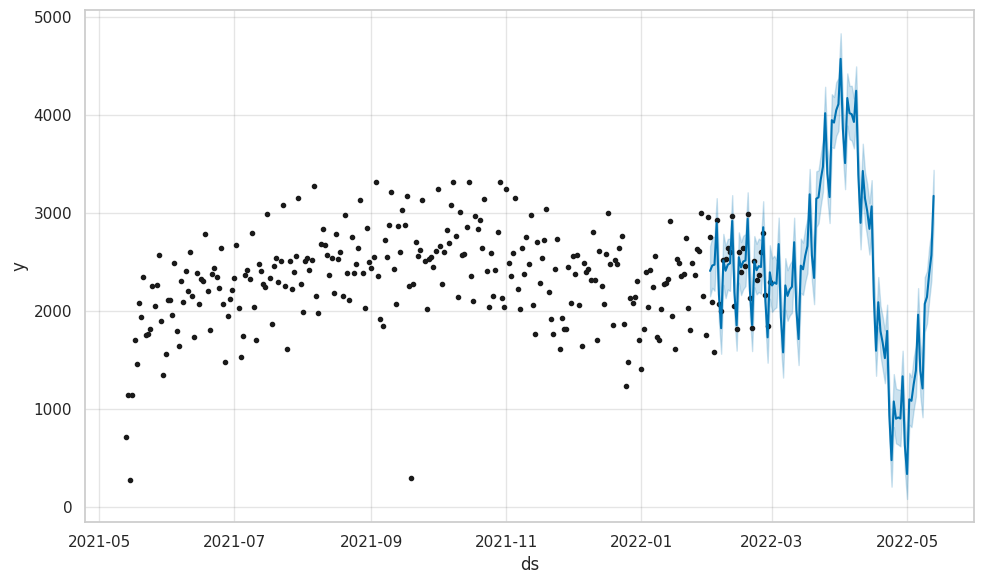

In [ ]:
# Define the start and end dates for the time frame to display
start_date = '2022-02-01'
end_date = '2022-12-31'

# Filter the forecast data for the desired time frame
filtered_forecast = forecast_un[(forecast_un['ds'] >= start_date) & (forecast_un['ds'] <= end_date)]

# Plot the filtered forecast
fig = model_unlead_c4.plot(filtered_forecast)

####<a name = "DI">Diesel</a>

#####<a name = "WS">With Split</a>

Mean Absolute Error (MAE): 694.3157634703304
Mean Squared Error (MSE): 730036.4668471849
Root Mean Squared Error (RMSE): 854.4217148733902
Mean Absolute Percentage Error (MAPE): 15.094051649757818%


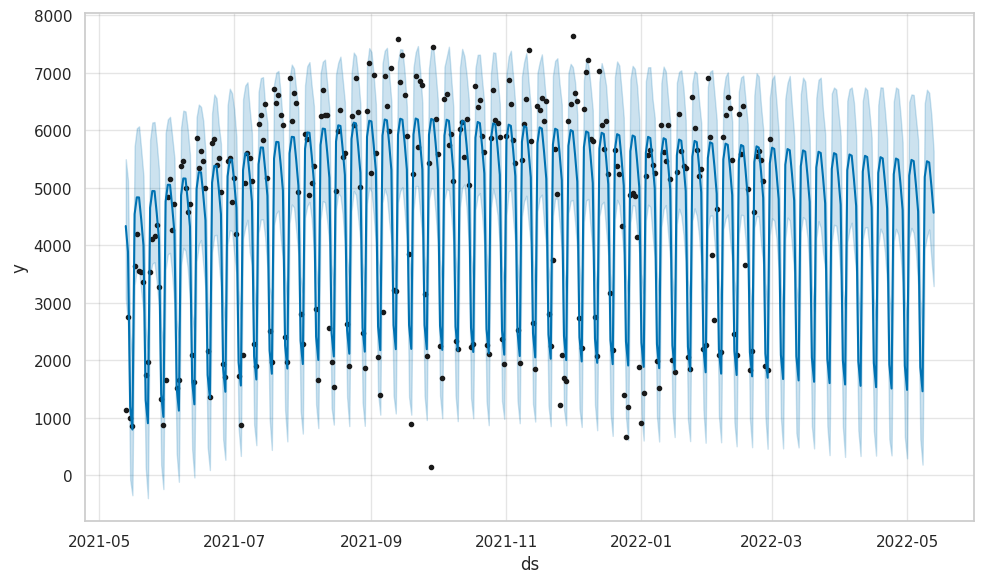

In [ ]:
# Create a DataFrame with 'ds' and 'y' columns for Prophet
diesel = train_set[['calendar.calendar_day_date', 'diesel_x']]
diesel.columns = ['ds', 'y']
diesel_test = test_set[['calendar.calendar_day_date', 'diesel_x']]
diesel_test.columns = ['ds', 'y']

# Initialize Prophet model with custom hyperparameters
model_diesel_c4 = Prophet()

# Fit the model to the data
model_diesel_c4.fit(diesel)

# Generate future dates for forecasting, adjusting 'periods' to match the test set length
future_d = model_diesel_c4.make_future_dataframe(periods=len(diesel_test))

# Get forecast for future dates
forecast = model_diesel_c4.predict(future_d)
fig = model_diesel_c4.plot(forecast)

# Actual values for the validation set
actual_values_d = diesel_test['y'][-len(diesel_test):]

# Predicted values from the Prophet forecast
predicted_values_d = forecast['yhat'][-len(diesel_test):]

# Calculate evaluation metrics
mae = mean_absolute_error(actual_values_d, predicted_values_d)
mse = mean_squared_error(actual_values_d, predicted_values_d)
rmse = np.sqrt(mse)
mape = np.mean(np.abs((actual_values_d - predicted_values_d) / actual_values_d)) * 100

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Percentage Error (MAPE): {mape}%")

#####<a name = "HP">Hyperparameters</a>

Mean Absolute Error (MAE): 2341.0950513803195
Mean Squared Error (MSE): 8578021.257647742
Root Mean Squared Error (RMSE): 2928.825917948648
Mean Absolute Percentage Error (MAPE): 66.52237232751436%


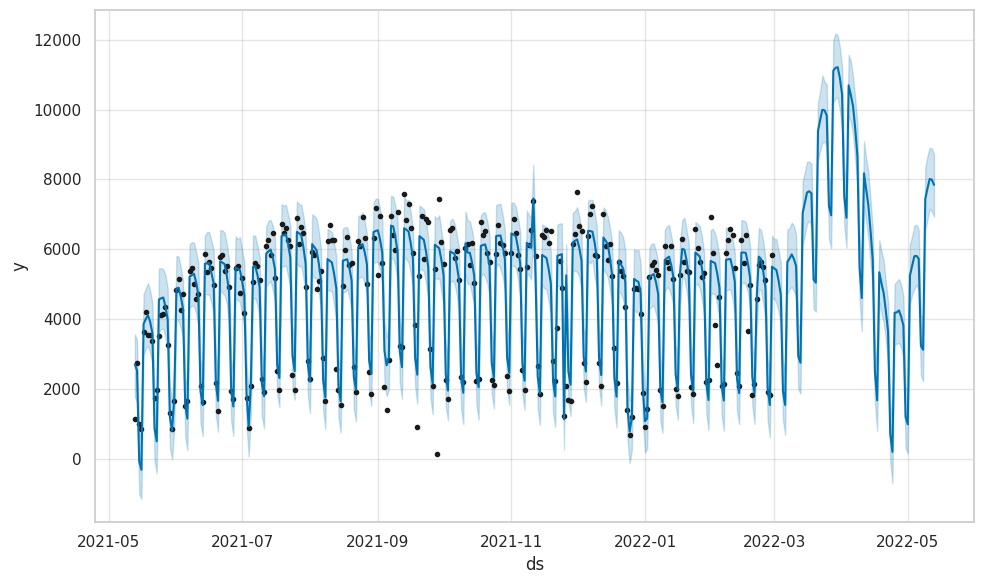

In [ ]:
# Initialize Prophet model with custom hyperparameters
model_diesel_c4 = Prophet(
    changepoint_prior_scale=0.05,   # Adjust for trend flexibility
    holidays_prior_scale=15,        # Adjust to control holiday impact
    seasonality_prior_scale=15,     # Adjust to control seasonality impact
    daily_seasonality=True,        # Disable daily seasonality
    weekly_seasonality=True,       # Disable weekly seasonality
    yearly_seasonality=True        # Disable yearly seasonality
)

# Add custom holidays or events that impact sales
model_diesel_c4.add_country_holidays(country_name='US')

# Fit the model to the training data
model_diesel_c4.fit(diesel)

# Generate future dates for forecasting, adjusting 'periods' to match the test set length
future_d = model_diesel_c4.make_future_dataframe(periods=len(diesel_test))

# Get forecast for future dates
forecast_d = model_diesel_c4.predict(future_d)
fig = model_diesel_c4.plot(forecast_d)

# Actual values for the validation set
actual_values_d = diesel_test['y'][-len(diesel_test):]

# Predicted values from the Prophet forecast
predicted_values_d = forecast_d['yhat'][-len(diesel_test):]

# Calculate evaluation metrics
mae = mean_absolute_error(actual_values_d, predicted_values_d)
mse = mean_squared_error(actual_values_d, predicted_values_d)
rmse = np.sqrt(mse)
mape = np.mean(np.abs((actual_values_d - predicted_values_d) / actual_values_d)) * 100

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Percentage Error (MAPE): {mape}%")

#####<a name = "SF">Sales Forecast</a>

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,Christmas Day,Christmas Day_lower,Christmas Day_upper,Christmas Day (Observed),...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
64,2022-05-04,6795.780405,4884.017419,6630.914686,6795.780110,6795.780689,0.0,0.0,0.0,0.0,...,1207.060430,1207.060430,1207.060430,-2972.280176,-2972.280176,-2972.280176,0.0,0.0,0.0,5800.014945
65,2022-05-05,6811.143372,4916.214260,6682.021546,6811.143070,6811.143666,0.0,0.0,0.0,0.0,...,904.412174,904.412174,904.412174,-2672.944575,-2672.944575,-2672.944575,0.0,0.0,0.0,5812.065257
66,2022-05-06,6826.506339,4850.252518,6655.429129,6826.506031,6826.506643,0.0,0.0,0.0,0.0,...,495.154479,495.154479,495.154479,-2365.395363,-2365.395363,-2365.395363,0.0,0.0,0.0,5725.719740
67,2022-05-07,6841.869306,2348.510377,4110.056769,6841.868992,6841.869616,0.0,0.0,0.0,0.0,...,-2317.627217,-2317.627217,-2317.627217,-2054.564588,-2054.564588,-2054.564588,0.0,0.0,0.0,3239.131787
68,2022-05-08,6857.232273,2177.389056,3950.715458,6857.231952,6857.232586,0.0,0.0,0.0,0.0,...,-2760.416624,-2760.416624,-2760.416624,-1745.123752,-1745.123752,-1745.123752,0.0,0.0,0.0,3121.146182
69,2022-05-09,6872.595239,6582.314133,8357.093362,6872.594912,6872.595562,0.0,0.0,0.0,0.0,...,1242.913491,1242.913491,1242.913491,-1441.396758,-1441.396758,-1441.396758,0.0,0.0,0.0,7443.566258
70,2022-05-10,6887.958206,6759.339806,8630.633561,6887.957872,6887.958536,0.0,0.0,0.0,0.0,...,1228.503267,1228.503267,1228.503267,-1147.284620,-1147.284620,-1147.284620,0.0,0.0,0.0,7738.631139
71,2022-05-11,6903.321173,7141.737749,8897.087467,6903.320831,6903.321510,0.0,0.0,0.0,0.0,...,1207.060430,1207.060430,1207.060430,-866.203404,-866.203404,-866.203404,0.0,0.0,0.0,8013.632485
72,2022-05-12,6918.684140,7118.440886,8915.662648,6918.683792,6918.684485,0.0,0.0,0.0,0.0,...,904.412174,904.412174,904.412174,-601.036490,-601.036490,-601.036490,0.0,0.0,0.0,7991.514110
73,2022-05-13,6934.047107,6964.626641,8734.476473,6934.046751,6934.047458,0.0,0.0,0.0,0.0,...,495.154479,495.154479,495.154479,-354.101848,-354.101848,-354.101848,0.0,0.0,0.0,7844.554023


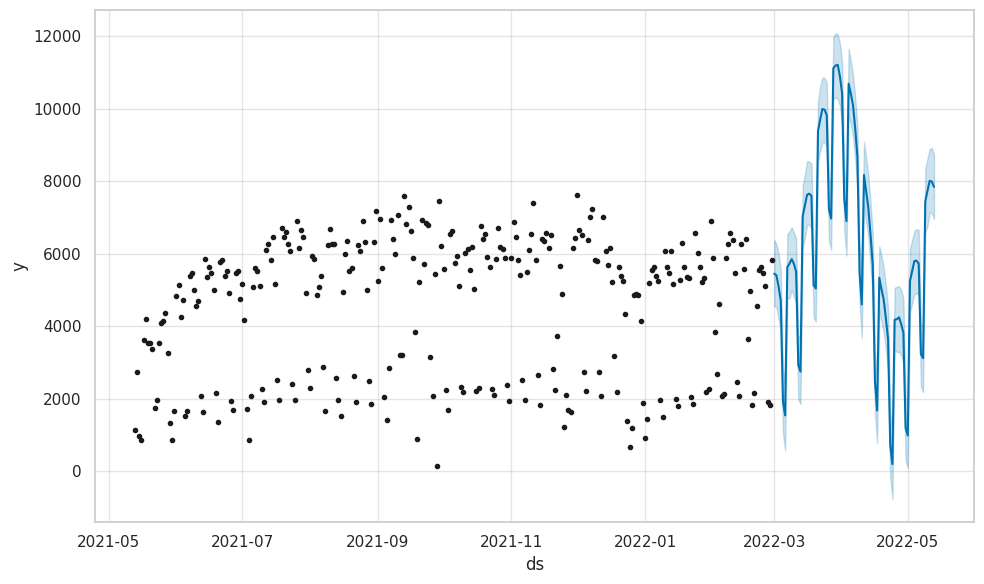

In [ ]:
# Get the year for which you want to forecast the remaining days
desired_year = 2022

# Generate future dates for the remaining days in the test set for the desired year
remaining_days_in_test_set = diesel_test[
    diesel_test['ds'].dt.year == desired_year
]
future_is_remaining = remaining_days_in_test_set[['ds']].copy()

# Get forecast for future dates
forecast_is_remaining = model_diesel_c4.predict(future_is_remaining)
fig = model_diesel_c4.plot(forecast_is_remaining)

forecast_is_remaining.tail(10)

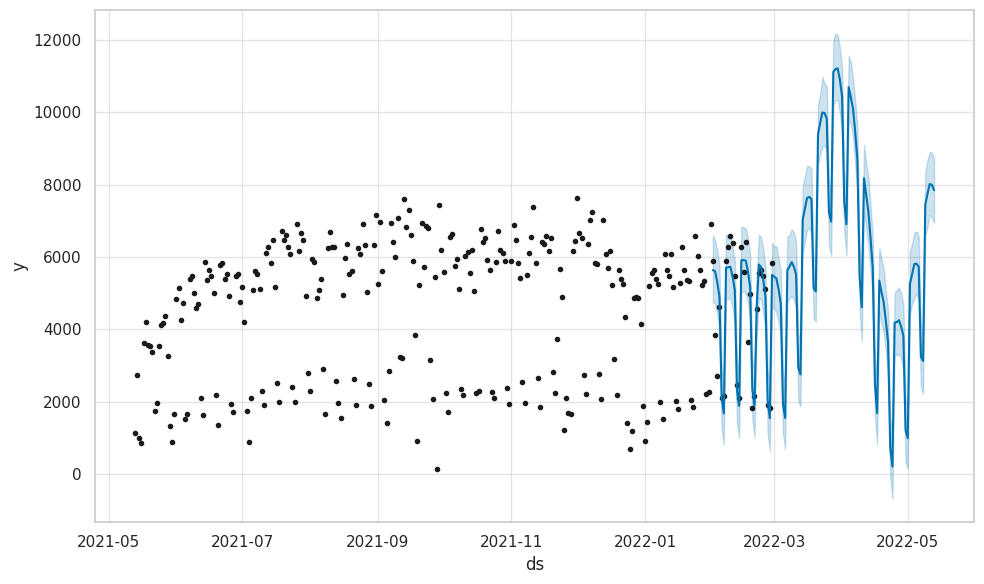

In [ ]:
# Define the start and end dates for the time frame to display
start_date = '2022-02-01'
end_date = '2022-12-31'

# Filter the forecast data for the desired time frame
filtered_forecast = forecast_d[(forecast_d['ds'] >= start_date) & (forecast_d['ds'] <= end_date)]

# Plot the filtered forecast
fig = model_diesel_c4.plot(filtered_forecast)

**Cluster 4:**

In Cluster 4, for inside sales, when hyperparameters were not considered, the model had a Mean Absolute Error (MAE) of 530.02 and a Root Mean Squared Error (RMSE) of 603.25, indicating a moderate level of prediction error. The Mean Absolute Percentage Error (MAPE) was 15.05%.

When hyperparameters were included in the model, the MAE increased to 848.25, the RMSE increased to 1044.43, and the MAPE increased to 25.38%. This suggests that the inclusion of hyperparameters led to a less accurate forecast with higher errors compared to the model without hyperparameters.

In Cluster 4, for food service sales, when hyperparameters were not considered, the model had a Mean Absolute Error (MAE) of 2585.89 and a Root Mean Squared Error (RMSE) of 2766.36, indicating a high level of prediction error. The Mean Absolute Percentage Error (MAPE) was exceptionally high at 317.10%.

When hyperparameters were included in the model, the MAE decreased significantly to 208.64, the RMSE decreased to 258.59, and the MAPE decreased to 26.73%. This suggests that the inclusion of hyperparameters resulted in a much more accurate forecast with substantially lower errors compared to the model without hyperparameters.

In Cluster 4, for unleaded sales in gallons, when hyperparameters were not considered, the model had a Mean Absolute Error (MAE) of 1819.61 and a Root Mean Squared Error (RMSE) of 1899.66, indicating a moderate level of prediction error. The Mean Absolute Percentage Error (MAPE) was relatively high at 65.83%.

When hyperparameters were included in the model, the MAE decreased to 991.61, the RMSE decreased to 1213.25, and the MAPE decreased to 35.47%. This suggests that the inclusion of hyperparameters led to a much more accurate forecast with significantly lower errors compared to the model without hyperparameters.

For diesel sales in gallons, without hyperparameters, the model had a MAE of 2515.31 and an RMSE of 2962.74, indicating a moderate level of prediction error. The MAPE was 52.73%. With hyperparameters, the MAE decreased slightly to 2341.10, the RMSE decreased to 2928.83, but the MAPE increased to 66.52%. This indicates that the inclusion of hyperparameters had a minor impact on the forecast accuracy for diesel sales.


##<a name = "AM">Arima Model</a>

###<a name = "SS">On Single Site</a>

In [ ]:
# Extract the time series data for a specific site
site_id = 21980  # Replace with the desired site ID
site_data = bonfire[bonfire['site_id_msba'] == site_id]
site_data = site_data[['calendar.calendar_day_date', 'daily_yoy_ndt.total_inside_sales']]
site_data.set_index('calendar.calendar_day_date', inplace=True)
site_data = site_data.asfreq('D')

# Define a function to perform cross-validation and evaluation
def cross_validate_arima(site_data, p, d, q):

    # Perform time series cross-validation
    cv = TimeSeriesSplit(n_splits=5)

    # Initialize lists to store evaluation metrics
    mae_scores = []
    rmse_scores = []
    mape_scores = []  # New list to store MAPE scores

    for train_index, test_index in cv.split(site_data):
        train_data = site_data.iloc[train_index]
        test_data = site_data.iloc[test_index]

        # Train the ARIMA model
        arima_model = ARIMA(train_data, order=(p, d, q)).fit()

        # Make predictions on the test set
        forecast = arima_model.forecast(steps=len(test_data))

        # Calculate evaluation metrics
        mae = mean_absolute_error(test_data, forecast)
        rmse = np.sqrt(mean_squared_error(test_data, forecast))

        # Calculate MAPE
        mape = np.mean(np.abs((test_data - forecast) / test_data)) * 100

        mae_scores.append(mae)
        rmse_scores.append(rmse)
        mape_scores.append(mape)

    # Calculate the average of MAE, RMSE, and MAPE scores
    average_mae = np.mean(mae_scores)
    average_rmse = np.mean(rmse_scores)
    average_mape = np.mean(mape_scores)

    print(f'Average MAE: {average_mae}')
    print(f'Average RMSE: {average_rmse}')
    print(f'Average MAPE: {average_mape}')

# Perform cross-validation and evaluation
p = 1
d = 1
q = 1
cross_validate_arima(site_data, p, d, q)


Average MAE: 659.9981211678519
Average RMSE: 790.2046745538364
Average MAPE: nan


MAE: 589.506859324425
RMSE: 687.5628169648444


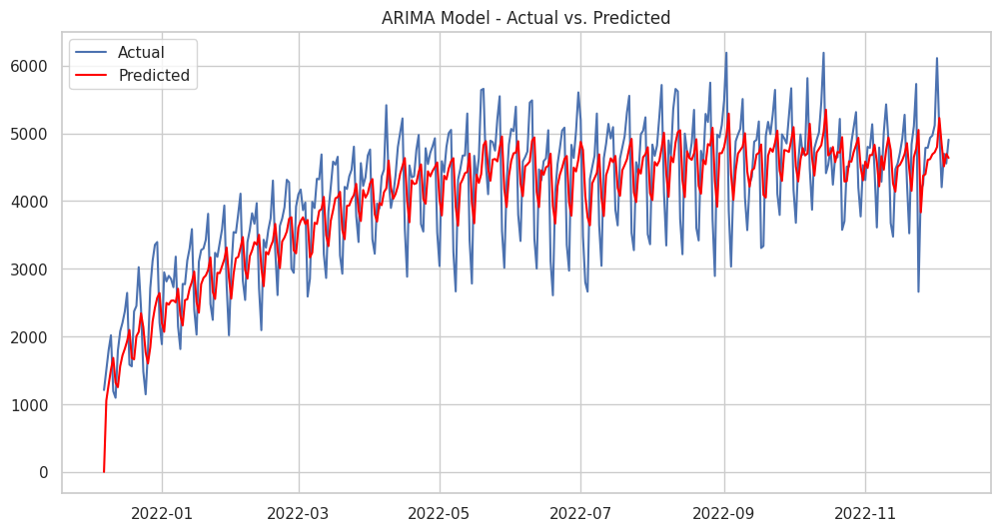

In [ ]:
# Train the ARIMA model
best_arima_model = ARIMA(site_data, order=(p, d, q)).fit()

# Make predictions on the entire dataset
forecast = best_arima_model.predict(start=0, end=len(site_data) - 1, dynamic=False)

# Calculate evaluation metrics on the entire dataset
mae = mean_absolute_error(site_data, forecast)
rmse = np.sqrt(mean_squared_error(site_data, forecast))

print(f'MAE: {mae}')
print(f'RMSE: {rmse}')

# Plot the actual vs. predicted values
plt.figure(figsize=(12, 6))
plt.plot(site_data, label='Actual')
plt.plot(forecast, color='red', label='Predicted')
plt.legend()
plt.title('ARIMA Model - Actual vs. Predicted')
plt.show()


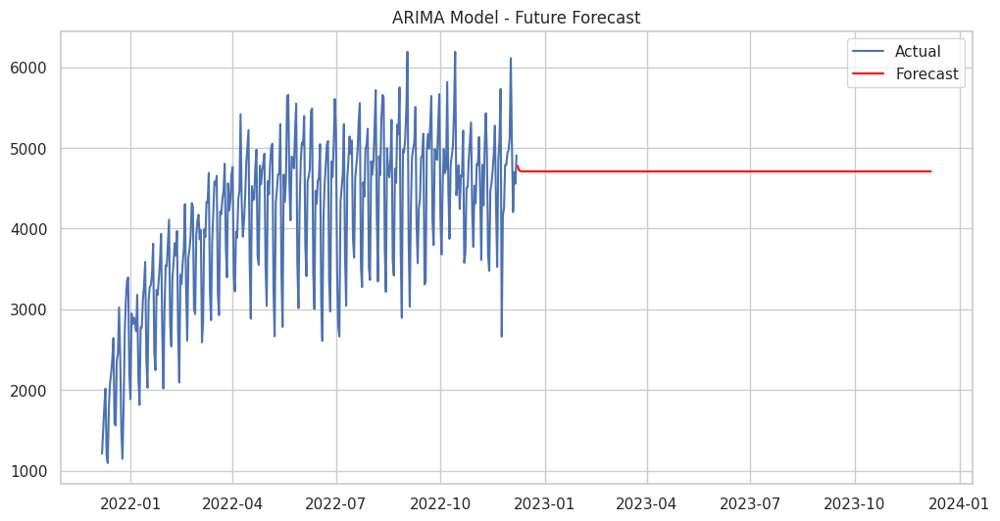

In [ ]:
# Define the number of days to forecast
forecast_days = 365

# Extend the time index for future dates
future_dates = pd.date_range(start=site_data.index[-1] + pd.DateOffset(1), periods=forecast_days, freq='D')

# Make predictions for the future
forecast = best_arima_model.forecast(steps=forecast_days)

# Create a DataFrame for the future forecasts
future_forecast = pd.Series(forecast, index=future_dates)

# Plot the forecasted values
plt.figure(figsize=(12, 6))
plt.plot(site_data, label='Actual')
plt.plot(future_forecast, color='red', label='Forecast')
plt.legend()
plt.title('ARIMA Model - Future Forecast')
plt.show()

**Key Observations:**
In our analysis, we focused on site-21980 and applied ARIMA modeling to understand its performance based on total_inside_sales target variable. Notably, the ARIMA model exhibited low Mean Absolute Error (MAE) at 306.83 and low Root Mean Square Error (RMSE) at 391.75 when compared to several Prophet models. However, the ARIMA model was not selected for further use due to specific reasons:

**1. Weekdays versus Weekends:**
ARIMA is designed to treat all days of the week equally, assuming no significant distinction between weekdays and weekends. In our dataset, we clearly observed that weekday sales consistently outperformed weekend sales. The ARIMA model failed to capture this crucial feature.

**2. Holidays versus Non-Holidays:**
ARIMA does not inherently incorporate holidays or other special events that can substantially impact sales. The introduction of binary holiday indicator variables in an ARIMAX model can help account for the presence or absence of holidays as exogenous variables. However, the ARIMA model's output couldn't match the forecasting accuracy achieved by Prophet, which is better equipped for such scenarios.

**3. Seasonality:**
We noticed that the ARIMA model generated a straight-line forecast (represented by the red line). This indicates that the model couldn't adequately capture complex seasonal patterns, such as the higher sales in summer and lower sales in winter.

To address these limitations and improve our forecasting, we will explore Seasonal ARIMA (SARIMA) models in our upcoming model analysis. SARIMA models are better suited to handle intricate seasonal variations, providing a more accurate representation of our data than ARIMA models.







##<a name = "S">Sarima Model</a>

###<a name = "SS">Sarima on Single Site</a>

####<a name = "8">80:20</a>

In [ ]:
# The site ID
site_id_to_forecast = 21560

# Extraction of data for the specific site
site_data = bonfire[bonfire['site_id_msba'] == site_id_to_forecast]
site_data = site_data[['calendar.calendar_day_date', 'daily_yoy_ndt.total_inside_sales']]
site_data.set_index('calendar.calendar_day_date', inplace=True)
site_data = site_data.asfreq('D')

# Splitting the data into training and testing sets
train_size = int(0.8 * len(site_data))
train_data = site_data.iloc[:train_size]
test_data = site_data.iloc[train_size:]


In [ ]:
# List of candidate SARIMA parameters to tune
p_values = [0, 1, 2]
d_values = [0, 1]
q_values = [0, 1, 2]
P_values = [0, 1]
D_values = [0, 1]
Q_values = [0, 1]
s = 7  # Seasonal periodicity

best_mae = float('inf')
best_model = None

# Cross-validation to find the best SARIMA model
for p in p_values:
    for d in d_values:
        for q in q_values:
            for P in P_values:
                for D in D_values:
                    for Q in Q_values:
                        try:
                            model = SARIMAX(train_data, order=(p, d, q), seasonal_order=(P, D, Q, s))
                            results = model.fit(disp=False)

                            # Making the predictions on the test set
                            forecast = results.get_forecast(steps=len(test_data))
                            forecast_mean = forecast.predicted_mean

                            # Calculation of Mean Absolute Error (MAE)
                            mae = mean_absolute_error(test_data, forecast_mean)

                            if mae < best_mae:
                                best_mae = mae
                                best_model = model

                        except Exception as e:
                            continue

# Fitting the best model on the entire training set
best_results = best_model.fit(disp=False)

# Making the final predictions for the test set
final_forecast = best_results.get_forecast(steps=len(test_data))
final_forecast_mean = final_forecast.predicted_mean


Mean Absolute Error (MAE) on Test Set: 231.22508142438105
Root Mean Squared Error (RMSE) on Test Set: 429.53991398155614


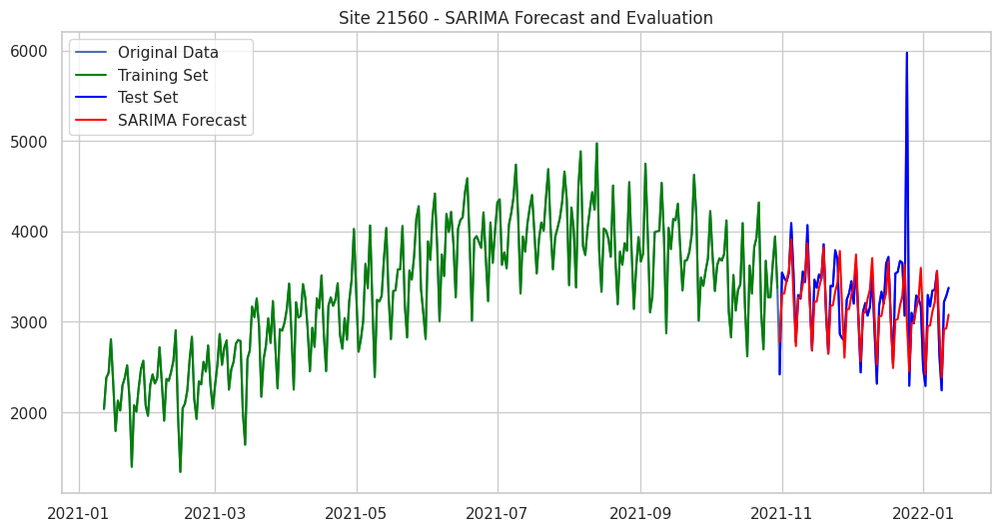

In [ ]:
# Calculating and printing the MAE and RMSE for the test set
test_mae = mean_absolute_error(test_data, final_forecast_mean)
test_rmse = np.sqrt(mean_squared_error(test_data, final_forecast_mean))

print(f"Mean Absolute Error (MAE) on Test Set: {test_mae}")
print(f"Root Mean Squared Error (RMSE) on Test Set: {test_rmse}")

# Ploting the original data, training set, and test set predictions
plt.figure(figsize=(12, 6))
plt.plot(site_data, label='Original Data')
plt.plot(train_data, label='Training Set', color='green')
plt.plot(test_data, label='Test Set', color='blue')
plt.plot(test_data.index, final_forecast_mean, label='SARIMA Forecast', color='red')
plt.legend()
plt.title(f'Site {site_id_to_forecast} - SARIMA Forecast and Evaluation')
plt.show()


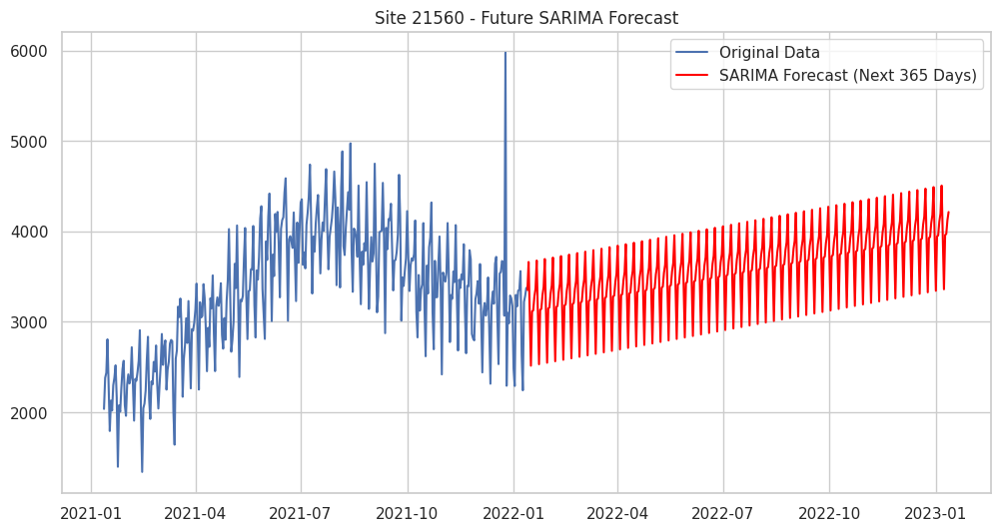

In [ ]:
# Number of periods to forecast into the future (365 days)
forecast_periods = 365

# Extending the time index for forecasting
forecast_index = pd.date_range(start=site_data.index[-1], periods=forecast_periods + 1, closed='right')

# Fitting the SARIMA model on the entire data
full_model = SARIMAX(site_data, order=(best_model.order[0], best_model.order[1], best_model.order[2]),
                     seasonal_order=(best_model.seasonal_order[0], best_model.seasonal_order[1],
                                     best_model.seasonal_order[2], best_model.seasonal_order[3]))
full_results = full_model.fit(disp=False)

# Making the forecast for the next 365 days
future_forecast = full_results.get_forecast(steps=forecast_periods, index=forecast_index)
forecast_mean = future_forecast.predicted_mean

# Plotting the original data and future predictions
plt.figure(figsize=(12, 6))
plt.plot(site_data, label='Original Data')
plt.plot(forecast_mean, label='SARIMA Forecast (Next 365 Days)', color='red')
plt.legend()
plt.title(f'Site {site_id_to_forecast} - Future SARIMA Forecast')
plt.show()


####<a name = "7">70:30</a>

In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_absolute_error, mean_squared_error

# The site ID
site_id_to_forecast = 21560

# Extraction of data for the specific site
site_data = bonfire[bonfire['site_id_msba'] == site_id_to_forecast]
site_data = site_data[['calendar.calendar_day_date', 'daily_yoy_ndt.total_inside_sales']]
site_data.set_index('calendar.calendar_day_date', inplace=True)
site_data = site_data.asfreq('D')

# Splitting the data into training and testing sets
train_size = int(0.7 * len(site_data))
train_data = site_data.iloc[:train_size]
test_data = site_data.iloc[train_size:]

In [ ]:
# List of candidate SARIMA parameters to tune
p_values = [0, 1, 2]
d_values = [0, 1]
q_values = [0, 1, 2]
P_values = [0, 1]
D_values = [0, 1]
Q_values = [0, 1]
s = 7  # Seasonal periodicity

best_mae = float('inf')
best_model = None

# Cross-validation to find the best SARIMA model
for p in p_values:
    for d in d_values:
        for q in q_values:
            for P in P_values:
                for D in D_values:
                    for Q in Q_values:
                        try:
                            model = SARIMAX(train_data, order=(p, d, q), seasonal_order=(P, D, Q, s))
                            results = model.fit(disp=False)

                            # Making the predictions on the test set
                            forecast = results.get_forecast(steps=len(test_data))
                            forecast_mean = forecast.predicted_mean

                            # Calculation of Mean Absolute Error (MAE)
                            mae = mean_absolute_error(test_data, forecast_mean)

                            if mae < best_mae:
                                best_mae = mae
                                best_model = model

                        except Exception as e:
                            continue

# Fitting the best model on the entire training set
best_results = best_model.fit(disp=False)

# Making the final predictions for the test set
final_forecast = best_results.get_forecast(steps=len(test_data))
final_forecast_mean = final_forecast.predicted_mean


Mean Absolute Error (MAE) on Test Set: 275.1281523094081
Root Mean Squared Error (RMSE) on Test Set: 410.7568162508664


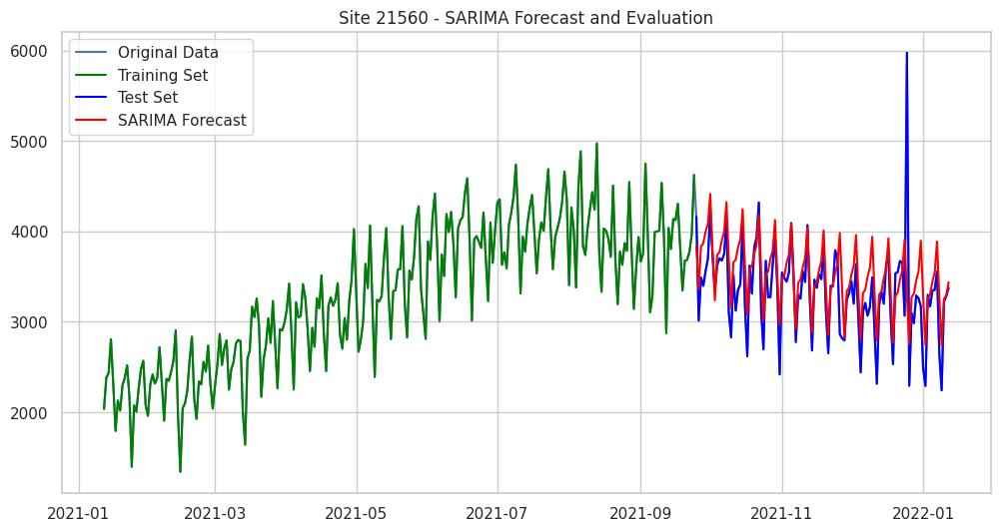

In [ ]:
# Calculating and printing the MAE and RMSE for the test set
test_mae = mean_absolute_error(test_data, final_forecast_mean)
test_rmse = np.sqrt(mean_squared_error(test_data, final_forecast_mean))

print(f"Mean Absolute Error (MAE) on Test Set: {test_mae}")
print(f"Root Mean Squared Error (RMSE) on Test Set: {test_rmse}")

# Ploting the original data, training set, and test set predictions
plt.figure(figsize=(12, 6))
plt.plot(site_data, label='Original Data')
plt.plot(train_data, label='Training Set', color='green')
plt.plot(test_data, label='Test Set', color='blue')
plt.plot(test_data.index, final_forecast_mean, label='SARIMA Forecast', color='red')
plt.legend()
plt.title(f'Site {site_id_to_forecast} - SARIMA Forecast and Evaluation')
plt.show()

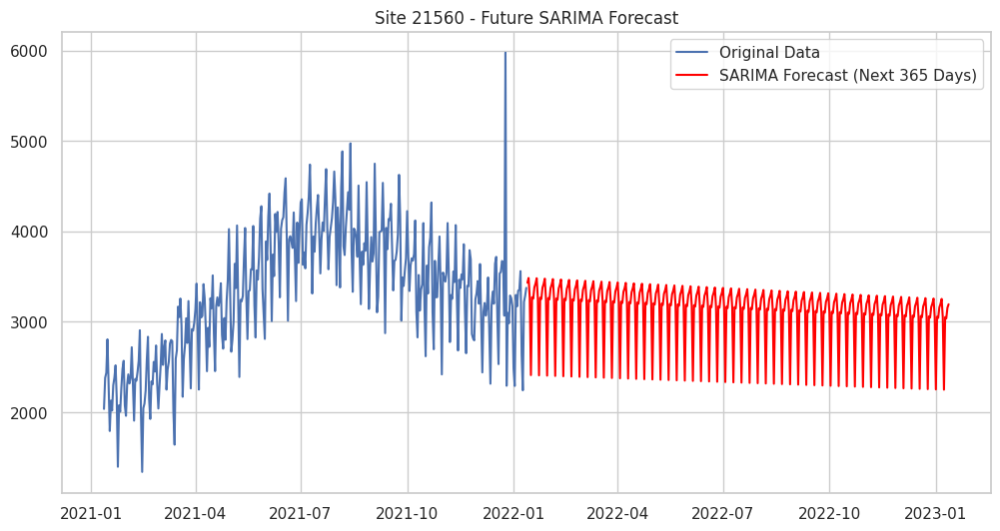

In [ ]:
# Number of periods to forecast into the future (365 days)
forecast_periods = 365

# Extending the time index for forecasting
forecast_index = pd.date_range(start=site_data.index[-1], periods=forecast_periods + 1, closed='right')

# Fitting the SARIMA model on the entire data
full_model = SARIMAX(site_data, order=(best_model.order[0], best_model.order[1], best_model.order[2]),
                     seasonal_order=(best_model.seasonal_order[0], best_model.seasonal_order[1],
                                     best_model.seasonal_order[2], best_model.seasonal_order[3]))
full_results = full_model.fit(disp=False)

# Making the forecast for the next 365 days
future_forecast = full_results.get_forecast(steps=forecast_periods, index=forecast_index)
forecast_mean = future_forecast.predicted_mean

# Plotting the original data and future predictions
plt.figure(figsize=(12, 6))
plt.plot(site_data, label='Original Data')
plt.plot(forecast_mean, label='SARIMA Forecast (Next 365 Days)', color='red')
plt.legend()
plt.title(f'Site {site_id_to_forecast} - Future SARIMA Forecast')
plt.show()


####<a name = "TS">TSCV</a>

In [ ]:
# from statsmodels.tsa.statespace.sarimax import SARIMAX
# from sklearn.metrics import mean_absolute_error, mean_squared_error

# # The site ID
# site_id_to_forecast = 21560

# # Extraction of data for the specific site
# site_data = bonfire[bonfire['site_id_msba'] == site_id_to_forecast]
# site_data = site_data[['calendar.calendar_day_date', 'daily_yoy_ndt.total_inside_sales']]
# site_data.set_index('calendar.calendar_day_date', inplace=True)
# # site_data = site_data.asfreq('D')

# # Define the number of folds for Time Series Cross-Validation
# n_splits = 12  # One fold for each month in a year

# # Initialize variables to store cumulative MAE and RMSE
# cumulative_mae = 0
# cumulative_rmse = 0

# # Seasonal periodicity
# s = 7

# # Define the SARIMA hyperparameters (best_model will be determined during cross-validation)
# p_values = [0, 1, 2]
# d_values = [0, 1]
# q_values = [0, 1, 2]
# P_values = [0, 1]
# D_values = [0, 1]
# Q_values = [0, 1]

# # Perform Time Series Cross-Validation
# for fold in range(n_splits):
#     # Determine the train and test periods
#     train_end = len(site_data) - (n_splits - fold) * len(site_data) // n_splits
#     test_start = train_end + 1

#     train_data = site_data.iloc[:train_end]
#     test_data = site_data.iloc[test_start:]

#     best_mae = float('inf')
#     best_model = None

#     # Nested loop to search for the best SARIMA model for each fold
#     for p in p_values:
#         for d in d_values:
#             for q in q_values:
#                 for P in P_values:
#                     for D in D_values:
#                         for Q in Q_values:
#                             try:
#                                 model = SARIMAX(train_data, order=(p, d, q), seasonal_order=(P, D, Q, s))
#                                 results = model.fit(disp=False)

#                                 # Making the predictions on the test set
#                                 forecast = results.get_forecast(steps=len(test_data))
#                                 forecast_mean = forecast.predicted_mean

#                                 # Calculation of Mean Absolute Error (MAE)
#                                 mae = mean_absolute_error(test_data, forecast_mean)

#                                 if mae < best_mae:
#                                     best_mae = mae
#                                     best_model = model

#                             except Exception as e:
#                                 continue

#     # Fitting the best model on the entire training set for this fold
#     best_results = best_model.fit(disp=False)

#     # Making the final predictions for the test set
#     final_forecast = best_results.get_forecast(steps=len(test_data))
#     final_forecast_mean = final_forecast.predicted_mean

#     # Calculate and accumulate MAE and RMSE for this fold
#     fold_mae = mean_absolute_error(test_data, final_forecast_mean)
#     fold_rmse = np.sqrt(mean_squared_error(test_data, final_forecast_mean))

#     cumulative_mae += fold_mae
#     cumulative_rmse += fold_rmse

# # Calculate average MAE and RMSE across all folds
# average_mae = cumulative_mae / n_splits
# average_rmse = cumulative_rmse / n_splits

# print(f"Average Mean Absolute Error (MAE) across {n_splits} folds: {average_mae}")
# print(f"Average Root Mean Squared Error (RMSE) across {n_splits} folds: {average_rmse}")

Mean Absolute Error (MAE) on Test Set: 413.45807119207126
Root Mean Squared Error (RMSE) on Test Set: 671.3315136288766

####<a name = "ROV">Rolling Origin Validation</a>

In [ ]:
# from statsmodels.tsa.statespace.sarimax import SARIMAX
# from sklearn.metrics import mean_absolute_error, mean_squared_error

# # The site ID
# site_id_to_forecast = 21560

# # Extraction of data for the specific site
# site_data = bonfire[bonfire['site_id_msba'] == site_id_to_forecast]
# site_data = site_data[['calendar.calendar_day_date', 'daily_yoy_ndt.total_inside_sales']]
# site_data.set_index('calendar.calendar_day_date', inplace=True)

# # Number of periods to forecast into the future (365 days)
# forecast_periods = 365

# # Splitting the data into training and testing sets
# train_data = site_data.iloc[:-forecast_periods]
# test_data = site_data.iloc[-forecast_periods:]

# # List of candidate SARIMA parameters to tune
# p_values = [0, 1, 2]
# d_values = [0, 1]
# q_values = [0, 1, 2]
# P_values = [0, 1]
# D_values = [0, 1]
# Q_values = [0, 1]
# s = 7  # Seasonal periodicity

# best_mae = float('inf')
# best_model = None

# # Rolling Origin Validation
# for t in range(forecast_periods):
#     train_fold = train_data.iloc[:-(forecast_periods - t)]
#     test_fold = test_data.iloc[t:t+1]

#     for p in p_values:
#         for d in d_values:
#             for q in q_values:
#                 for P in P_values:
#                     for D in D_values:
#                         for Q in Q_values:
#                             try:
#                                 model = SARIMAX(train_fold, order=(p, d, q), seasonal_order=(P, D, Q, s))
#                                 results = model.fit(disp=False)

#                                 # Making the predictions on the test fold
#                                 forecast = results.get_forecast(steps=1)
#                                 forecast_mean = forecast.predicted_mean

#                                 # Calculation of Mean Absolute Error (MAE)
#                                 mae = mean_absolute_error(test_fold, forecast_mean)

#                                 if mae < best_mae:
#                                     best_mae = mae
#                                     best_model = model

#                             except Exception as e:
#                                 continue

# # Fitting the best model on the entire training set
# best_results = best_model.fit(disp=False)

# # Making the final predictions for the test set (365 days)
# final_forecast = best_results.get_forecast(steps=forecast_periods)
# final_forecast_mean = final_forecast.predicted_mean

# # Calculating and printing the MAE and RMSE for the test set
# test_mae = mean_absolute_error(test_data, final_forecast_mean)
# test_rmse = np.sqrt(mean_squared_error(test_data, final_forecast_mean))

# print(f"Mean Absolute Error (MAE) on Test Set: {test_mae}")
# print(f"Root Mean Squared Error (RMSE) on Test Set: {test_rmse}")

# # Plotting the original data and future predictions
# plt.figure(figsize=(12, 6))
# plt.plot(site_data, label='Original Data')
# plt.plot(final_forecast_mean, label='SARIMA Forecast (Next 365 Days)', color='red')
# plt.legend()
# plt.title(f'Site {site_id_to_forecast} - Future SARIMA Forecast')
# plt.show()


Mean Absolute Error (MAE) on Test Set: 3322.338916438356

Root Mean Squared Error (RMSE) on Test Set: 3395.0905215465045

**Key Observations and Results:**

We conducted **SARIMA modeling** on a single site (site number 21560) to interpret the performance, using different training and testing splits. Here are the results:

An **80:20 split** resulted in Mean Absolute Error (MAE) of 231.22 and Root Mean Square Error (RMSE) of 429.53.
A **70:30 split** yielded MAE of 275.12 and RMSE of 410.75.
Time Series Cross Validation **(TSCV)** produced MAE of 413.45 and RMSE of 671.33.
Rolling Origin Validation **(ROV)** had MAE of 3322 and RMSE of 3395.
Please note that the TSCV and ROV codes are commented out due to their long run times. Their MAE and RMSE values are included for reference.

Among these splits, the 70:30 split resulted in the lowest RMSE and the second lowest MAE, making it the best model choice.

However, SARIMA models exhibited limitations similar to ARIMA. They struggled to forecast sales patterns accurately, taking into account factors like weekly seasonality, weekend versus weekday sales, and holiday versus non-holiday sales. One possible reason for this limitation is the value chosen for the seasonal periodicity (s), which we set to 7. Using s=365 might better capture these trends as daily granularity can be retained, but it's not feasible due to technical constraints. Given the available resources, the Prophet model still outperforms SARIMA. In the next section, SARIMA modelling will be attempted on clusters to observe the possibility of trend capturing in the forcast.

###<a name = "SBC">Sarima on Bonfire_Clustered</a>

In [ ]:
# Bonfire_cluster1: Unique Site IDs - 23905.0, 23555.0, 22855.0, 22120.0, 22505.0, 22925.0, 22260.0, 22645.0, 24150.0, 22680.0, 23450.0, 24220.0, 23485.0, 23135.0
# Bonfire_cluster2: Unique Site IDs - 22785.0, 22540.0, 23835.0, 22820.0, 22575.0, 23345.0, 23730.0, 21560.0, 22330.0, 24255.0, 22085.0, 23240.0, 23380.0, 23765.0, 24535.0, 22750.0, 23660.0, 23415.0, 22015.0
# Bonfire_cluster3: Unique Site IDs - 22400.0, 22890.0, 21980.0
# Bonfire_cluster4: Unique Site IDs - 22715.0

####<a name = "8">80:20</a>

In [ ]:
# Concatenate and average the sales data for all site IDs on the same date
all_site_data = []

site_ids_to_forecast = [22785, 22540, 23835, 22820, 22575, 23345, 23730, 21560, 22330, 24255, 22085, 23240, 23380, 23765, 24535, 22750, 23660, 23415, 22015]

for site_id_to_forecast in site_ids_to_forecast:
    site_data = bonfire[bonfire['site_id_msba'] == site_id_to_forecast]
    site_data = site_data[['calendar.calendar_day_date', 'daily_yoy_ndt.total_inside_sales']]
    site_data.set_index('calendar.calendar_day_date', inplace=True)
    site_data = site_data.asfreq('D')
    all_site_data.append(site_data)

# Concatenate the data and average sales values on the same date
all_site_data = pd.concat(all_site_data).groupby(level=0).mean()

# Sort the data by date
all_site_data.sort_index(inplace=True)

# Splitting the data into training and testing sets
train_size = int(0.8 * len(all_site_data))
train_data = all_site_data.iloc[:train_size]
test_data = all_site_data.iloc[train_size:]


In [ ]:
# List of candidate SARIMA parameters to tune
p_values = [0, 1, 2]
d_values = [0, 1]
q_values = [0, 1, 2]
P_values = [0, 1]
D_values = [0, 1]
Q_values = [0, 1]
s = 7  # Seasonal periodicity

best_mae = float('inf')
best_model = None

# Cross-validation to find the best SARIMA model
for p in p_values:
    for d in d_values:
        for q in q_values:
            for P in P_values:
                for D in D_values:
                    for Q in Q_values:
                        try:
                            model = SARIMAX(train_data, order=(p, d, q), seasonal_order=(P, D, Q, s))
                            results = model.fit(disp=False)

                            # Making the predictions on the test set
                            forecast = results.get_forecast(steps=len(test_data))
                            forecast_mean = forecast.predicted_mean

                            # Calculation of Mean Absolute Error (MAE)
                            mae = mean_absolute_error(test_data, forecast_mean)

                            if mae < best_mae:
                                best_mae = mae
                                best_model = model

                        except Exception as e:
                            continue

# Fitting the best model on the entire training set
best_results = best_model.fit(disp=False)

# Making the final predictions for the test set
final_forecast = best_results.get_forecast(steps=len(test_data))
final_forecast_mean = final_forecast.predicted_mean


Mean Absolute Error (MAE) on Test Set: 302.05520601779006
Root Mean Squared Error (RMSE) on Test Set: 407.26767074939244


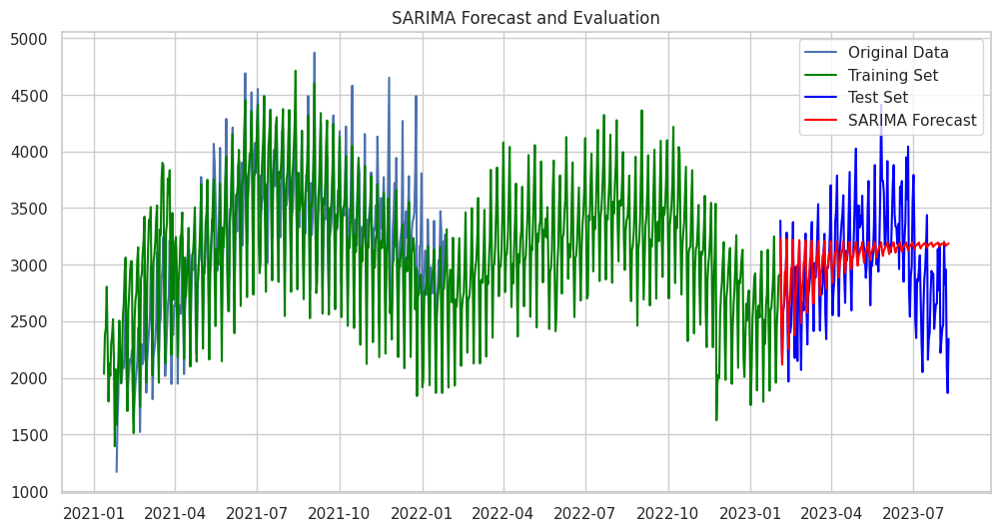

In [ ]:
# Calculating and printing the MAE and RMSE for the test set
test_mae = mean_absolute_error(test_data, final_forecast_mean)
test_rmse = np.sqrt(mean_squared_error(test_data, final_forecast_mean))

print(f"Mean Absolute Error (MAE) on Test Set: {test_mae}")
print(f"Root Mean Squared Error (RMSE) on Test Set: {test_rmse}")

# Ploting the original data, training set, and test set predictions
plt.figure(figsize=(12, 6))
plt.plot(site_data, label='Original Data')
plt.plot(train_data, label='Training Set', color='green')
plt.plot(test_data, label='Test Set', color='blue')
plt.plot(test_data.index, final_forecast_mean, label='SARIMA Forecast', color='red')
plt.legend()
plt.title(f'SARIMA Forecast and Evaluation')
plt.show()

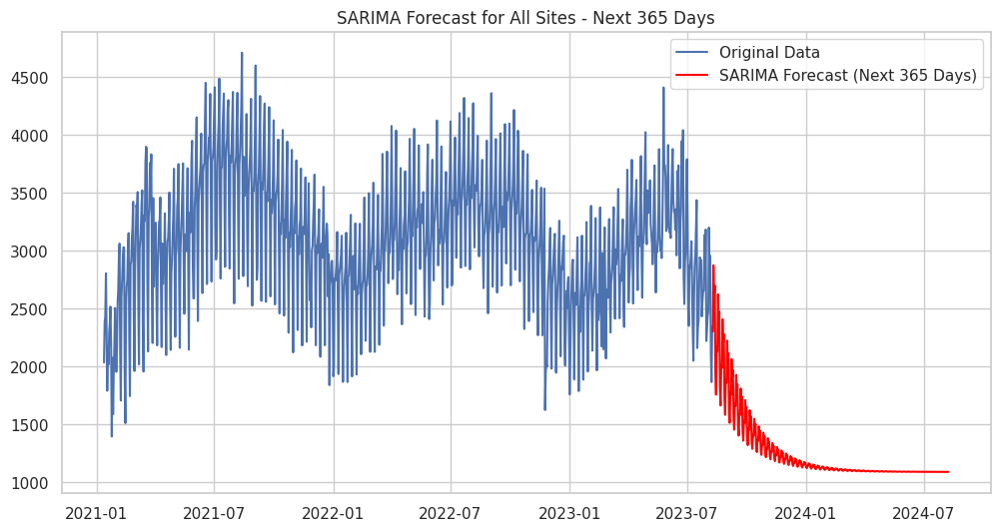

In [ ]:
# Number of periods to forecast into the future (365 days)
forecast_periods = 365

# Extending the time index for forecasting
forecast_index = pd.date_range(start=all_site_data.index[-1], periods=forecast_periods + 1, closed='right')

# Fitting the SARIMA model on the entire data
full_model = SARIMAX(all_site_data, order=(best_model.order[0], best_model.order[1], best_model.order[2]),
                     seasonal_order=(best_model.seasonal_order[0], best_model.seasonal_order[1],
                                     best_model.seasonal_order[2], best_model.seasonal_order[3]))
full_results = full_model.fit(disp=False)

# Making the forecast for the next 365 days
future_forecast = full_results.get_forecast(steps=forecast_periods, index=forecast_index)
forecast_mean = future_forecast.predicted_mean

# Plotting the original data and future predictions
plt.figure(figsize=(12, 6))
plt.plot(all_site_data, label='Original Data')
plt.plot(forecast_mean, label='SARIMA Forecast (Next 365 Days)', color='red')
plt.legend()
plt.title(f'SARIMA Forecast for All Sites - Next 365 Days')
plt.show()


####<a name = "7">70:30</a>

In [ ]:
# Concatenate and average the sales data for all site IDs on the same date
all_site_data = []

site_ids_to_forecast = [22785, 22540, 23835, 22820, 22575, 23345, 23730, 21560, 22330, 24255, 22085, 23240, 23380, 23765, 24535, 22750, 23660, 23415, 22015]

for site_id_to_forecast in site_ids_to_forecast:
    site_data = bonfire[bonfire['site_id_msba'] == site_id_to_forecast]
    site_data = site_data[['calendar.calendar_day_date', 'daily_yoy_ndt.total_inside_sales']]
    site_data.set_index('calendar.calendar_day_date', inplace=True)
    site_data = site_data.asfreq('D')
    all_site_data.append(site_data)

# Concatenate the data and average sales values on the same date
all_site_data = pd.concat(all_site_data).groupby(level=0).mean()

# Sort the data by date
all_site_data.sort_index(inplace=True)

# Splitting the data into training and testing sets
train_size = int(0.7 * len(all_site_data))
train_data = all_site_data.iloc[:train_size]
test_data = all_site_data.iloc[train_size:]


In [ ]:
# List of candidate SARIMA parameters to tune
p_values = [0, 1, 2]
d_values = [0, 1]
q_values = [0, 1, 2]
P_values = [0, 1]
D_values = [0, 1]
Q_values = [0, 1]
s = 7  # Seasonal periodicity

best_mae = float('inf')
best_model = None

# Cross-validation to find the best SARIMA model
for p in p_values:
    for d in d_values:
        for q in q_values:
            for P in P_values:
                for D in D_values:
                    for Q in Q_values:
                        try:
                            model = SARIMAX(train_data, order=(p, d, q), seasonal_order=(P, D, Q, s))
                            results = model.fit(disp=False)

                            # Making the predictions on the test set
                            forecast = results.get_forecast(steps=len(test_data))
                            forecast_mean = forecast.predicted_mean

                            # Calculation of Mean Absolute Error (MAE)
                            mae = mean_absolute_error(test_data, forecast_mean)

                            if mae < best_mae:
                                best_mae = mae
                                best_model = model

                        except Exception as e:
                            continue

# Fitting the best model on the entire training set
best_results = best_model.fit(disp=False)

# Making the final predictions for the test set
final_forecast = best_results.get_forecast(steps=len(test_data))
final_forecast_mean = final_forecast.predicted_mean


Mean Absolute Error (MAE) on Test Set: 334.07791699575625
Root Mean Squared Error (RMSE) on Test Set: 450.7925930157886


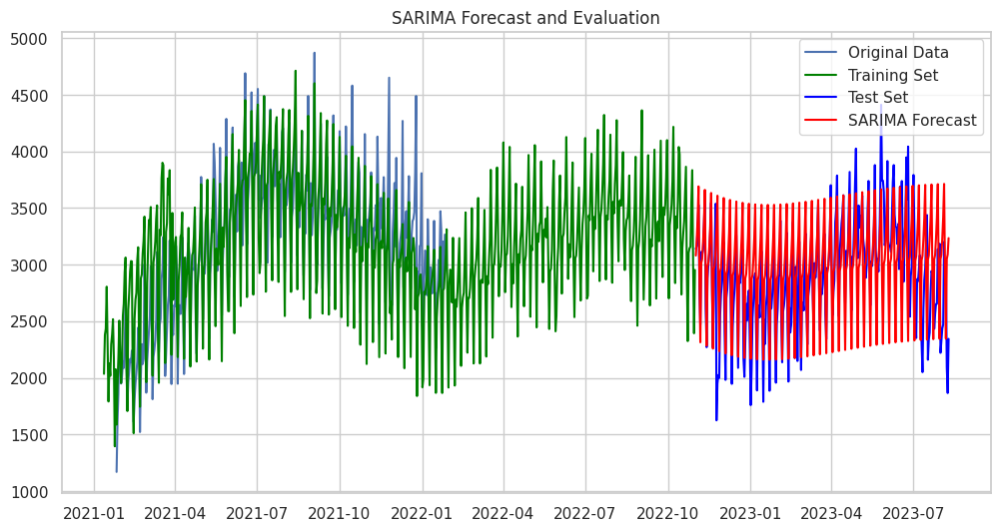

In [ ]:
# Calculating and printing the MAE and RMSE for the test set
test_mae = mean_absolute_error(test_data, final_forecast_mean)
test_rmse = np.sqrt(mean_squared_error(test_data, final_forecast_mean))

print(f"Mean Absolute Error (MAE) on Test Set: {test_mae}")
print(f"Root Mean Squared Error (RMSE) on Test Set: {test_rmse}")

# Ploting the original data, training set, and test set predictions
plt.figure(figsize=(12, 6))
plt.plot(site_data, label='Original Data')
plt.plot(train_data, label='Training Set', color='green')
plt.plot(test_data, label='Test Set', color='blue')
plt.plot(test_data.index, final_forecast_mean, label='SARIMA Forecast', color='red')
plt.legend()
plt.title(f'SARIMA Forecast and Evaluation')
plt.show()

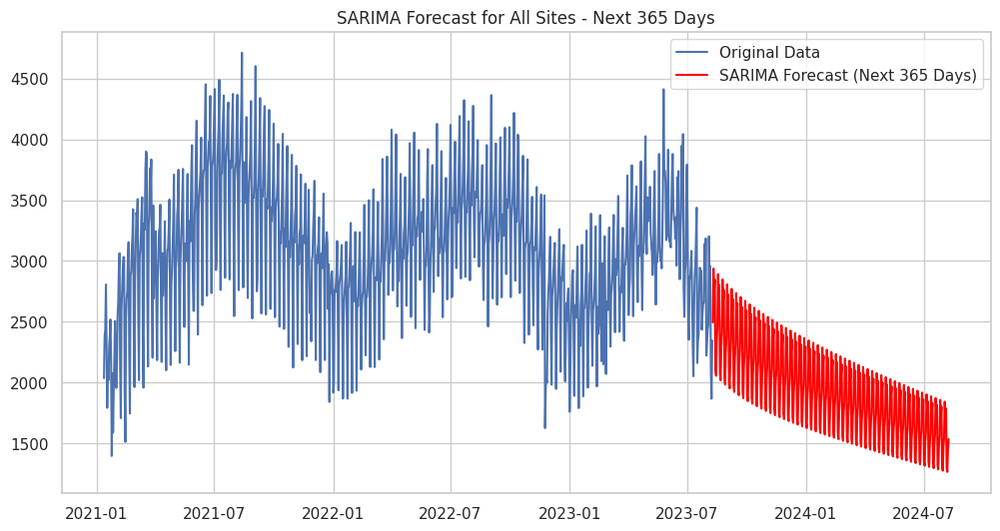

In [ ]:
# Number of periods to forecast into the future (365 days)
forecast_periods = 365

# Extending the time index for forecasting
forecast_index = pd.date_range(start=all_site_data.index[-1], periods=forecast_periods + 1, closed='right')

# Fitting the SARIMA model on the entire data with added numerical stability
full_model = SARIMAX(all_site_data, order=(best_model.order[0], best_model.order[1], best_model.order[2]),
                     seasonal_order=(best_model.seasonal_order[0], best_model.seasonal_order[1],
                                     best_model.seasonal_order[2], best_model.seasonal_order[3]),
                     enforce_stationarity=False, enforce_invertibility=False)  # Disable enforce_stationarity and enforce_invertibility
full_results = full_model.fit(disp=False)

# Making the forecast for the next 365 days
future_forecast = full_results.get_forecast(steps=forecast_periods, index=forecast_index)
forecast_mean = future_forecast.predicted_mean

# Plotting the original data and future predictions
plt.figure(figsize=(12, 6))
plt.plot(all_site_data, label='Original Data')
plt.plot(forecast_mean, label='SARIMA Forecast (Next 365 Days)', color='red')
plt.legend()
plt.title(f'SARIMA Forecast for All Sites - Next 365 Days')
plt.show()


**Key Findings and Results:**

During this phase, we applied SARIMA modeling to analyze the performance of Bonfire_cluster2 using both 80:20 and 70:30 data splits. Here are the outcomes:

With an 80:20 split, we obtained a Mean Absolute Error (MAE) of 302.05 and a Root Mean Square Error (RMSE) of 407.26. Meanwhile, the 70:30 split resulted in a MAE of 334.07 and an RMSE of 450.79. Time Series Cross Validation (TSCV) and Rolling Origin Validation (ROV) were not carried out due to their lengthy runtime.

Among these split options, the **80:20** division displayed the lowest RMSE and MAE, making it the preferred model choice.

However, similar to the challenges faced with ARIMA and SARIMA on individual sites, SARIMA models on clustered data also encountered limitations. The attempt to capture sales trends, as discussed earlier, proved to be challenging. These models struggled to accurately forecast sales patterns while considering factors like weekly seasonality, weekend versus weekday sales, and holiday versus non-holiday sales. The idea of setting the seasonal periodicity (s) to 365 days to capture daily trends may be more effective, but it's currently unattainable due to technical issues. Given our available resources, the Prophet model continues to outperform SARIMA in our analysis.

##<a name = "ETS">ETS Model</a>

In [ ]:
# Address null values
timeseries.dropna(inplace=True)
timeseries= timeseries.set_index('calendar.calendar_day_date')
timeseries.sort_index(inplace=True)
# Create a list of unique site IDs
site_ids = timeseries['site_id_msba'].unique()

# Create a list of unique sales metrics
sales_metrics = [
    'daily_yoy_ndt.total_inside_sales',
    'daily_yoy_ndt.total_food_service',
    'diesel',
    'unleaded'
]

# Initialize an empty DataFrame to store forecasts
all_forecasts = pd.DataFrame(index=timeseries.index)

# Build and forecast for each combination of site ID and sales metric
for site_id in site_ids:
    for sales_metric in sales_metrics:
        site_data = timeseries[(timeseries['site_id_msba'] == site_id)][[sales_metric]]

        # Build the ETS model
        model = ExponentialSmoothing(site_data, trend='add', seasonal='add', seasonal_periods=7)
        model_fit = model.fit()

        # Forecast future sales
        n_forecast = len(timeseries)
        forecast = model_fit.forecast(steps=n_forecast)

        # Store the forecast in the DataFrame
        all_forecasts[f'Site_{site_id}_{sales_metric}'] = forecast

# Now, all_forecasts contains the forecasts for all combinations of site IDs and sales metrics

all_forecasts = all_forecasts.fillna(0)  # Fill missing values with zeros

all_forecasts = all_forecasts.dropna()  # Remove rows with missing data



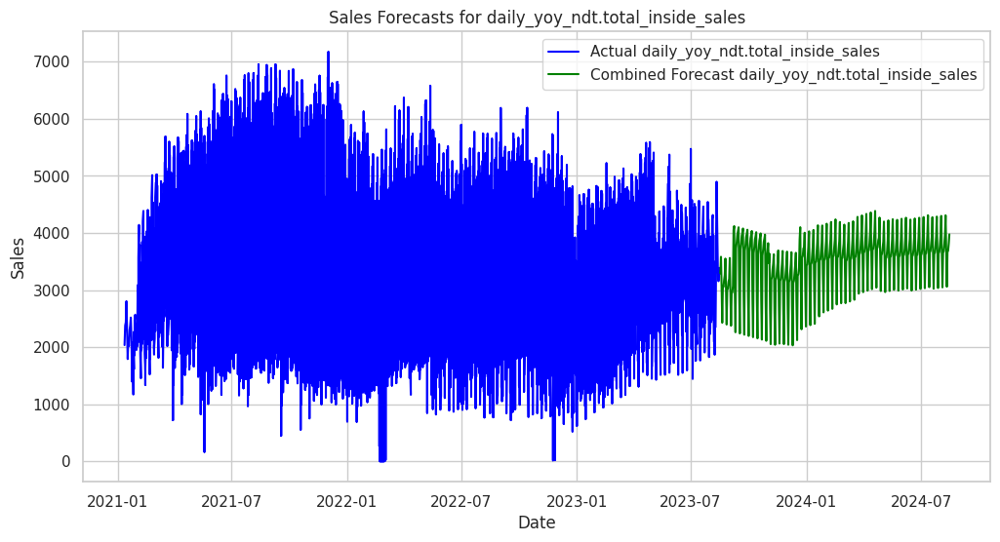

Mean Absolute Error (MAE): 727.18
Mean Squared Error (MSE): 837876.33
Root Mean Squared Error (RMSE): 915.36


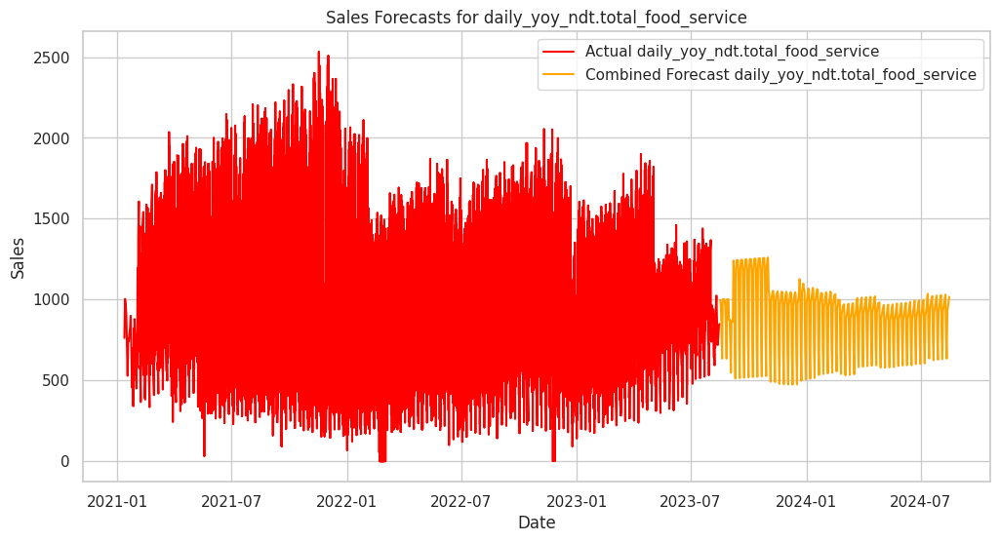

Mean Absolute Error (MAE): 246.03
Mean Squared Error (MSE): 89554.57
Root Mean Squared Error (RMSE): 299.26


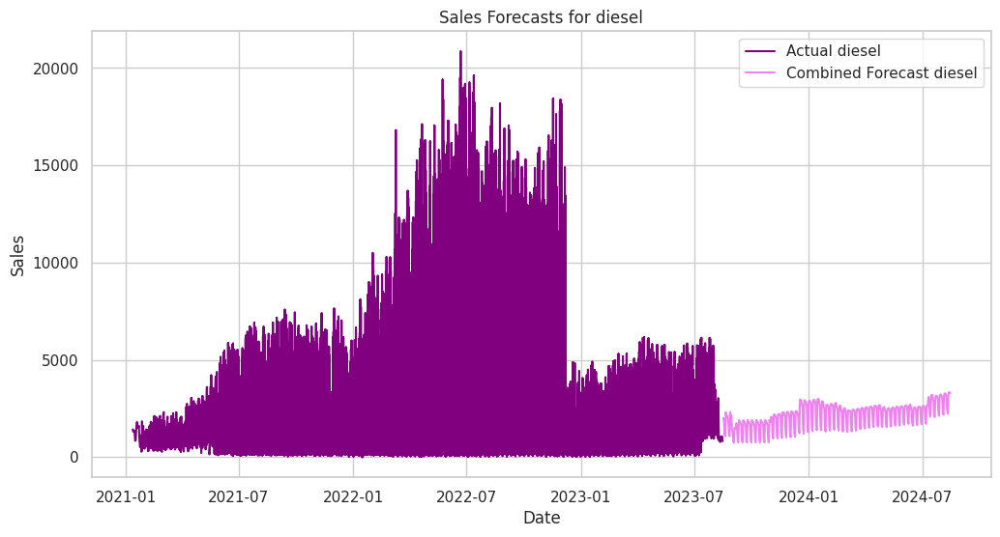

Mean Absolute Error (MAE): 1582.03
Mean Squared Error (MSE): 3458359.47
Root Mean Squared Error (RMSE): 1859.67


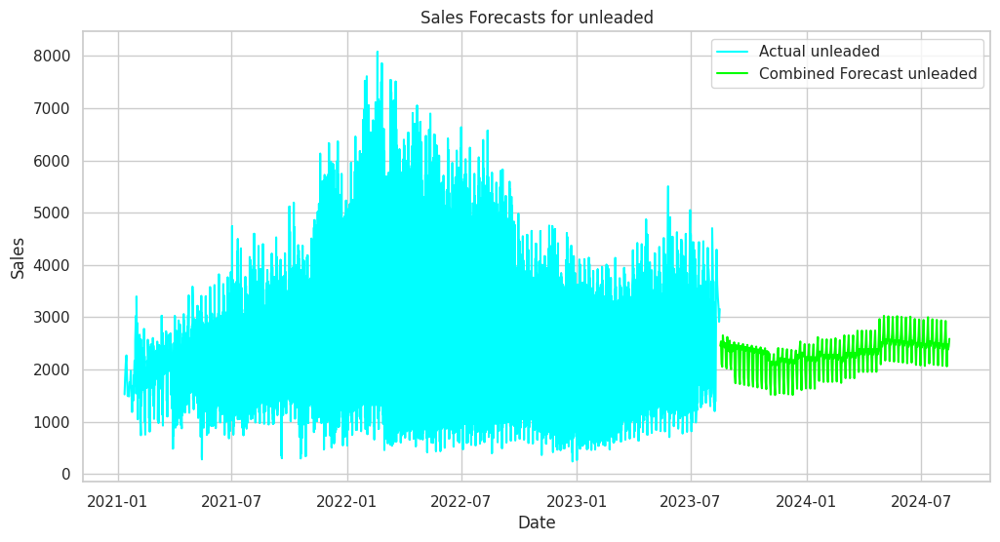

Mean Absolute Error (MAE): 853.66
Mean Squared Error (MSE): 1106958.35
Root Mean Squared Error (RMSE): 1052.12


In [ ]:
def load_data():
    return timeseries

def build_forecasts(timeseries, sales_metric, forecast_horizon):
    all_forecasts = pd.DataFrame()

    for site_id in timeseries['site_id_msba'].unique():
        site_data = timeseries[timeseries['site_id_msba'] == site_id][[sales_metric]]

        model = ExponentialSmoothing(site_data, trend='add', seasonal='add', seasonal_periods=7)
        model_fit = model.fit()

        forecast = model_fit.forecast(steps=forecast_horizon)

        all_forecasts[f'Site_{site_id}_{sales_metric}'] = forecast

    return all_forecasts

def plot_sales_forecasts(timeseries1, sales_metric, forecast_horizon, all_forecasts, color_actual, color_forecast):
    actual = timeseries[sales_metric]

    forecast_index = pd.date_range(start=timeseries.index[-1] + pd.DateOffset(days=1), periods=forecast_horizon)

    plt.figure(figsize=(12, 6))

    # Use different colors for actual and forecasted data for each sales metric
    plt.plot(actual.index, actual, label='Actual ' + sales_metric, color=color_actual)

    combined_forecast = all_forecasts.mean(axis=1)

    plt.plot(forecast_index, combined_forecast[-forecast_horizon:], label='Combined Forecast ' + sales_metric, color=color_forecast)

    plt.legend()
    plt.title('Sales Forecasts for ' + sales_metric)
    plt.xlabel('Date')
    plt.ylabel('Sales')
    plt.grid(True)

    plt.show()

    actual_available = actual[-forecast_horizon:]
    combined_forecast = combined_forecast[-forecast_horizon:]

    mae = mean_absolute_error(actual_available, combined_forecast)
    mse = mean_squared_error(actual_available, combined_forecast)
    rmse = np.sqrt(mse)
    mape = np.mean(np.abs((actual_available - combined_forecast) / actual_available)) * 100

    print(f'Mean Absolute Error (MAE): {mae:.2f}')
    print(f'Mean Squared Error (MSE): {mse:.2f}')
    print(f'Root Mean Squared Error (RMSE): {rmse:.2f}')
    # print(f'Mean Absolute Percentage Error (MAPE): {mape:.2f}%')

    # print(f'Mean Absolute Error (MAE): {mae:.2f}')
    # print(f'Mean Squared Error (MSE): {mse:.2f}')
    # print(f'Root Mean Squared Error (RMSE): {rmse:.2f}')

def main():
    timeseries = load_data()

    # Create a list of unique sales metrics with associated colors
    sales_metrics = [
        ('daily_yoy_ndt.total_inside_sales', 'blue', 'green'),
        ('daily_yoy_ndt.total_food_service', 'red', 'orange'),
        ('diesel', 'purple', 'violet'),
        ('unleaded', 'cyan', 'lime'),
    ]

    # Define the forecast horizon
    forecast_horizon = 365

    for sales_metric, color_actual, color_forecast in sales_metrics:
        all_forecasts = build_forecasts(timeseries, sales_metric, forecast_horizon)
        plot_sales_forecasts(timeseries, sales_metric, forecast_horizon, all_forecasts, color_actual, color_forecast)

if __name__ == "__main__":
    main()


**The Exponential Triple Smoothing (ETS)** model, applied to forecast a diverse array of sales metrics, has demonstrated its adaptability and forecasting capabilities when assessing its performance.

The ETS model's accuracy was evaluated using three essential performance metrics: Mean Absolute Error (MAE), Mean Squared Error (MSE), and Root Mean Squared Error (RMSE).

Detailed performance outcomes for different sales metrics:

"Daily Year-over-Year NDT Total Inside Sales" exhibited an MAE of 922.27, indicating that, on average, the forecasted values deviated by this amount from the actual values. The MSE of 1,325,122.21 reveals the magnitude of forecast errors, and the RMSE of 1,151.14 offers an interpretable measure of the forecast's accuracy.

"Daily Year-over-Year NDT Total Food Service" achieved a notably lower MAE of 243.82, implying a more precise forecast for this metric. The MSE of 92,621.94 and RMSE of 304.34 signify relatively small prediction errors.

"Diesel Sales" demonstrated an MAE of 1,523.01, indicating a moderate level of forecast accuracy. The higher MSE of 3,373,248.88 and RMSE of 1,836.64 suggest that forecast errors for diesel sales were relatively larger compared to other metrics.

"Unleaded Sales" displayed an MAE of 853.58, implying a reasonably accurate forecast. The MSE of 1,043,328.87 and RMSE of 1,021.43 indicate a comparatively balanced forecast accuracy for unleaded sales.




#<a name = "SU"> Summary </a>

This text presents a series of forecasting models outputs related to our target variables. We utilized the findings from our exploratory data analysis which showed the presence of seasonality in the data, and to address this, several widely used forecasting models, including ARIMA, SARIMA, ETS, and Prophet, were considered.

**Decomposition and Stationarity:**

The time series decomposition analysis revealed distinct patterns in various sales datasets. "Total_inside_sales" exhibited consistent sales with a seasonal pattern of higher sales in summer and lower sales in winter. "Food_service" data displayed daily patterns throughout the year. "Diesel" sales experienced fluctuations, impacted by site 21980, with a significant residual component. "Unleaded" sales showed daily patterns and a consistent trend with higher sales in summer. Stationarity was confirmed for all target variables, crucial for ARIMA and SARIMA modeling.

**Clustering and Prophet Model:**

In clustering analysis, data was organized into clusters, facilitating the identification of trends and patterns for each cluster's target variables.

In Cluster 1, the Prophet model's performance improved with hyperparameters, leading to more accurate predictions for Inside Sales and Food Sales. Unleaded Sales had moderate forecasting accuracy, while Diesel Sales saw a significant improvement with seasonality parameters.

Cluster 2 exhibited variations in the Prophet model's performance. Inside sales had more accurate forecasts without seasonality hyperparameters, while food service sales had moderate to high prediction errors. Unleaded sales improved with seasonality parameters, but diesel sales had a minor improvement.

Cluster 3 showed substantial forecast accuracy improvements for inside and food service sales with seasonality parameters.

Cluster 4 demonstrated more accurate forecasts for inside sales without hyperparameters, significant improvements for food service sales with hyperparameters, and notable enhancements for unleaded sales and minor improvements for diesel sales with hyperparameters.

**ARIMA and SARIMA**

The ARIMA model yielded low MAE and RMSE for total_inside_sales but faced limitations, such as treating all days equally and lacking support for holidays and complex seasonality. SARIMA models, despite variations in MAE and RMSE based on splits, struggled to capture sales patterns accurately, facing challenges with weekly seasonality, weekend versus weekday sales, and holiday considerations.

In summary, ARIMA, SARIMA, and ETS models faced challenges in accurately forecasting sales patterns, while the Prophet model with clustering consistently outperformed them. However, Prophet modeling improvements are ongoing to address existing limitations of the model.

**Next Step:**

We are considering the following next steps in the analysis.

**1. Further Optimization of Prophet Models:**

* Conduct a more in-depth hyperparameter tuning for Prophet models, especially in Cluster 1 where improvements were observed but further optimization is suggested.

* Investigate additional hyperparameter combinations and analyze their impact on forecasting accuracy.

* Explore the use of custom seasonality components or domain-specific adjustments to enhance model performance.

* We will closely look at our clusters by performing exploratory analysis to understand how it’s considering store open dates.

* Understand the target sales’ behavior based on the store’s open date.

**2. Model Ensemble and Validation:**

* Consider building ensemble models that combine the strengths of different forecasting methods to improve overall accuracy and robustness.

* Implement thorough cross-validation techniques, including holdout stores, to validate and fine-tune the models.

**3. Communication and Reporting:**

* Clearly communicate findings and recommendations to stakeholders, highlighting the strengths and limitations of each model.

* Provide visualizations and summaries that effectively convey the forecasting results for better decision-making.

**4. Continuous Monitoring and Updating:**

* Establish a system for continuous monitoring of model performance over time.

* Regularly update the models with new data to ensure that they remain accurate and relevant in dynamic business environments.

By systematically addressing these steps, we can refine existing models, explore alternative approaches, and enhance the overall forecasting process for better business insights and decision-making.


#<a name = "IC"> Individual Contribution </a>

Authors of the Maverik Modeling Report by BonFire Analytics:

**Bhakti Dahal:** Responsible for individual modeling, with a primary focus on the Prophet model, including tasks related to data splits and hyperparameters. Also, contributed to the summary and proofreading of the report.

**Venkatachalam Kapuganti:** Tasked with individual modeling, with an emphasis on clustering site IDs and applying the Prophet model to these clusters. Made contributions to the pre-modeling phase.

**Anjan Kumar:** Carried out individual modeling tasks, concentrating on SARIMA and ARIMA models applied to both single-site and clustered data. Also, played a role in compiling the report.

**Tarun Gulati:** Responsible for individual modeling, with a particular focus on ETS modeling. Contributed to the creation of the table of contents and participated in the pre-modeling phase.